# Data-driven Time-Dependent Biogas Model of the Anaerobic Digester

## Preamble

In [37]:
# Here all the required packages are loaded
import numpy as np
import os
import pandas as pd
from matplotlib.lines import Line2D
from pymatreader import read_mat
from sklearn.model_selection import train_test_split
from copy import deepcopy
from sklearn.model_selection import GridSearchCV
from sklearn.base import clone
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cross_decomposition import PLSRegression
from statsmodels.tsa.vector_ar.var_model import VAR
import plotly.figure_factory as ff
from statsmodels.tsa.statespace.varmax import VARMAX
from scipy.stats import norm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import dill
from sklearn.model_selection import PredefinedSplit
from sklearn.svm import SVR
from hypopt import GridSearch
import seaborn as sns
from sklearn.linear_model import Ridge
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import tree
from scipy import stats
from ipywidgets import widgets, interactive, interact

## Loading and preparation of the data

First we load the data from a local directory.

The data is available from my Google drive at:
https://drive.google.com/file/d/183sbF1tTeYw0HyxDqr-7paquMeNOuLp2/view?usp=sharing

In [38]:
# Redirect to the directory where the file is located
directory = '/Users/Sebastian/Documents/Leif/DTU/Speciale/Runs'
os.chdir(directory)

# Load the file with the pymatreader function read_mat
data_mat = read_mat('Data.mat')

In [39]:
# Defining column names
#Input variable names
Header_X_in = ['Q','T','TSS',r'$\mathbf{NO_x}$', r'$\mathbf{NH_4}$', r'$\mathbf{CH_3COO^-}$', r'$\mathbf{PO^{3-}_4}$', 'kLa', 'pH']

#Output variable names
Header_out = ['TSS', r'$\mathbf{NO_x}$', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$']

In [40]:
# Creating a Pandas dataframe for the 10 different data sets.

# The following function is used to standardize the data, so it has mean 0 and variance 1
scaler = StandardScaler()

X_a = pd.DataFrame(scaler.fit_transform(data_mat['in_sensor']), columns = Header_X_in)
X_b = pd.DataFrame(scaler.fit_transform(data_mat['reac1_sensor']), columns = Header_X_in)
X_c = pd.DataFrame(scaler.fit_transform(data_mat['reac2_sensor']), columns = Header_X_in)
X_d = pd.DataFrame(scaler.fit_transform(data_mat['reac2_combine']), columns = Header_X_in)
X_e = pd.DataFrame(scaler.fit_transform(data_mat['reac3_sensor']), columns = Header_X_in)
X_f = pd.DataFrame(scaler.fit_transform(data_mat['reac4_sensor']), columns = Header_X_in)
X_g = pd.DataFrame(scaler.fit_transform(data_mat['reac5_sensor']), columns = Header_X_in)
X_h = pd.DataFrame(scaler.fit_transform(data_mat['reac6_sensor']), columns = Header_X_in)
X_i = pd.DataFrame(scaler.fit_transform(data_mat['reac7_sensor']), columns = Header_X_in)
y = pd.DataFrame(data_mat['Effluent'], columns = Header_out)
# Creating a Pandas dataframe for the settler effluent data set.
yscale = pd.DataFrame(scaler.fit_transform(data_mat['Effluent']), columns = Header_out)

In [13]:
def mean_and_variance(X):
    split = int(len(X)/4)
    X1, X2, X3, X4 = X[0:split], X[split:split*2], X[split*2:split*3], X[split*3:]
    mean = pd.DataFrame([X1.mean(), X2.mean(), X3.mean(), X4.mean()])
    var = pd.DataFrame([X1.var(), X2.var(), X3.var(), X4.var()])
    
    return mean, var
    

In [14]:
#This function plots 4 consecutive means, variances and a histogram of the data

def mvh(X,title,graphsize):
    mean, var = mean_and_variance(X)
    number_of_variables = X.shape[1]
    plot_names = ['Means', 'Variances', 'Histogram']
    
    fig, ax = plt.subplots(number_of_variables, 3, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 20, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    
    for i in range(number_of_variables):
        ax[i,0].scatter([1,2,3,4], mean[X.columns.tolist()[i]])
        ax[i,1].scatter([1,2,3,4], var[X.columns.tolist()[i]])
        ax[i,2].hist(X[X.columns.tolist()[i]], bins = 100)
        ax[i,0].set_ylim(-1,1)
        ax[i,0].axhline(y=0, color='r', linestyle = '-')
        ax[i,1].set_ylim(-1+np.mean(var[X.columns.tolist()[i]]),np.mean(var[X.columns.tolist()[i]])+1)
        ax[i,1].axhline(y=np.mean(var[X.columns.tolist()[i]]), color='r', linestyle = '-')
        
        
    for i in range(number_of_variables):
        for j in range(3):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            

In [15]:
# The following function plots the first daily, weekly, monthly 
#and yearly data for the variables in a dataset
def dwmy(X,title,graphsize):
    
    
    number_of_variables = X.shape[1]
    fig, ax = plt.subplots(number_of_variables, 4, figsize = (20, graphsize))
    times_words = ['Daily','Weekly','Monthly','Yearly']
    
    fig.suptitle(title, fontsize = 20, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    
    for j in range(4):
        for i in range(number_of_variables):
            times = [4*24, 4*24*7, 4*24*30, 4*24*364]
            ax[i,j].plot(X[X.columns.tolist()[i]][:times[j]])
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
        ax[0,j].set_title(times_words[j], fontweight = 'bold', fontsize = 15)

In [16]:
# The following function plots the ACF and PACF for the different variables

def ACFPACF(X, title, graphsize):
    
    #This drops the kLa column in the non-aerated tanks, since it does not compute,
    #and the data is also just a constant 0, so not much information to grab!
    # This works even though the actual mean of all columns is zero, due to numerical precision
    
    if 'kLa' in X.columns:
        if (np.mean(X['kLa']) == 0.0):
            X = X.drop(['kLa'], axis = 1)
    
    
    
    #Defining a significance level
    significance_level = 0.167
    fig, ax = plt.subplots(X.shape[1],2, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 30, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    number_of_variables = X.shape[1]
    plot_names = ['ACF', 'PCAF']

    for i in range(number_of_variables):
        plot_acf(X[X.columns.tolist()[i]], ax = ax[i,0], title = None)
        plot_pacf(X[X.columns.tolist()[i]], ax = ax[i,1], title = None)
    
    for i in range(number_of_variables):
        for j in range(2):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            ax[i,j].set_ylim(-1.1,1.1)

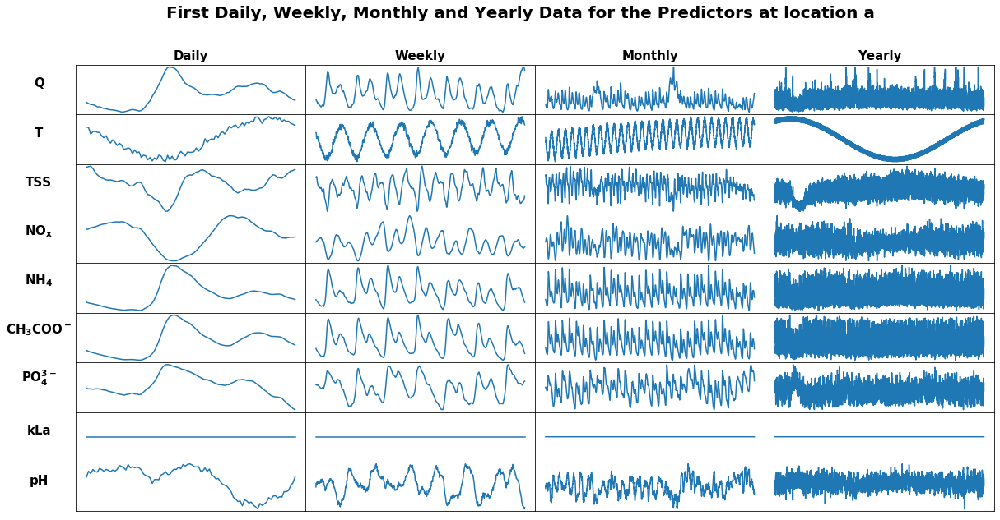

In [186]:
dwmy(X_a, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location a', 10)

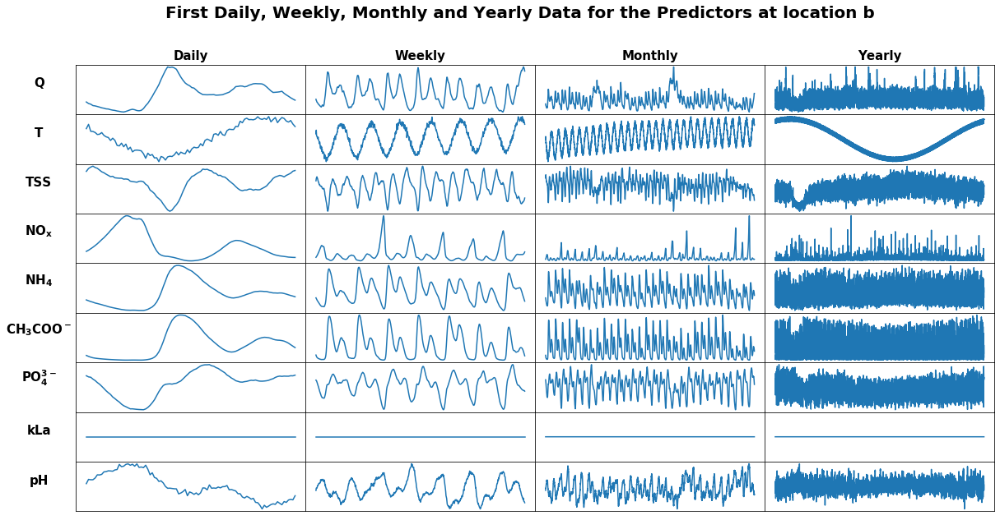

In [10]:
dwmy(X_b, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location b', 10)

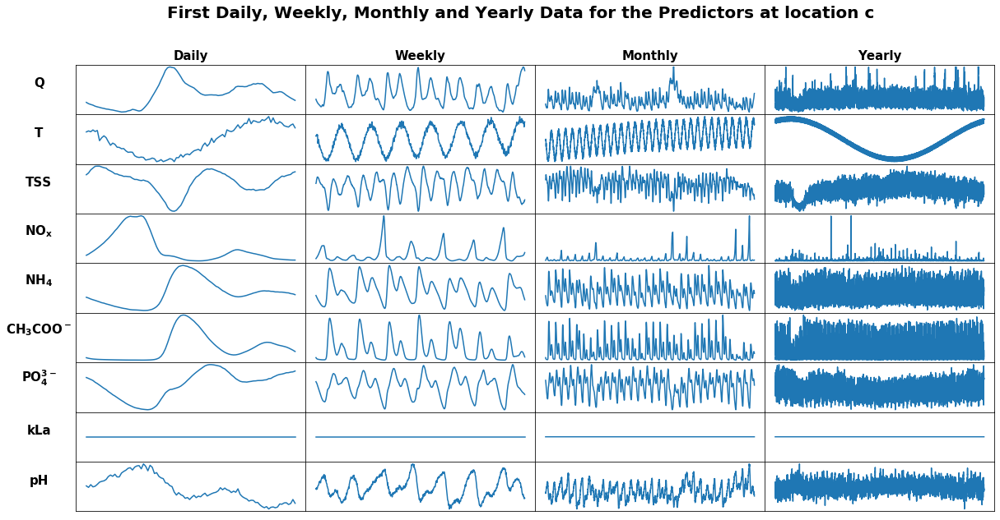

In [11]:
dwmy(X_c, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location c', 10)

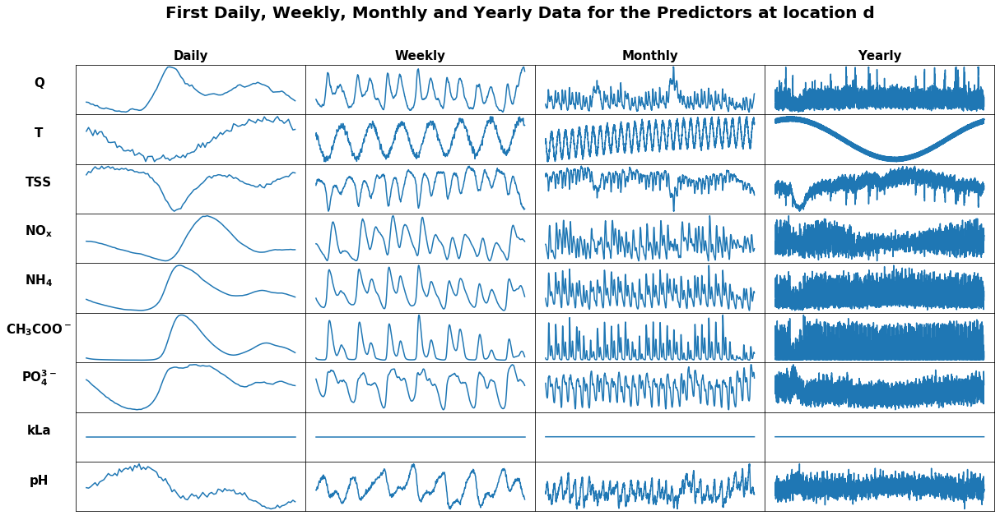

In [12]:
dwmy(X_d, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location d', 10)

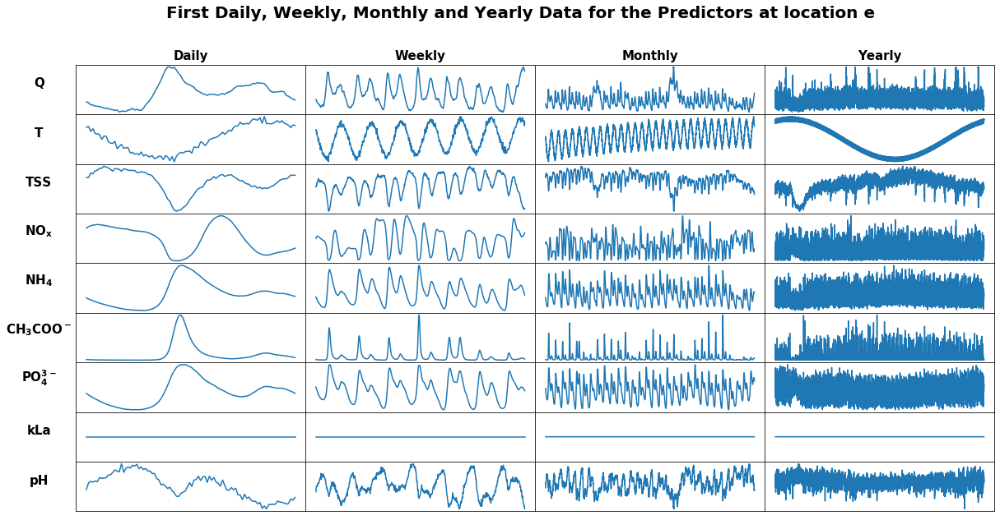

In [301]:
dwmy(X_e, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location e', 10)

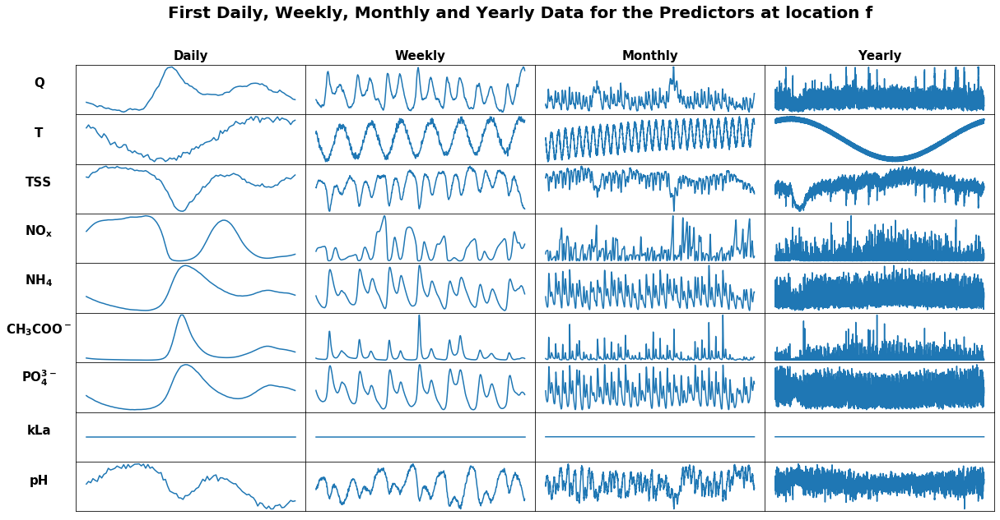

In [302]:
dwmy(X_f, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location f', 10)

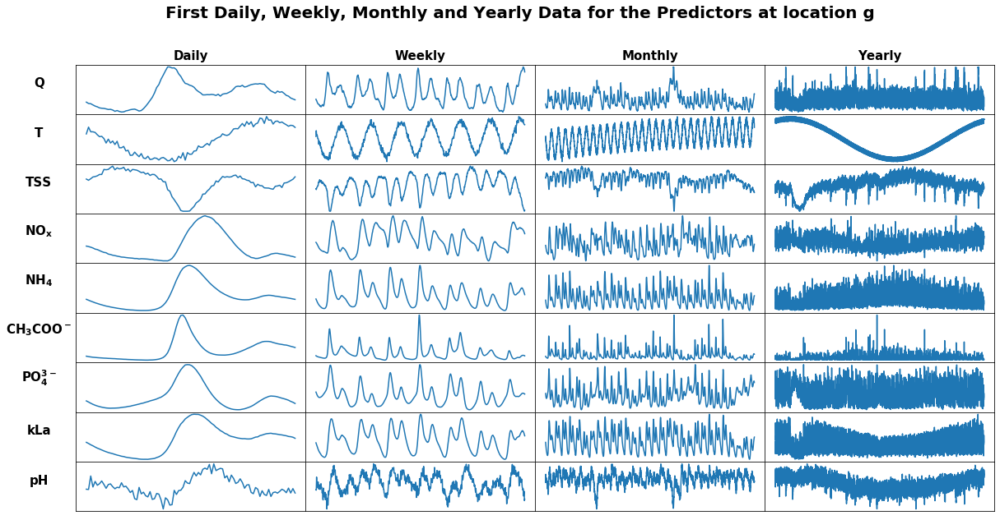

In [303]:
dwmy(X_g, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location g', 10)

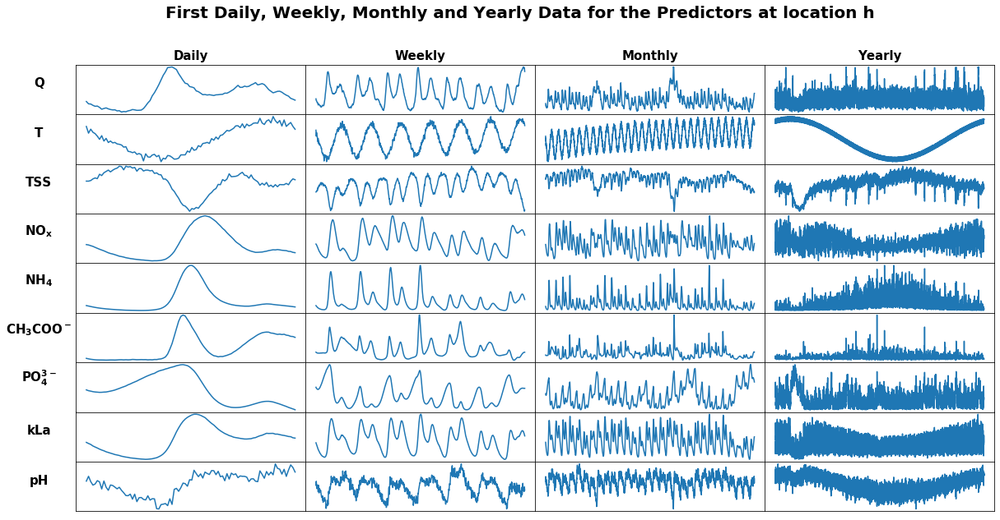

In [304]:
dwmy(X_h, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location h', 10)

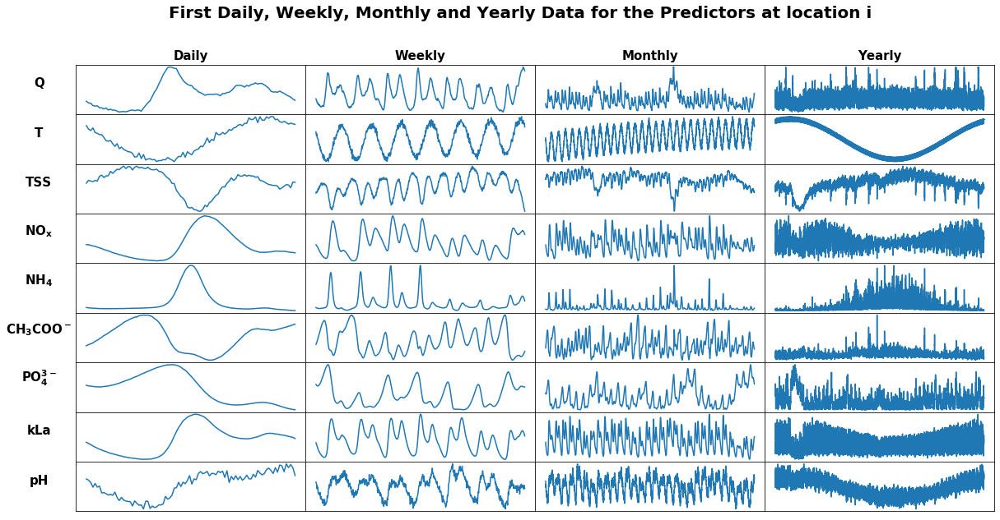

In [305]:
dwmy(X_i, 'First Daily, Weekly, Monthly and Yearly Data for the Predictors at location i', 10)

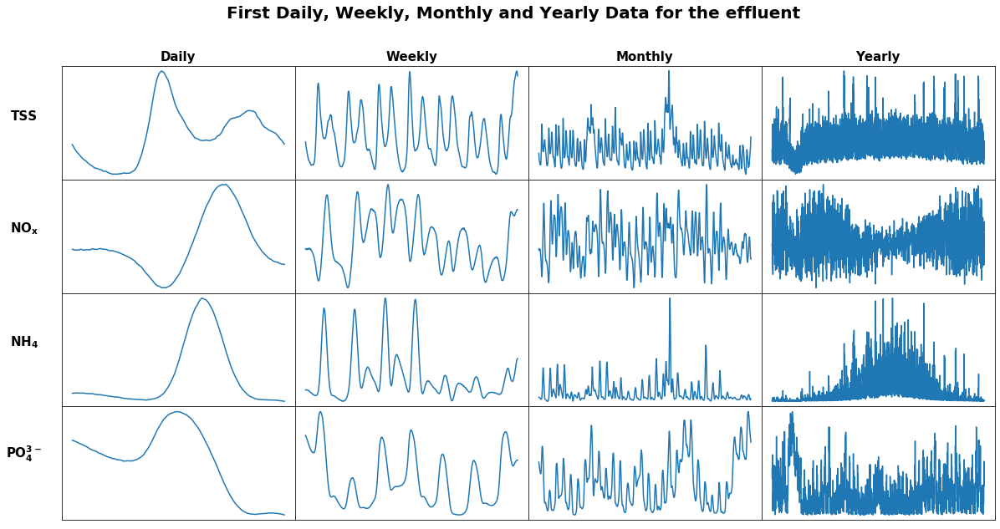

In [189]:
dwmy(yscale, 'First Daily, Weekly, Monthly and Yearly Data for the effluent', 10)

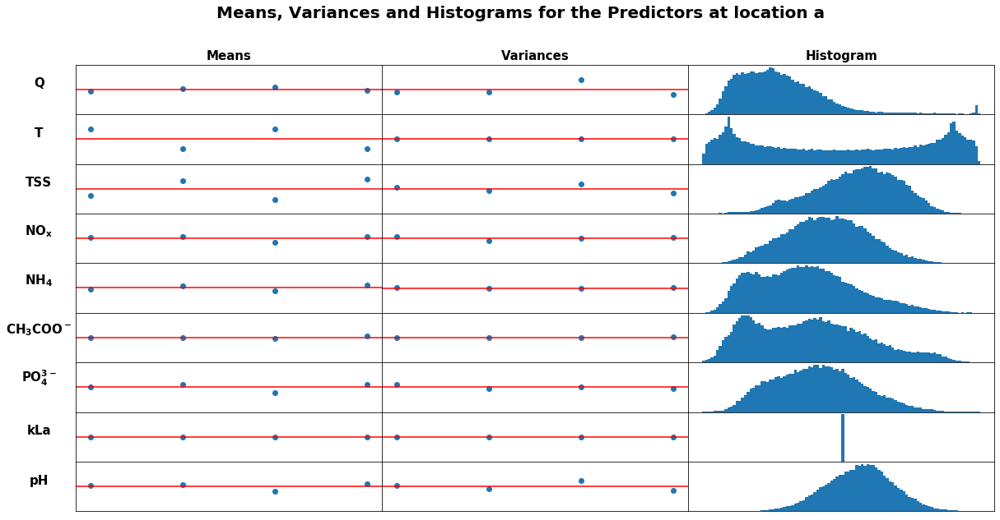

In [13]:
mvh(X_a, r'Means, Variances and Histograms for the Predictors at location a', 10)

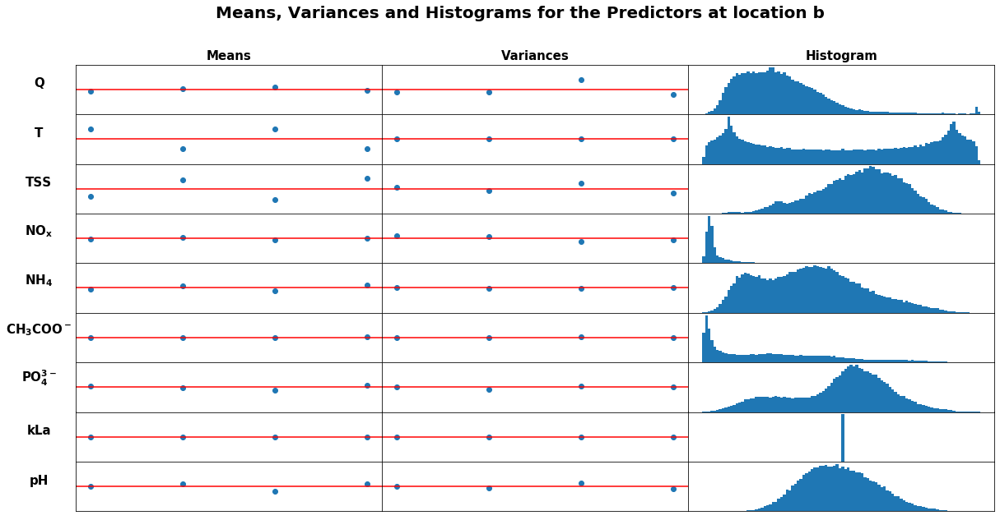

In [308]:
mvh(X_b, r'Means, Variances and Histograms for the Predictors at location b', 10)

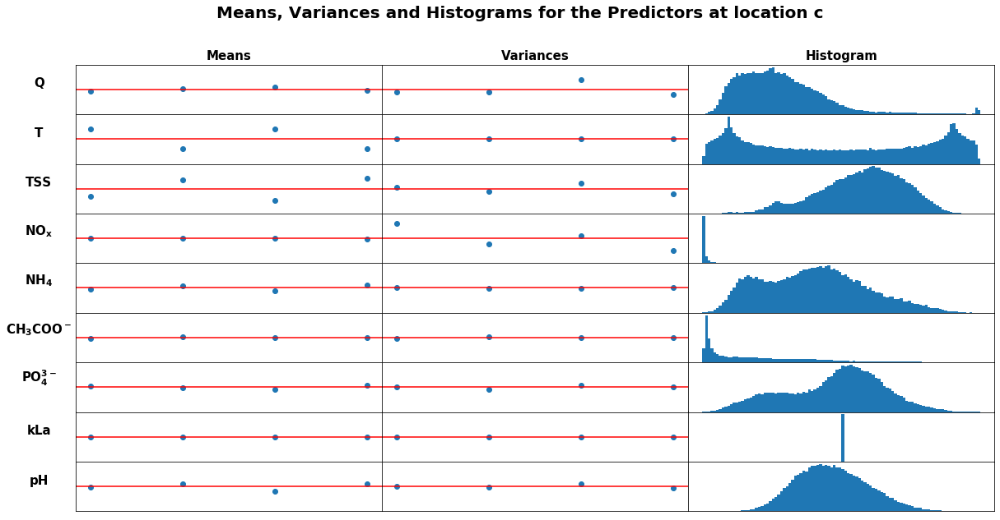

In [309]:
mvh(X_c, r'Means, Variances and Histograms for the Predictors at location c', 10)

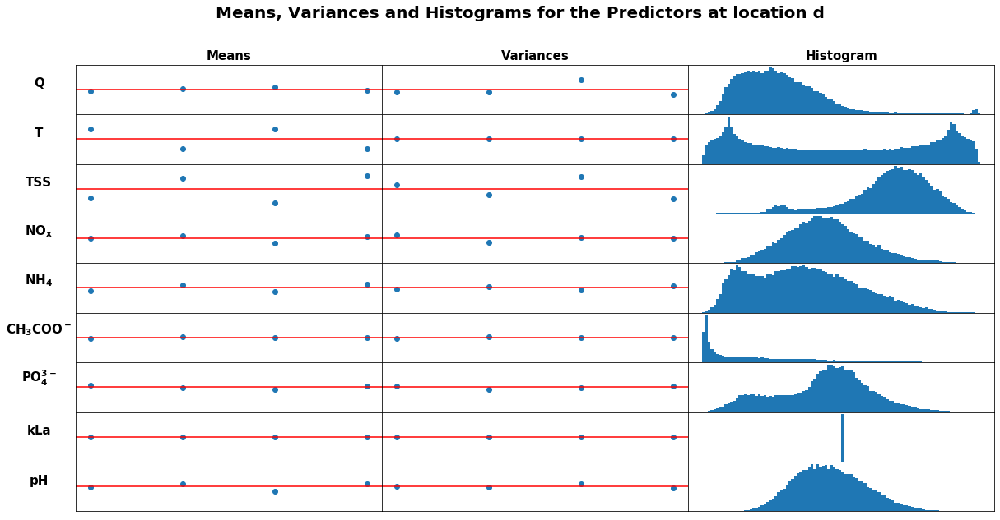

In [310]:
mvh(X_d, r'Means, Variances and Histograms for the Predictors at location d', 10)

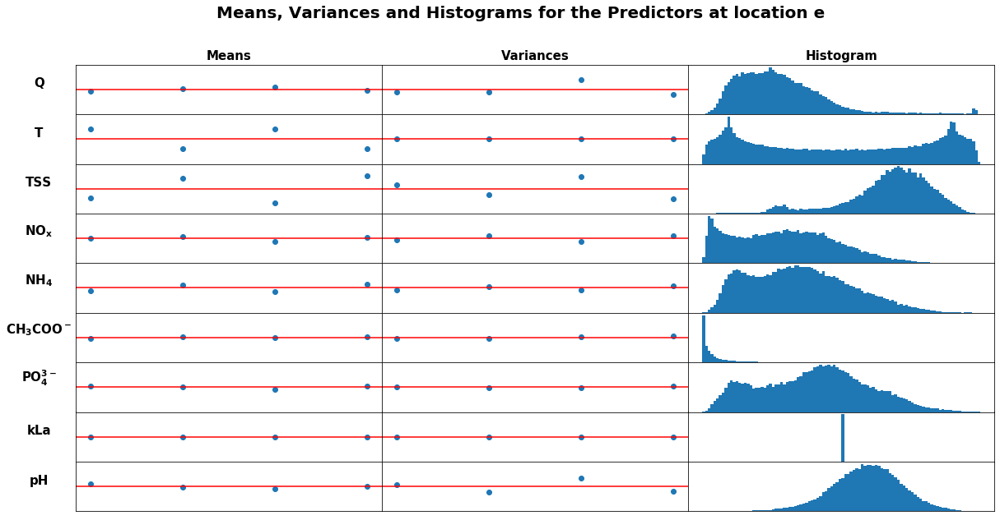

In [311]:
mvh(X_e, r'Means, Variances and Histograms for the Predictors at location e', 10)

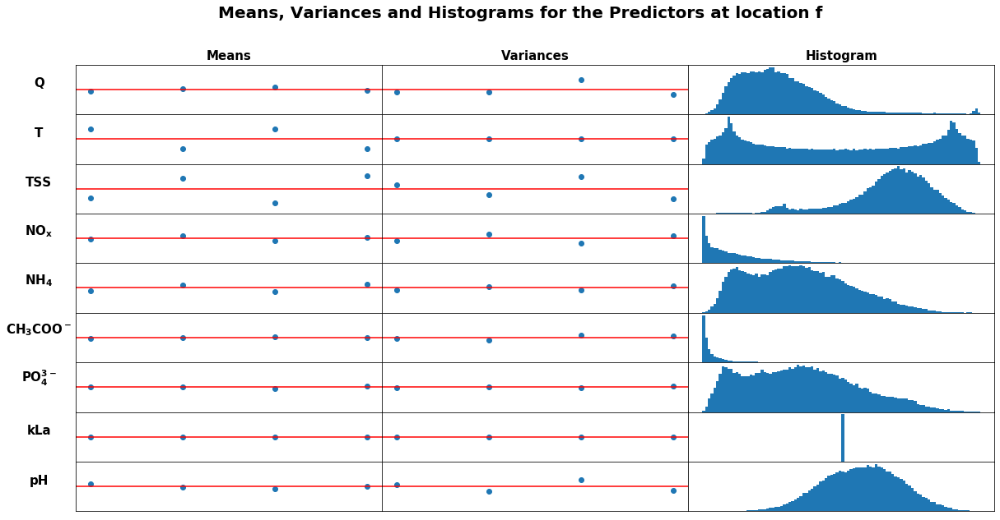

In [312]:
mvh(X_f, r'Means, Variances and Histograms for the Predictors at location f', 10)

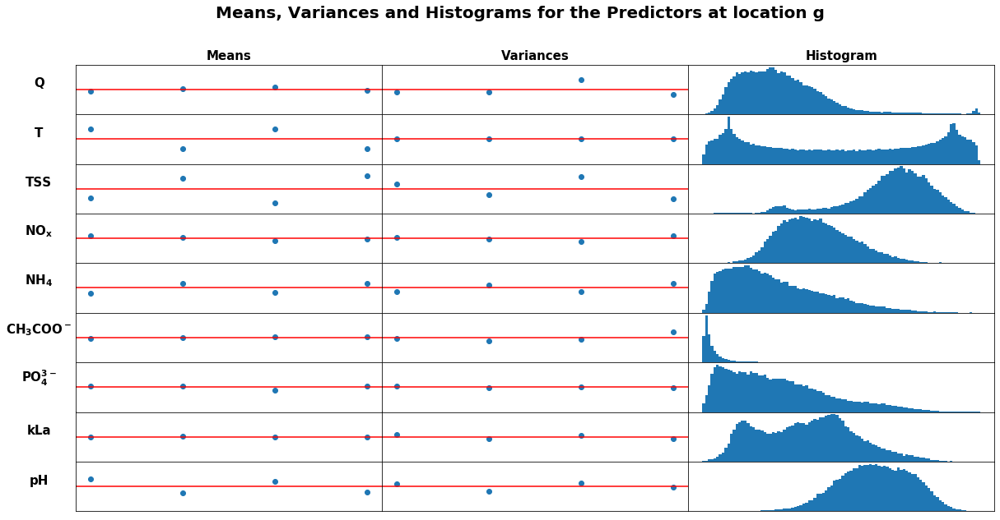

In [313]:
mvh(X_g, r'Means, Variances and Histograms for the Predictors at location g', 10)

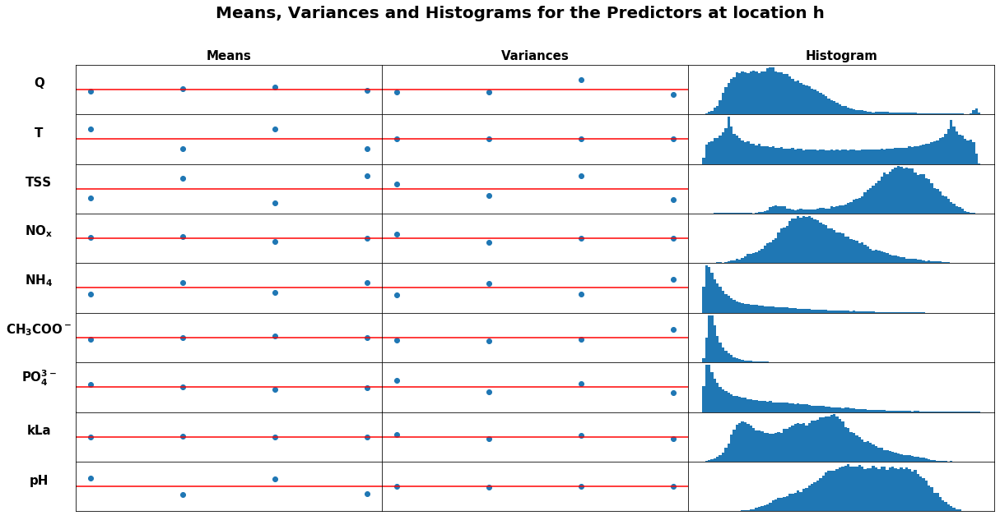

In [314]:
mvh(X_h, r'Means, Variances and Histograms for the Predictors at location h', 10)

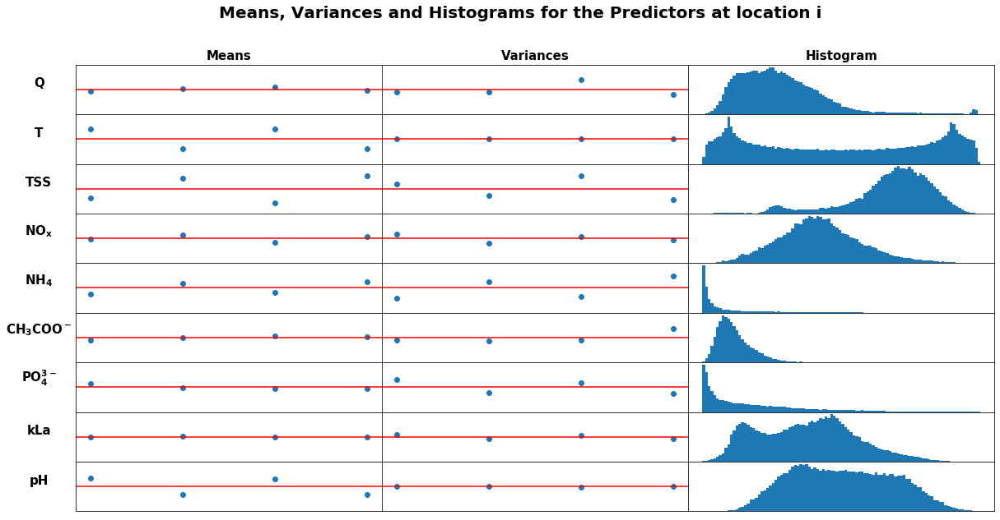

In [315]:
mvh(X_i, r'Means, Variances and Histograms for the Predictors at location i', 10)

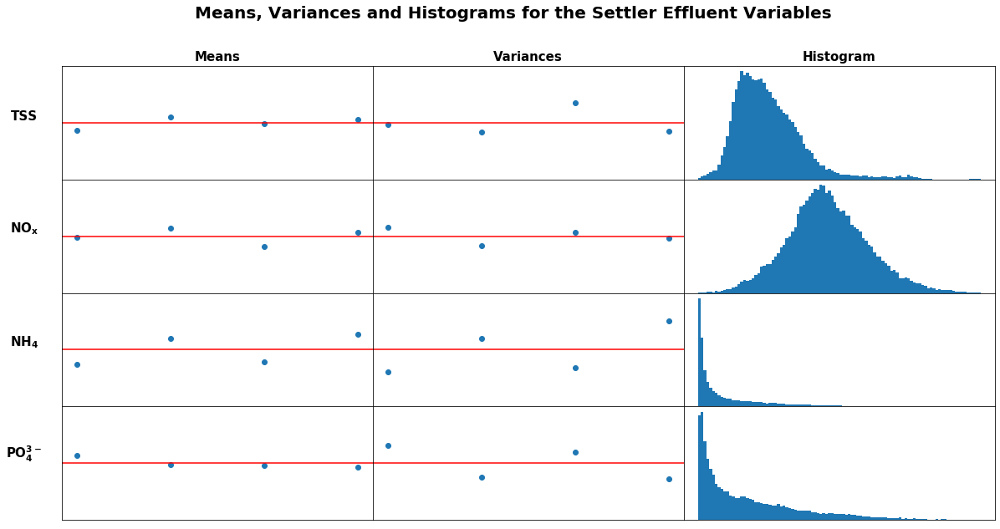

In [190]:
mvh(yscale, r'Means, Variances and Histograms for the Settler Effluent Variables', 10)

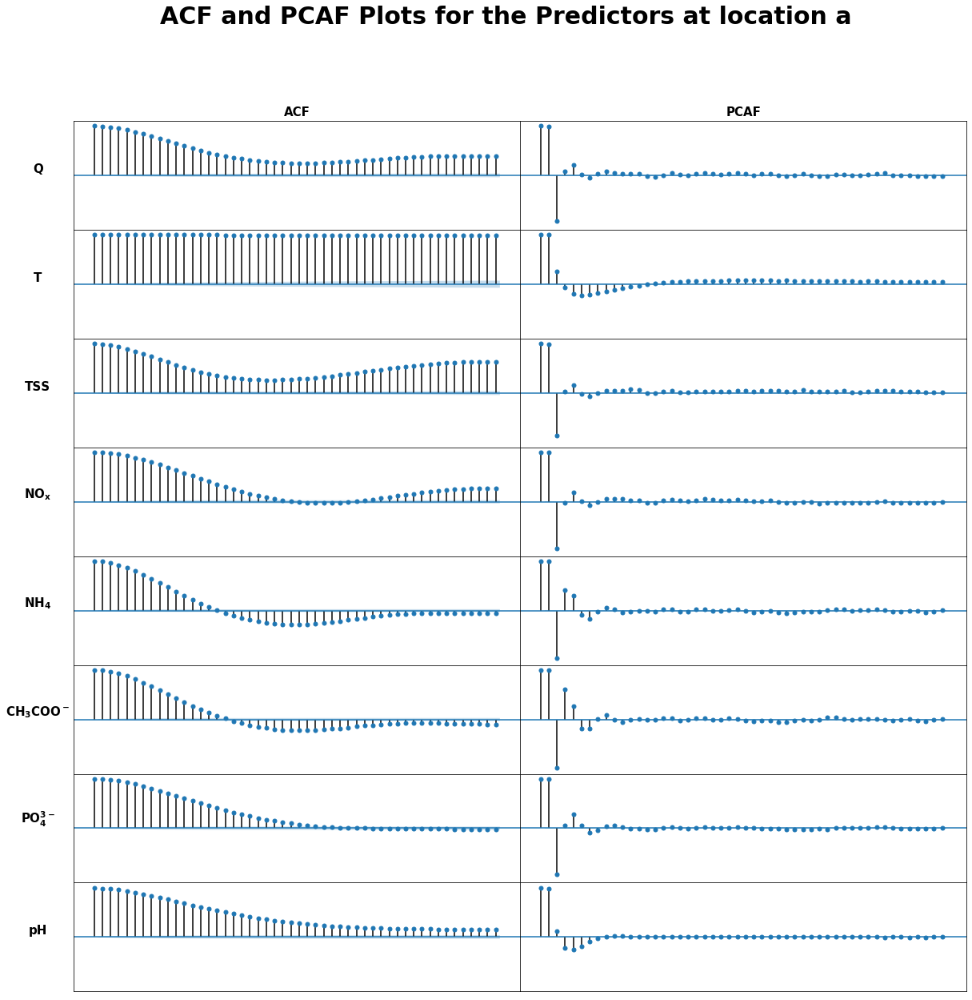

In [14]:
ACFPACF(X_a, 'ACF and PCAF Plots for the Predictors at location a',20)

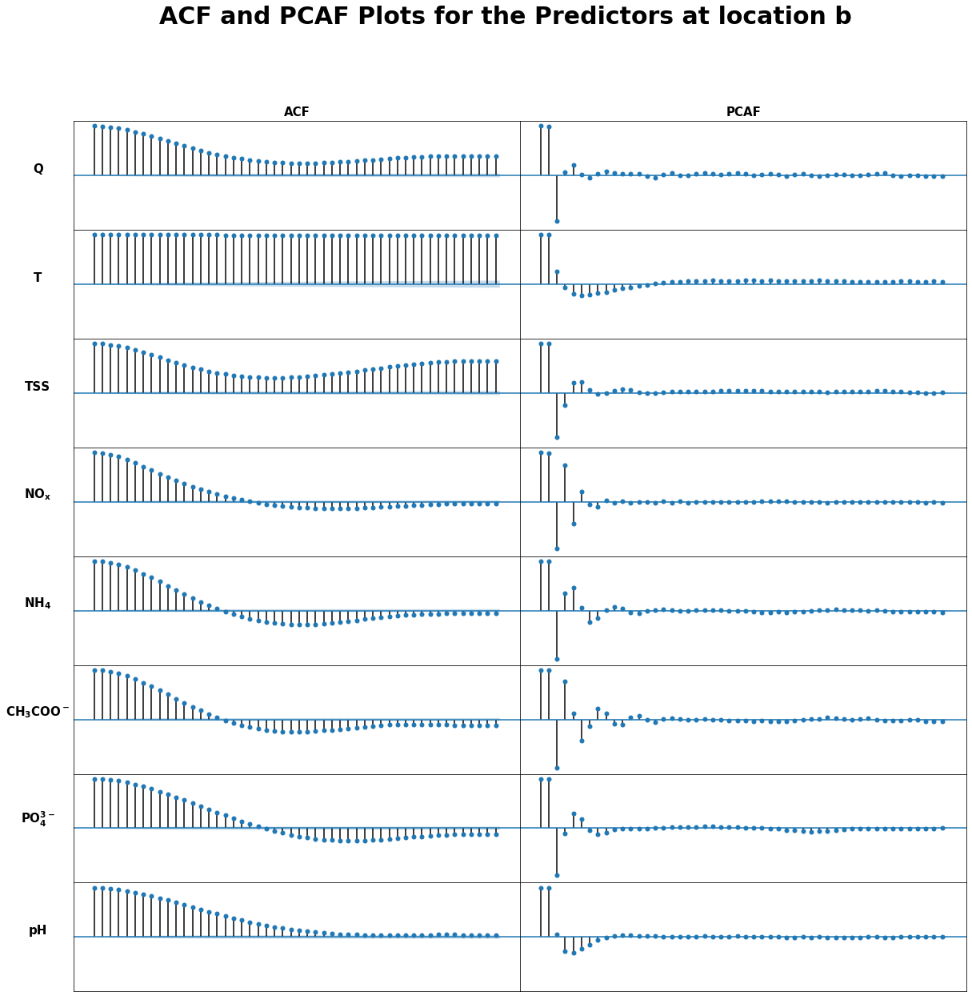

In [318]:
ACFPACF(X_b, 'ACF and PCAF Plots for the Predictors at location b',20)

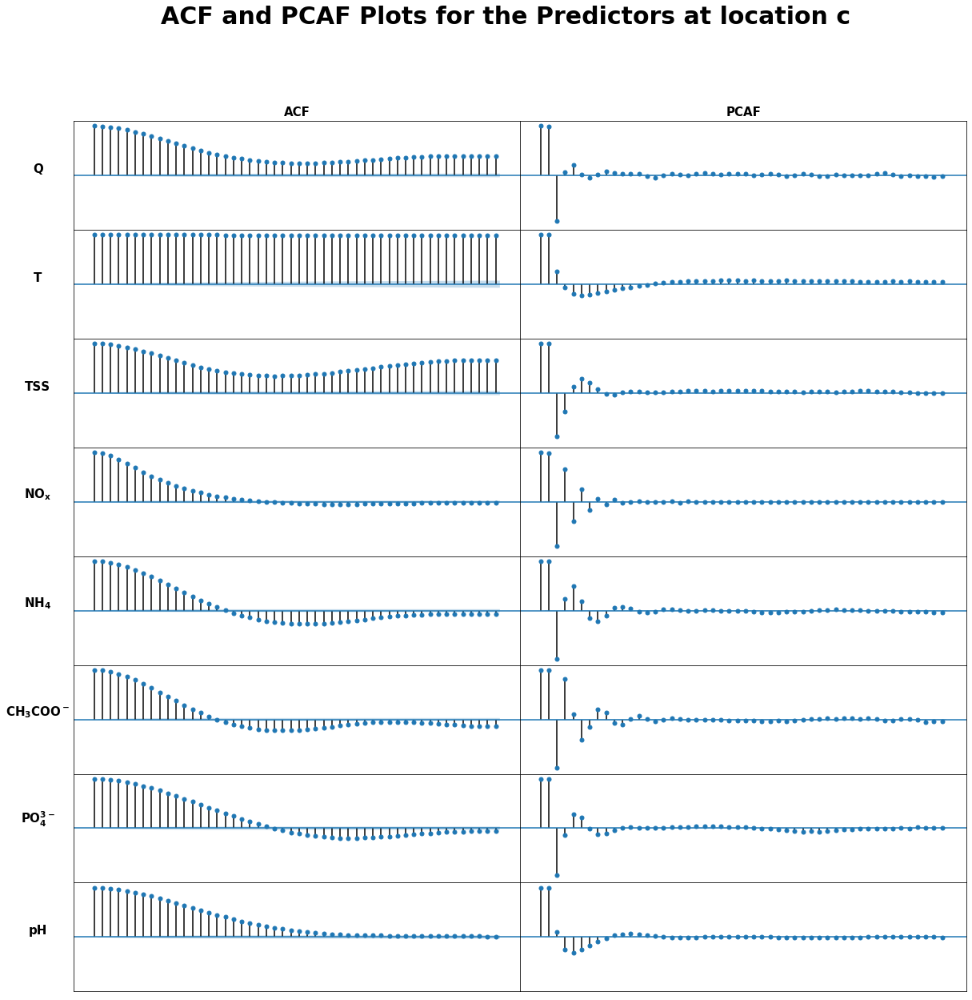

In [319]:
ACFPACF(X_c, 'ACF and PCAF Plots for the Predictors at location c',20)

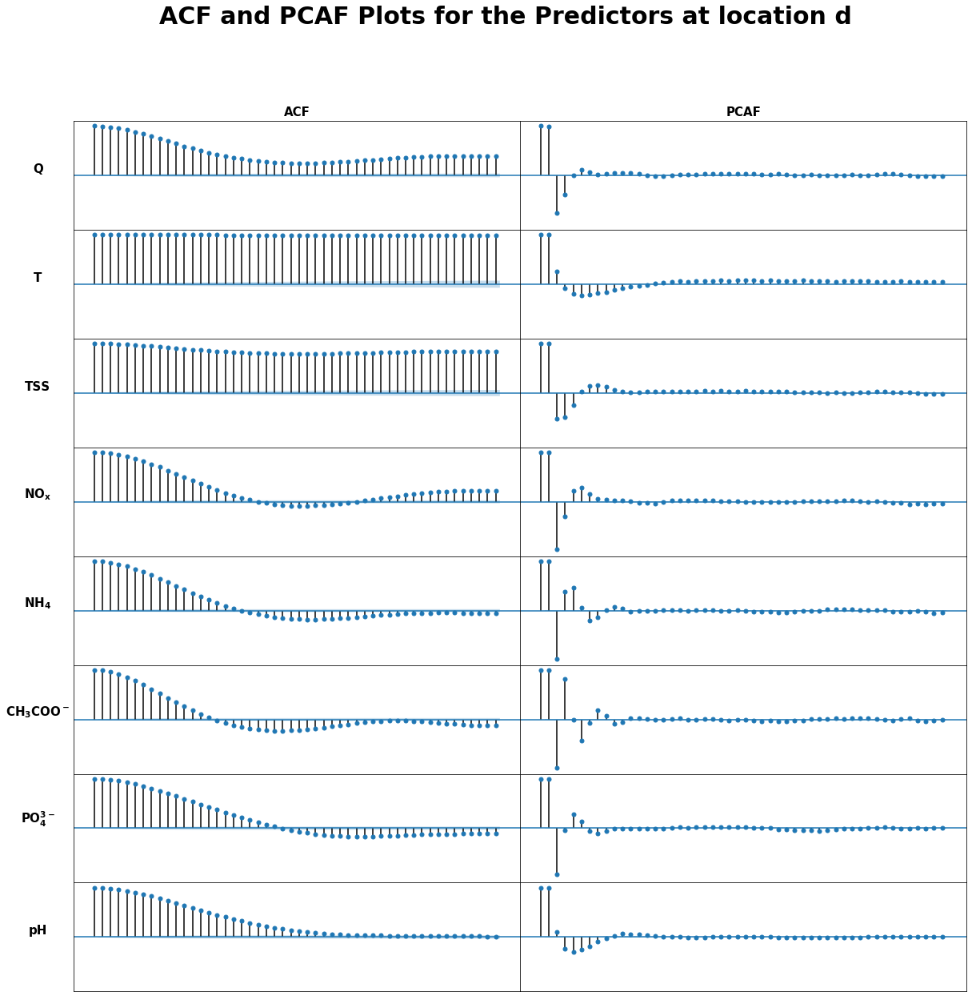

In [320]:
ACFPACF(X_d, 'ACF and PCAF Plots for the Predictors at location d',20)

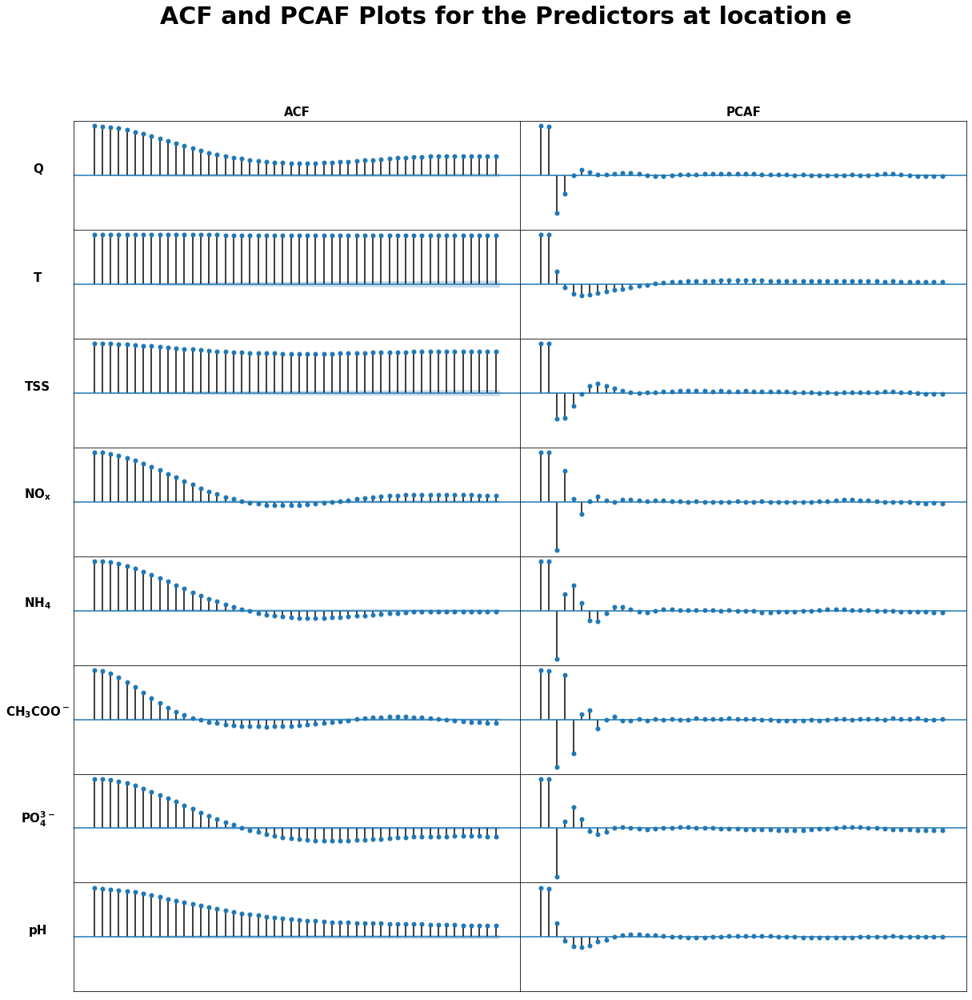

In [321]:
ACFPACF(X_e, 'ACF and PCAF Plots for the Predictors at location e',20)

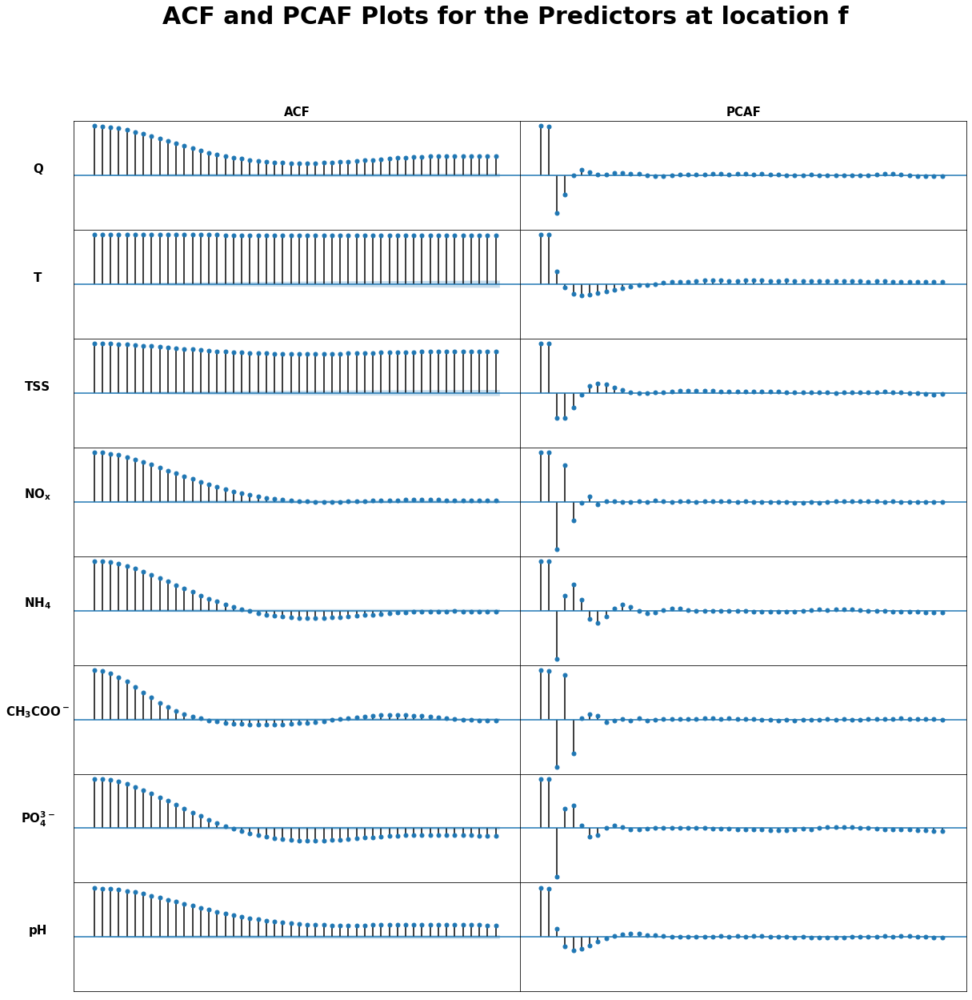

In [322]:
ACFPACF(X_f, 'ACF and PCAF Plots for the Predictors at location f',20)

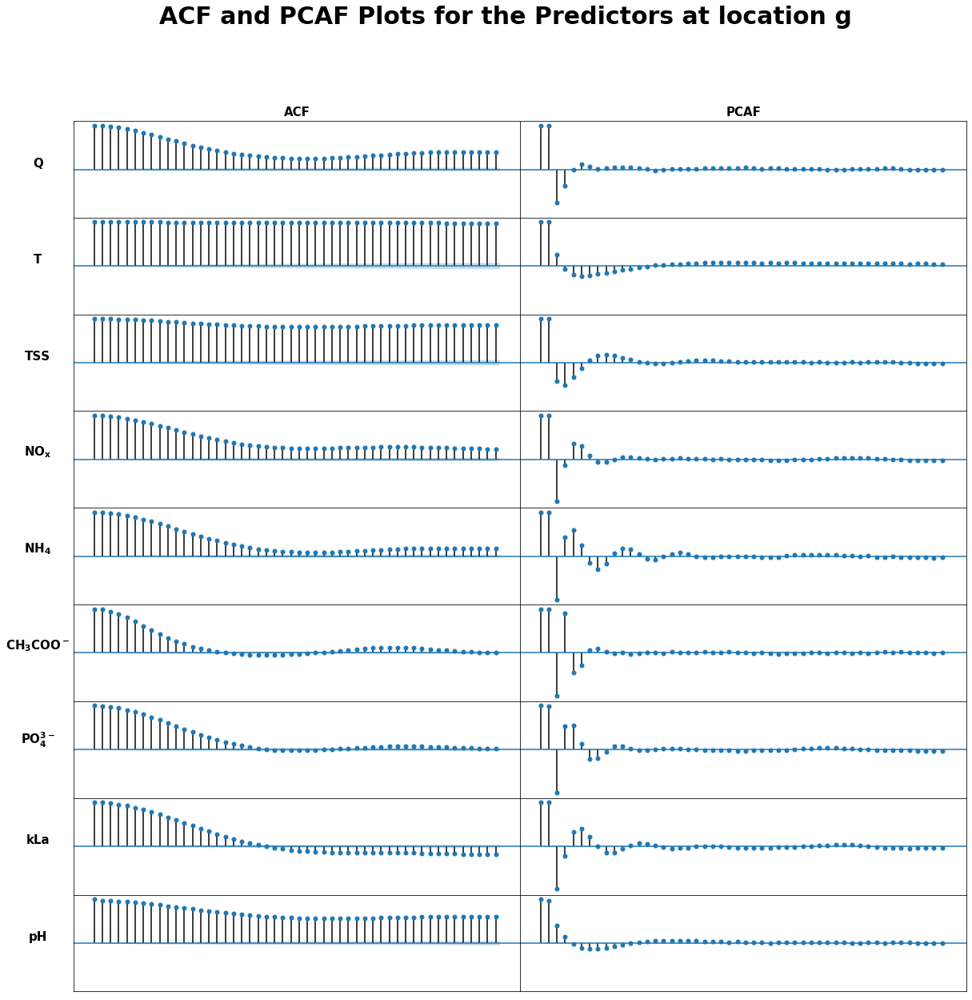

In [323]:
ACFPACF(X_g, 'ACF and PCAF Plots for the Predictors at location g',20)

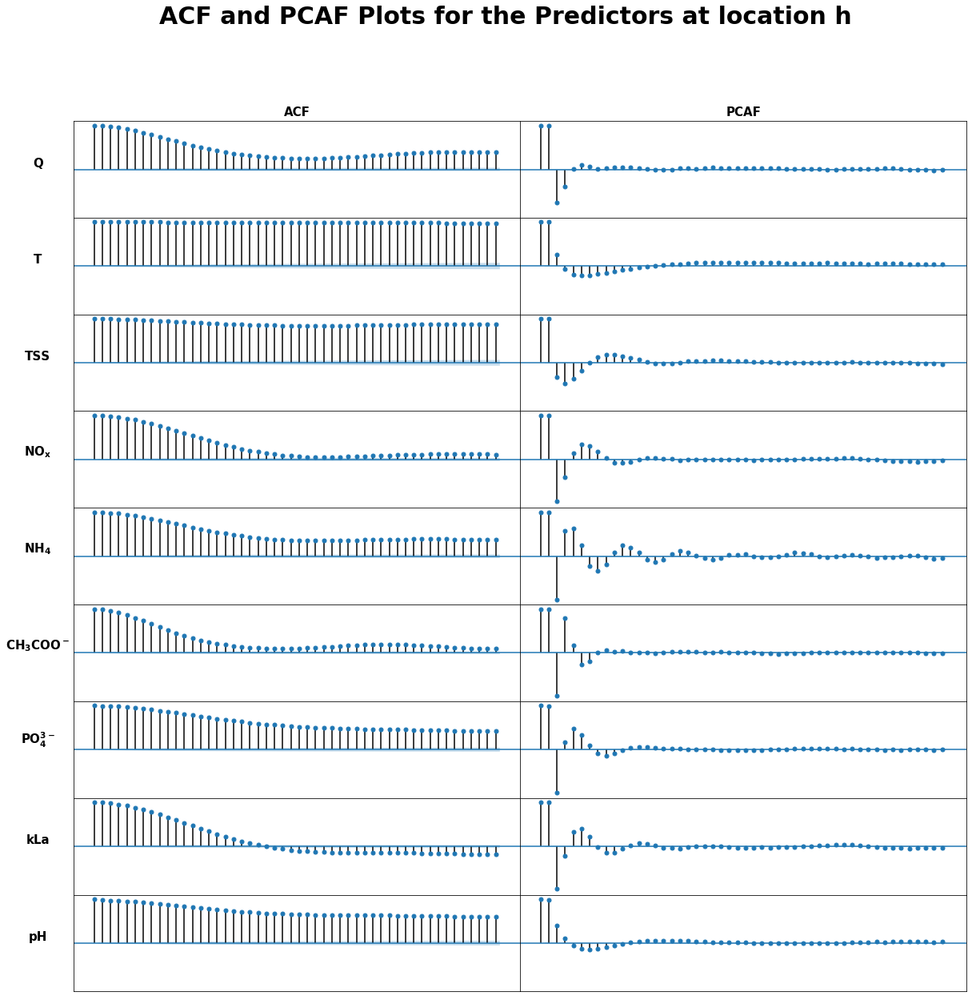

In [324]:
ACFPACF(X_h, 'ACF and PCAF Plots for the Predictors at location h',20)

/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


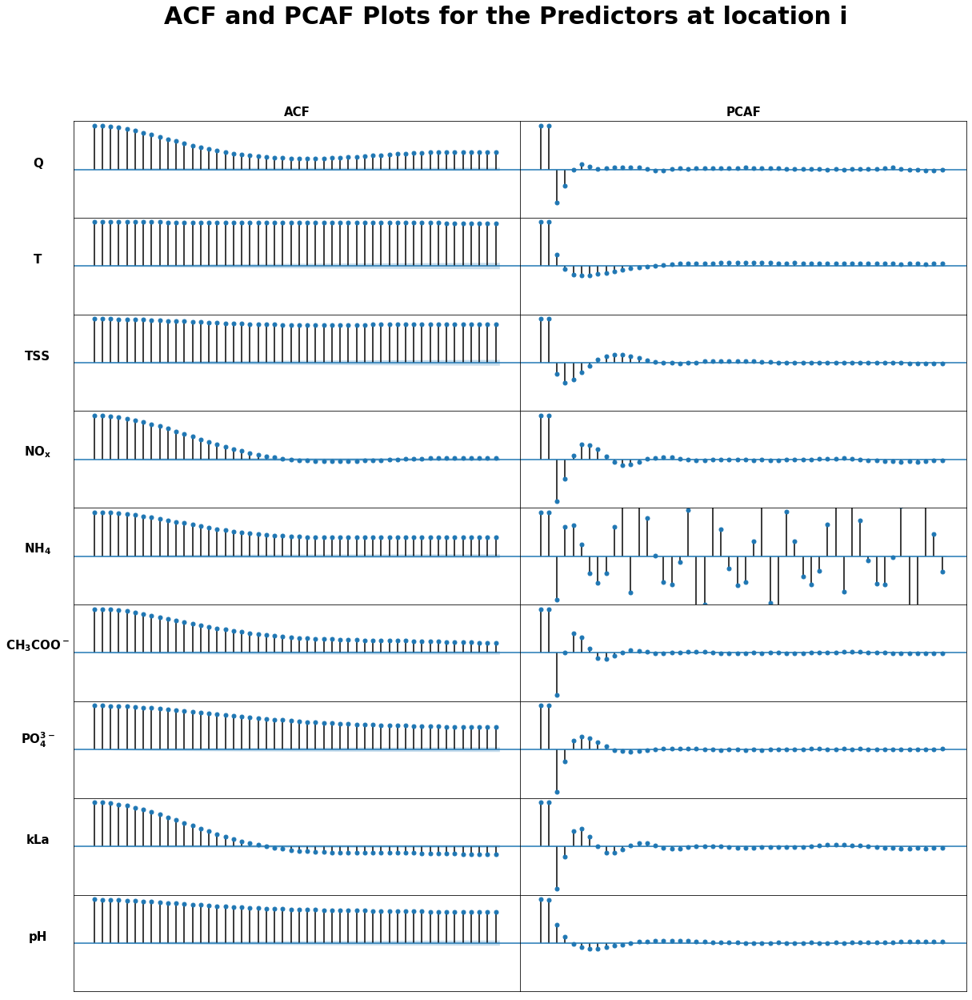

In [325]:
ACFPACF(X_i, 'ACF and PCAF Plots for the Predictors at location i',20)

/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


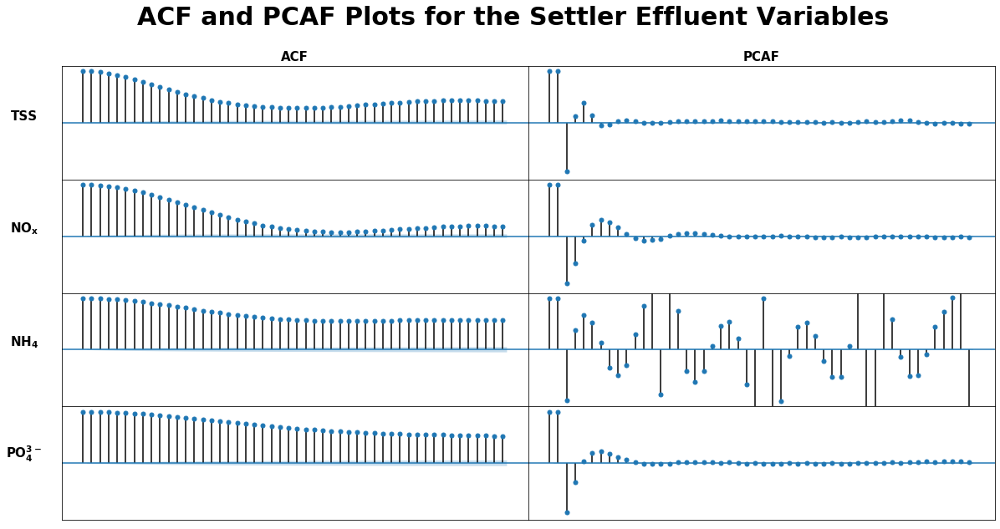

In [198]:
ACFPACF(yscale, 'ACF and PCAF Plots for the Settler Effluent Variables',10)

In [41]:
X_a_daily_diff = X_a.diff(96).dropna()
X_b_daily_diff = X_b.diff(96).dropna()
X_c_daily_diff = X_c.diff(96).dropna()
X_d_daily_diff = X_d.diff(96).dropna()
X_e_daily_diff = X_e.diff(96).dropna()
X_f_daily_diff = X_f.diff(96).dropna()
X_g_daily_diff = X_g.diff(96).dropna()
X_h_daily_diff = X_h.diff(96).dropna()
X_i_daily_diff = X_i.diff(96).dropna()
y_daily_diff = yscale.diff(96).dropna()

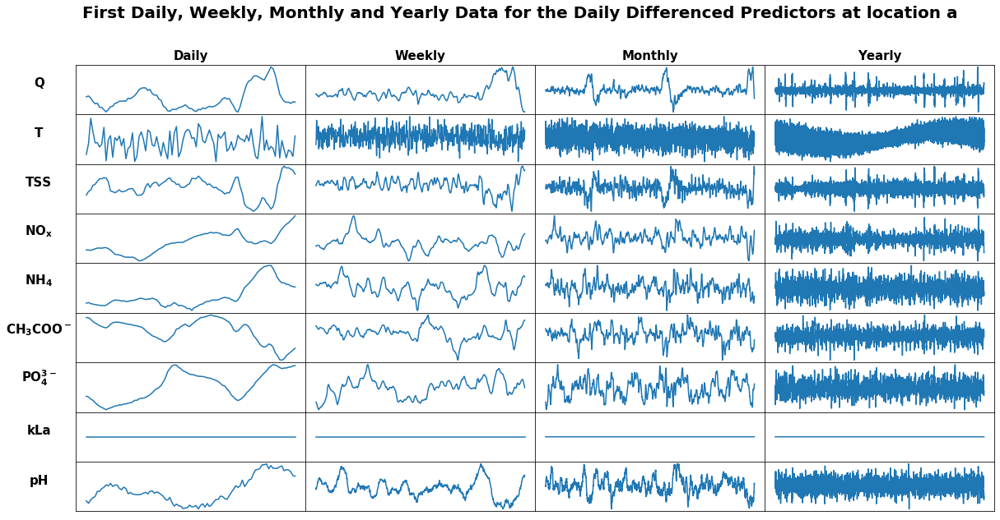

In [16]:
dwmy(X_a_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location a', 10)

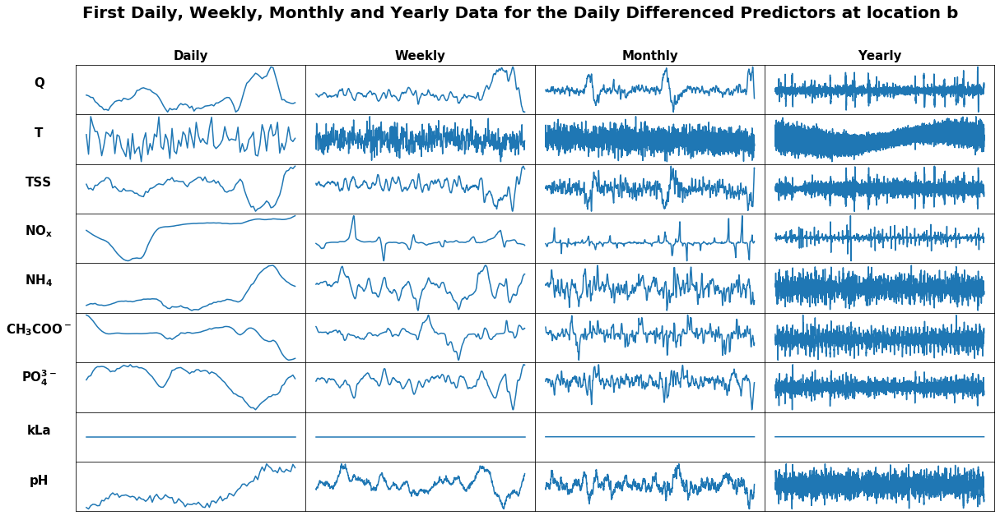

In [329]:
dwmy(X_b_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location b', 10)

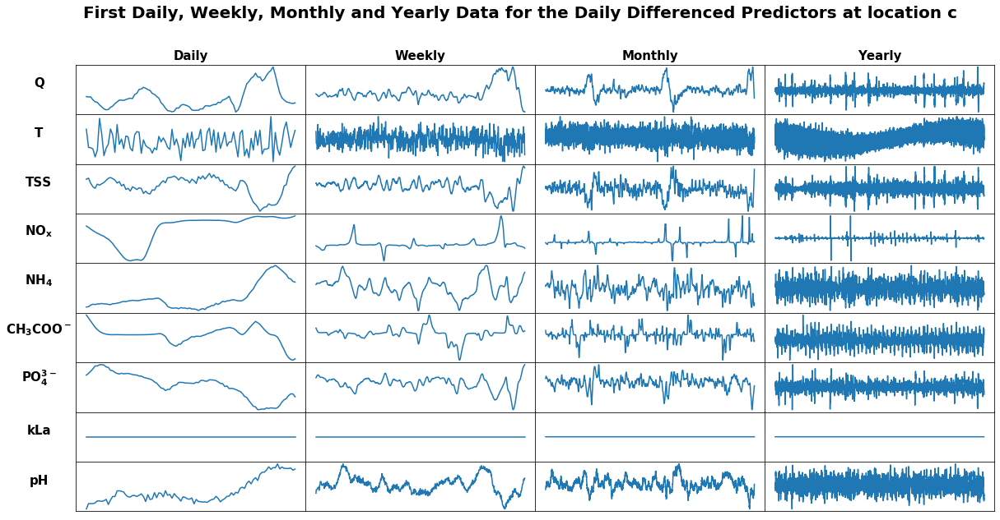

In [330]:
dwmy(X_c_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location c', 10)

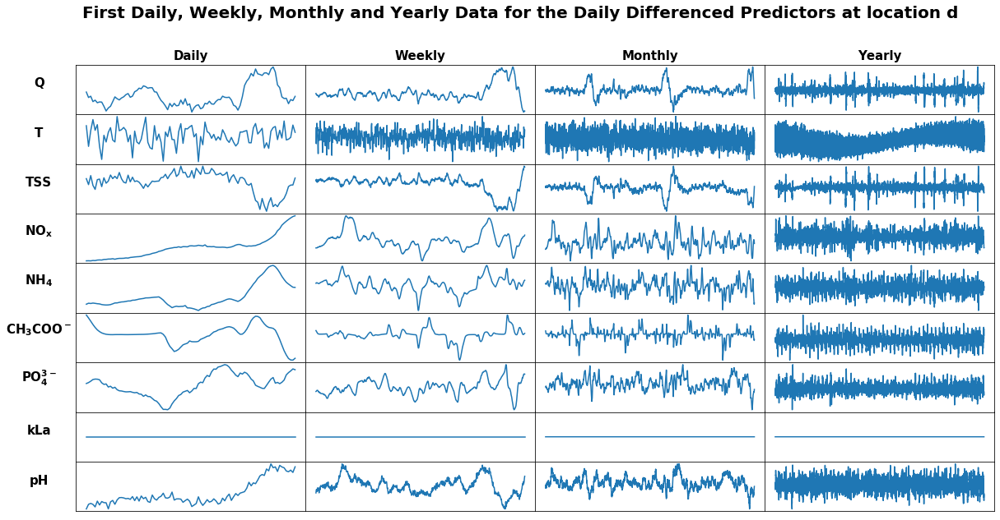

In [331]:
dwmy(X_d_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location d', 10)

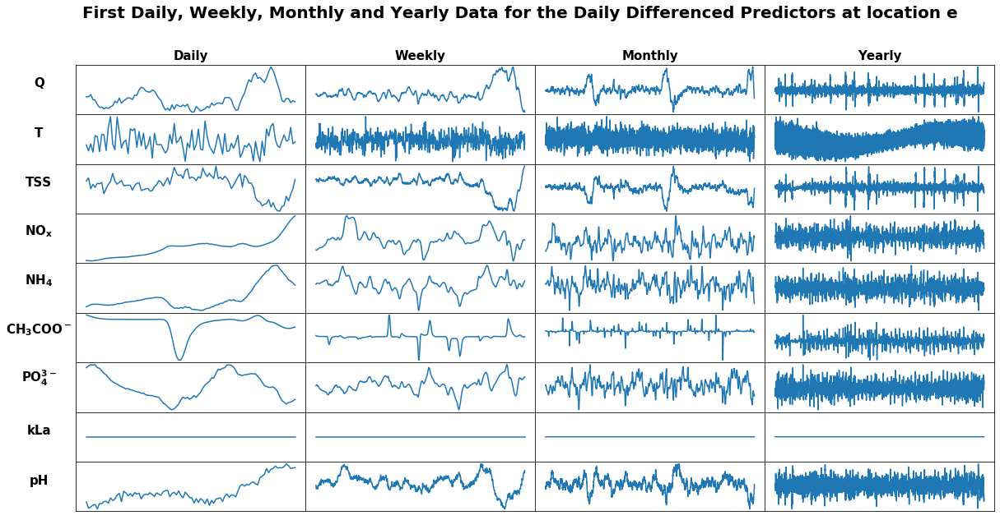

In [332]:
dwmy(X_e_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location e', 10)

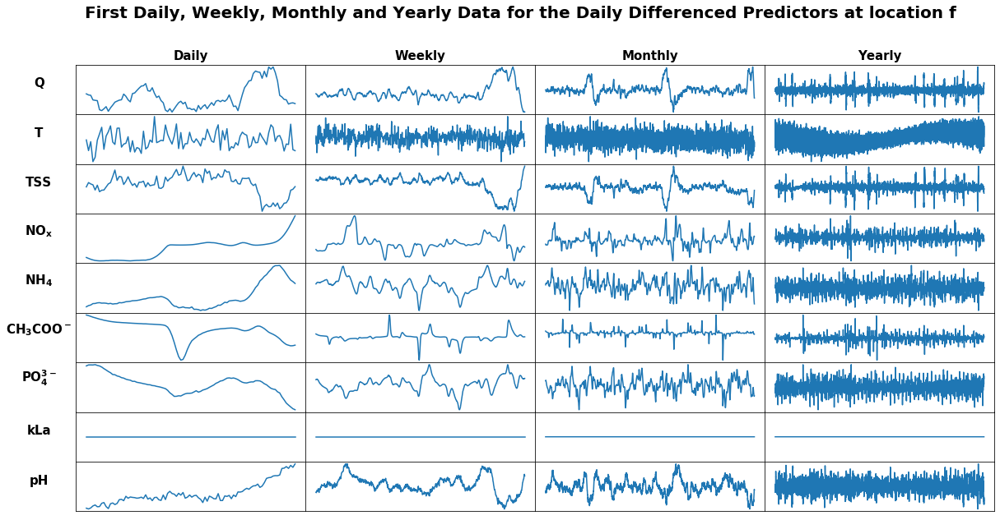

In [333]:
dwmy(X_f_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location f', 10)

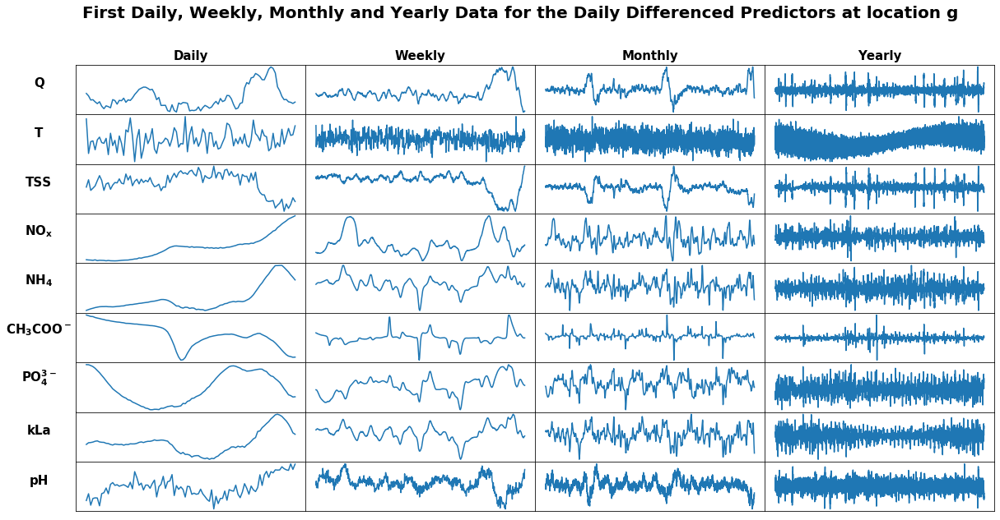

In [334]:
dwmy(X_g_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location g', 10)

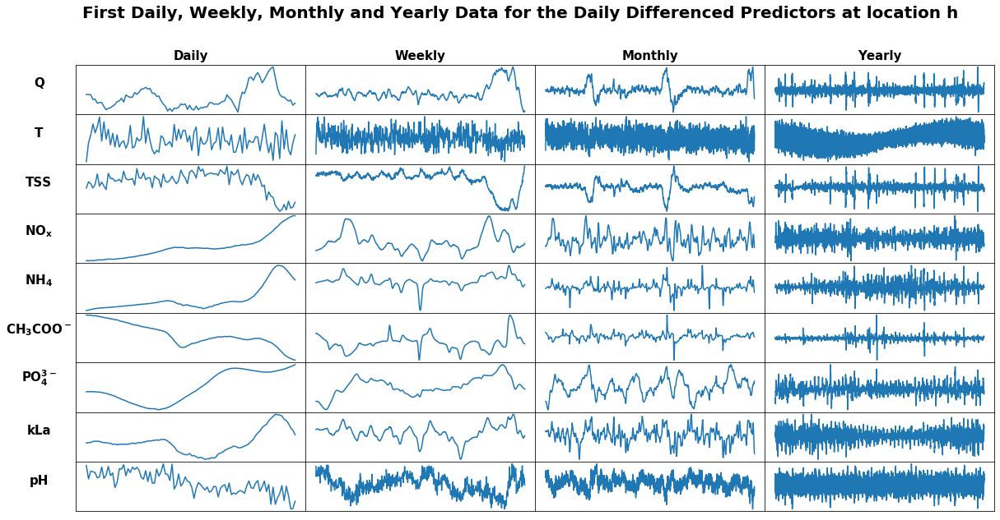

In [335]:
dwmy(X_h_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location h', 10)

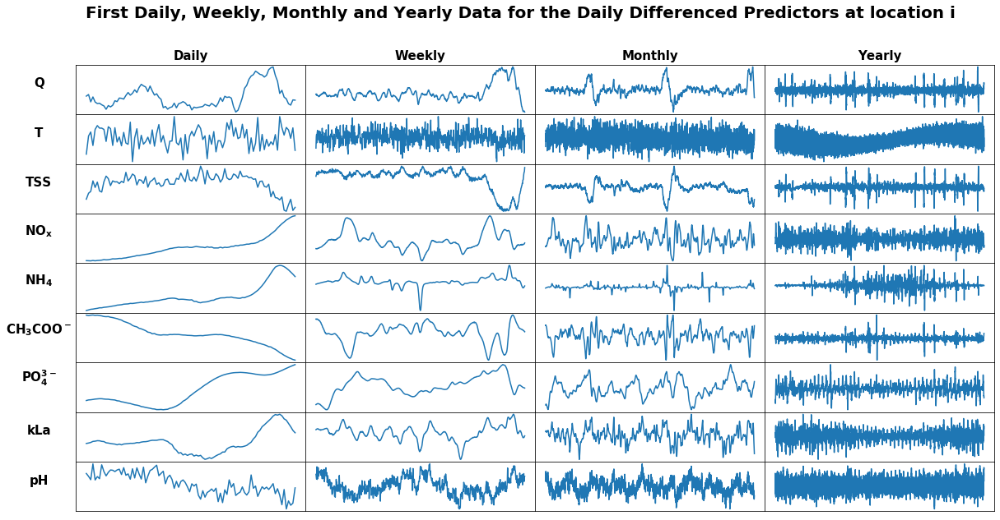

In [336]:
dwmy(X_i_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Predictors at location i', 10)

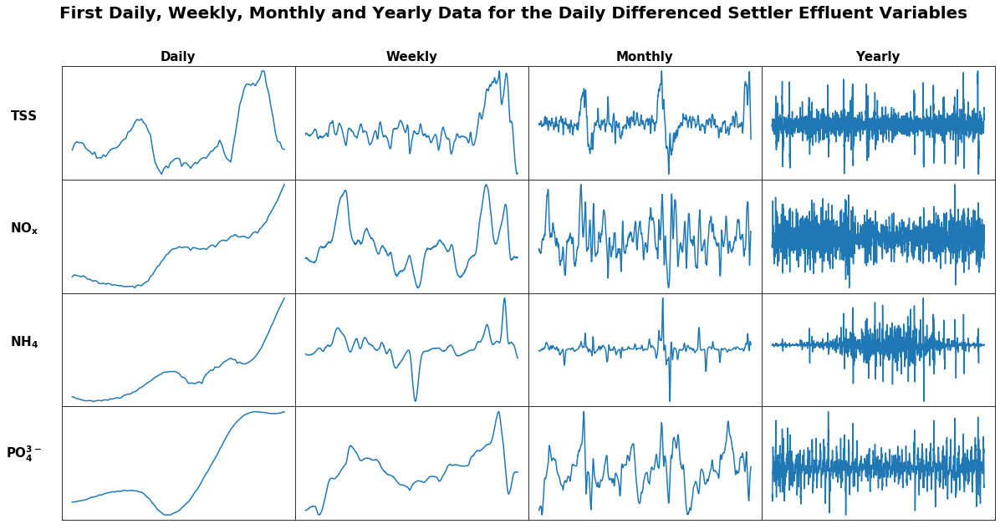

In [337]:
dwmy(y_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Settler Effluent Variables', 10)

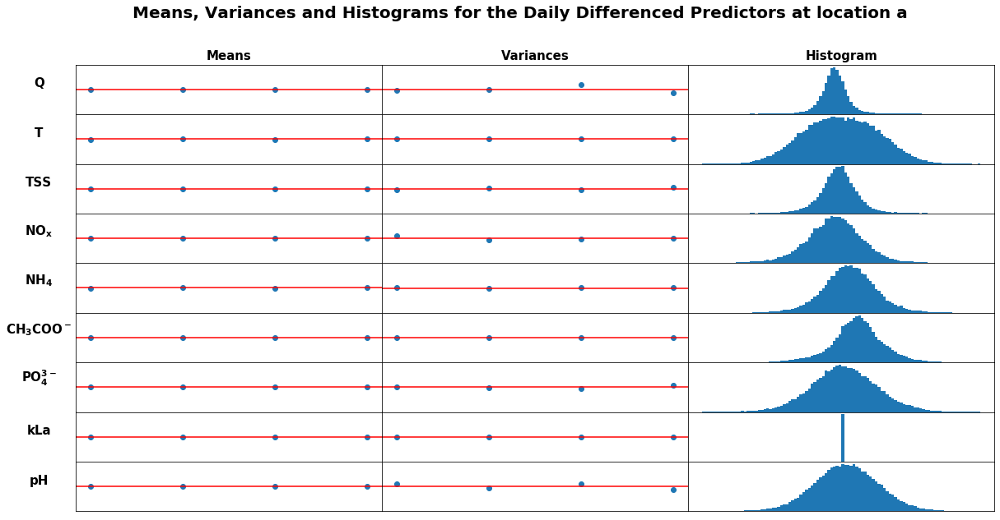

In [17]:
mvh(X_a_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location a', 10)

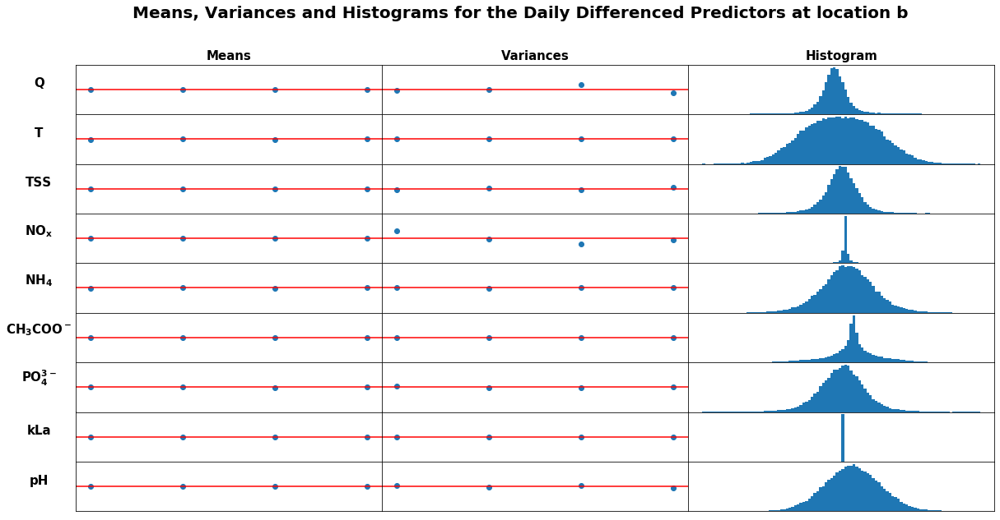

In [339]:
mvh(X_b_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location b', 10)

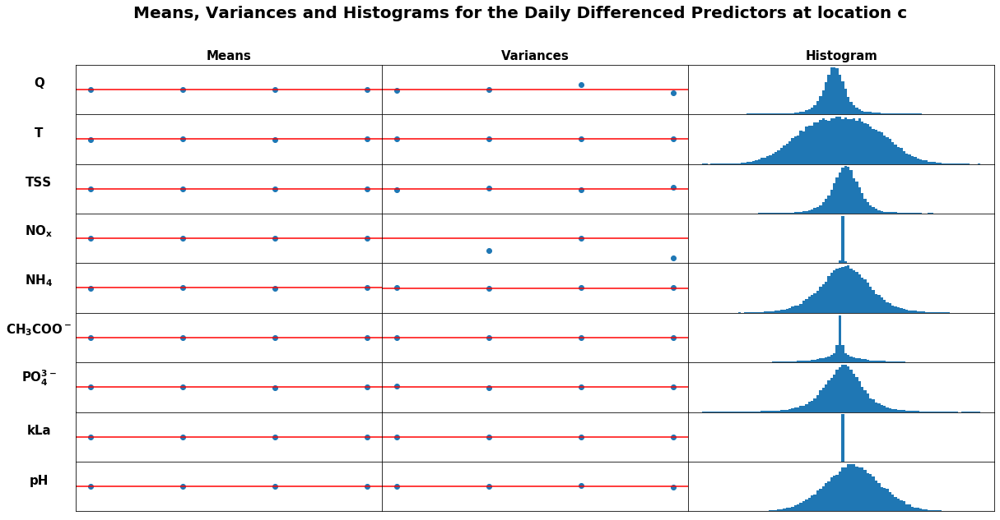

In [340]:
mvh(X_c_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location c', 10)

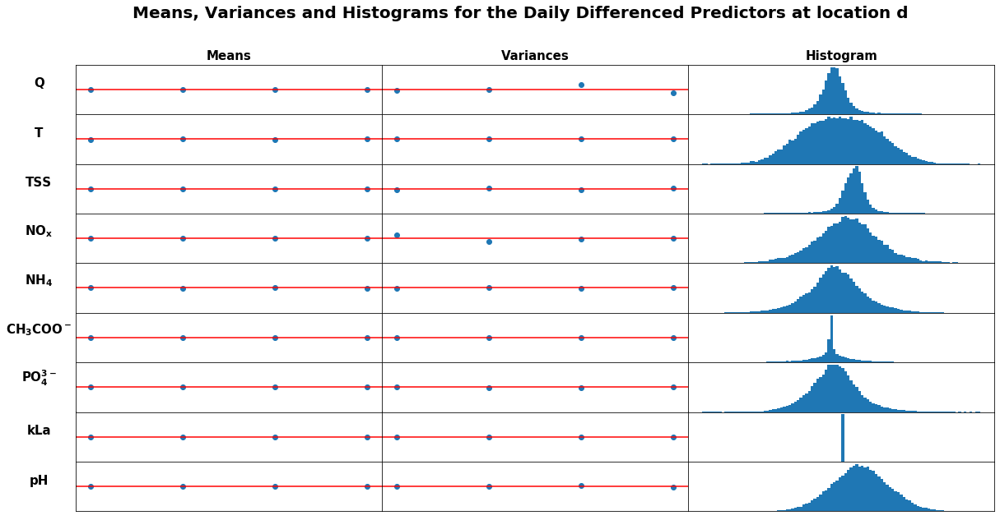

In [341]:
mvh(X_d_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location d', 10)

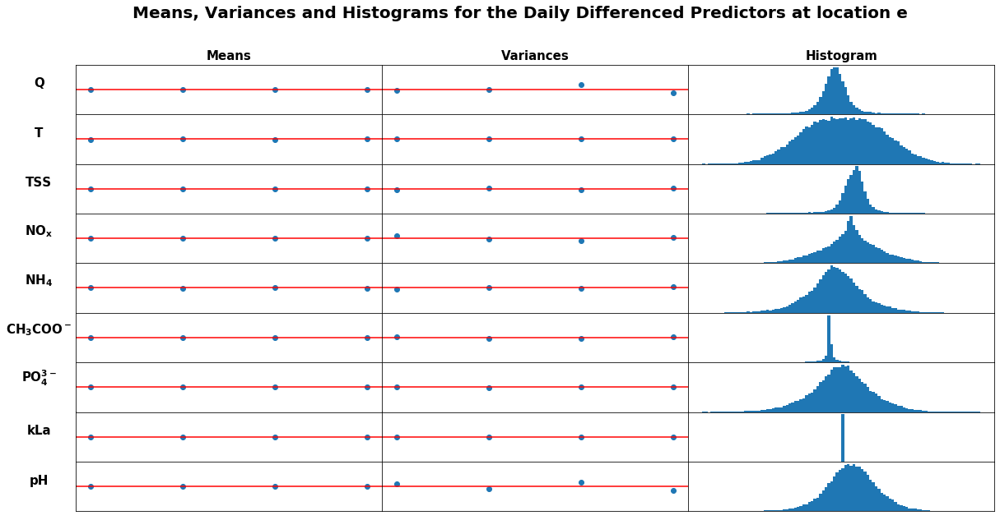

In [342]:
mvh(X_e_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location e', 10)

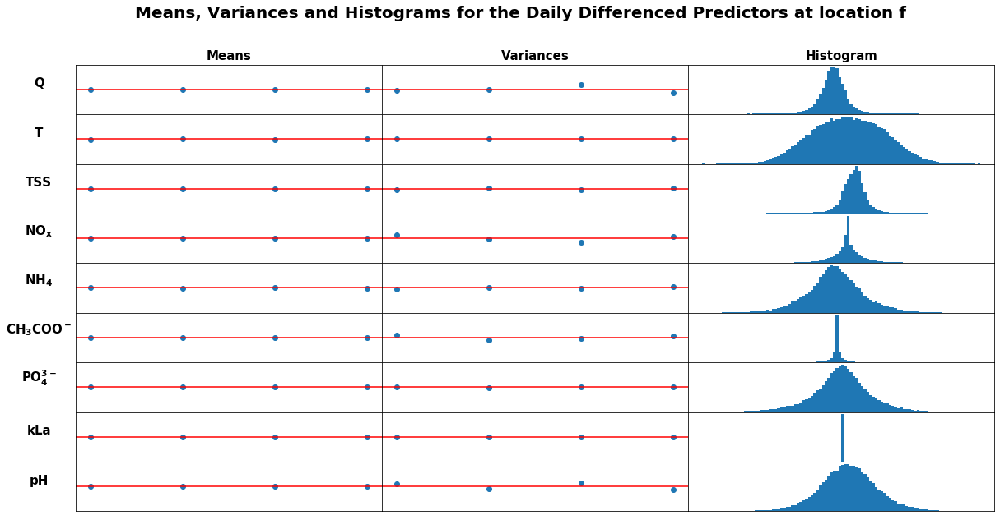

In [343]:
mvh(X_f_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location f', 10) 

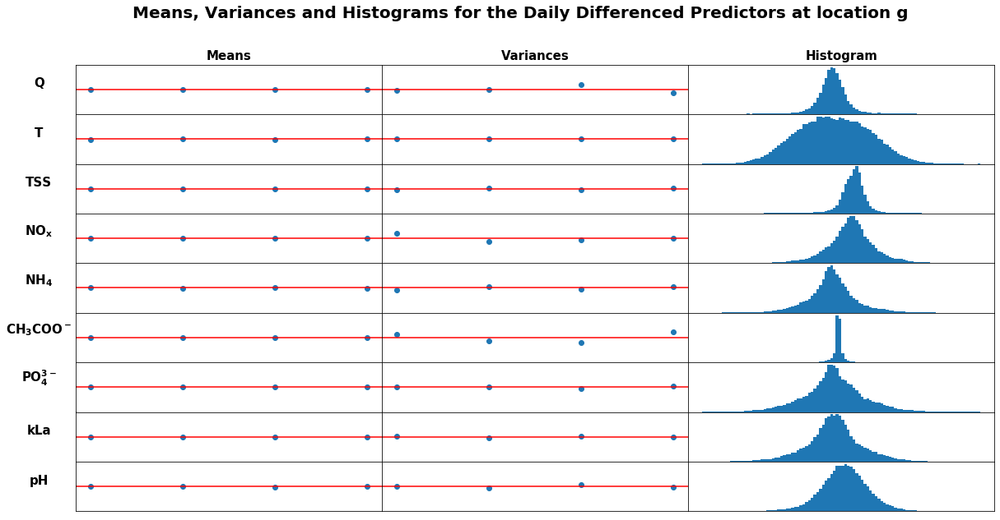

In [344]:
mvh(X_g_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location g', 10)

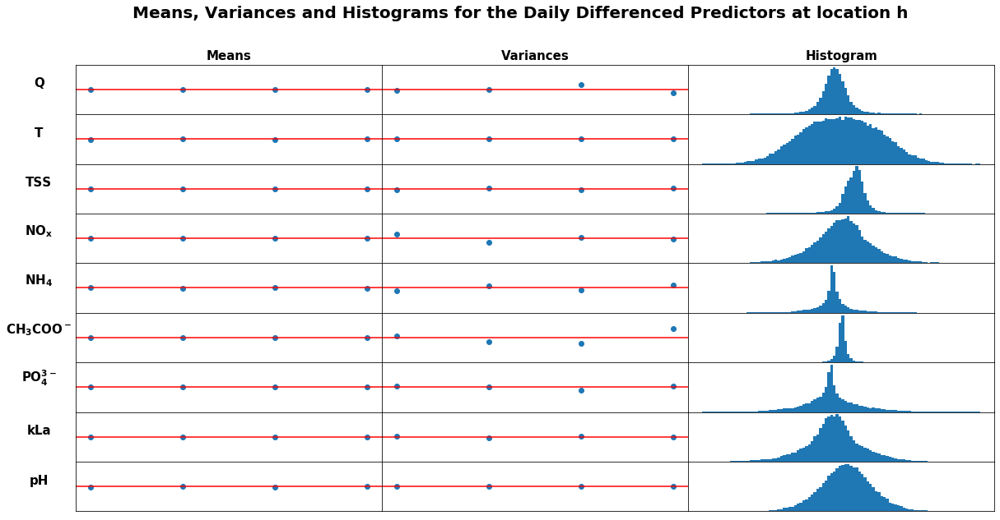

In [345]:
mvh(X_h_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location h', 10)

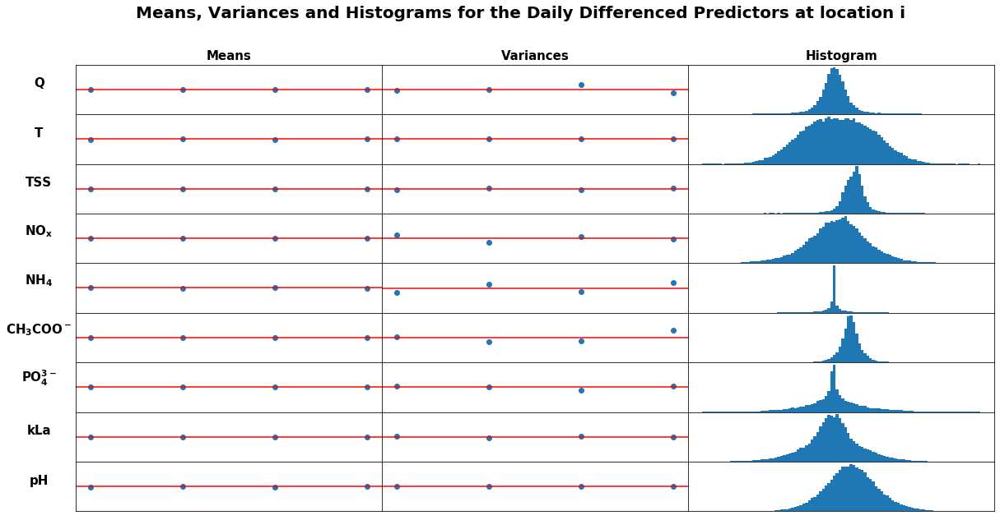

In [346]:
mvh(X_i_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Predictors at location i', 10)

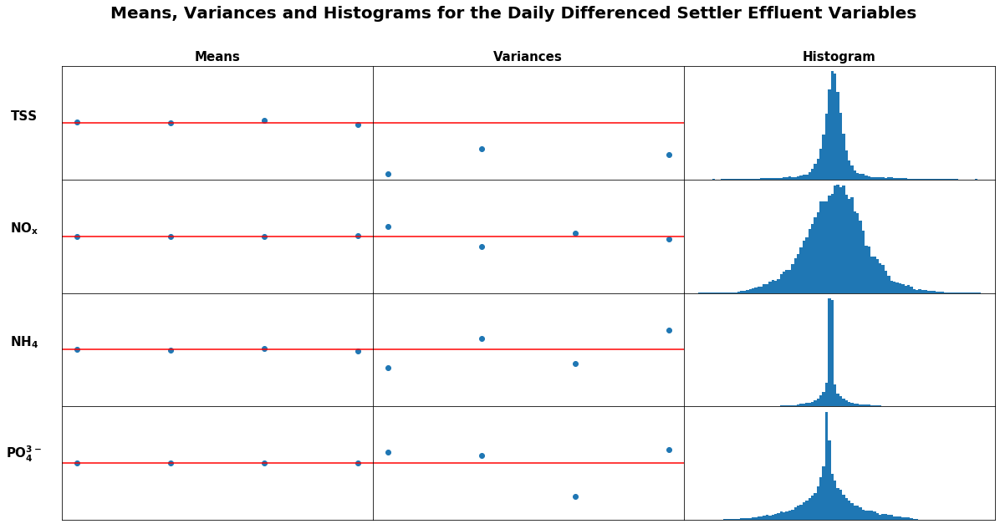

In [347]:
mvh(y_daily_diff, r'Means, Variances and Histograms for the Daily Differenced Settler Effluent Variables', 10)

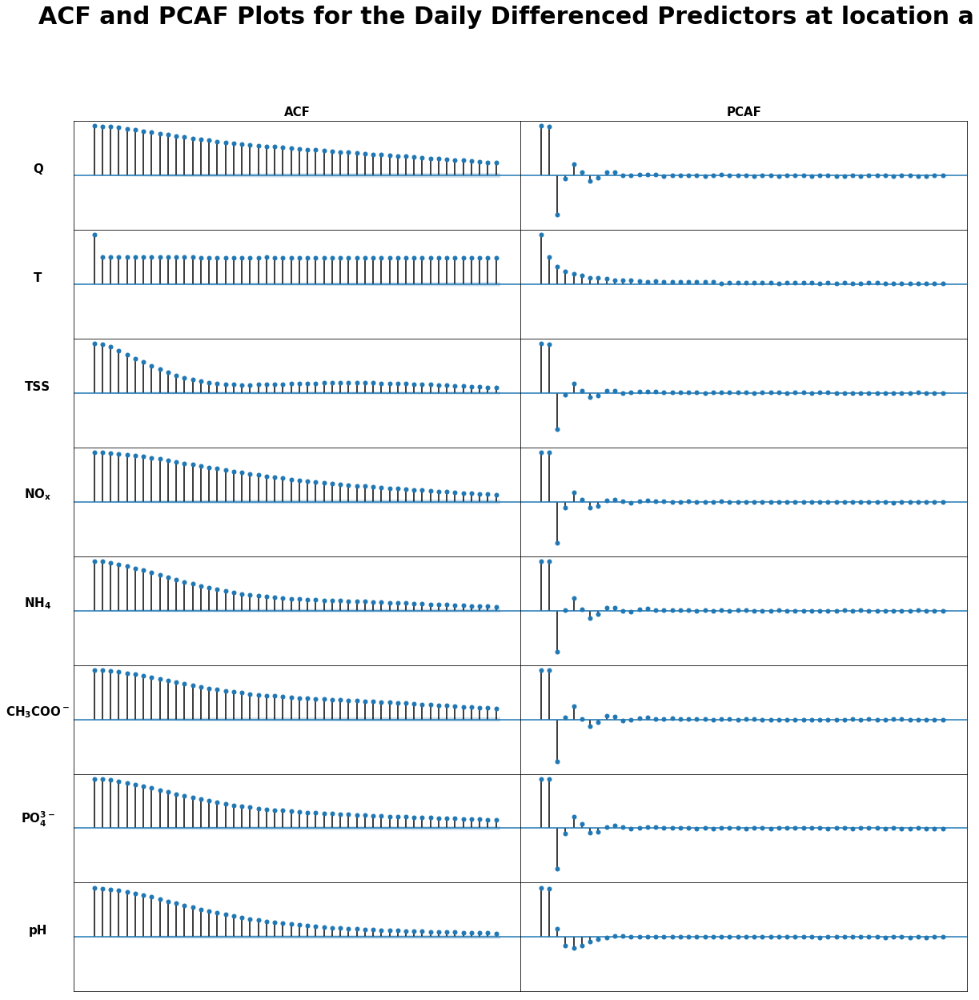

In [18]:
ACFPACF(X_a_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location a',20)

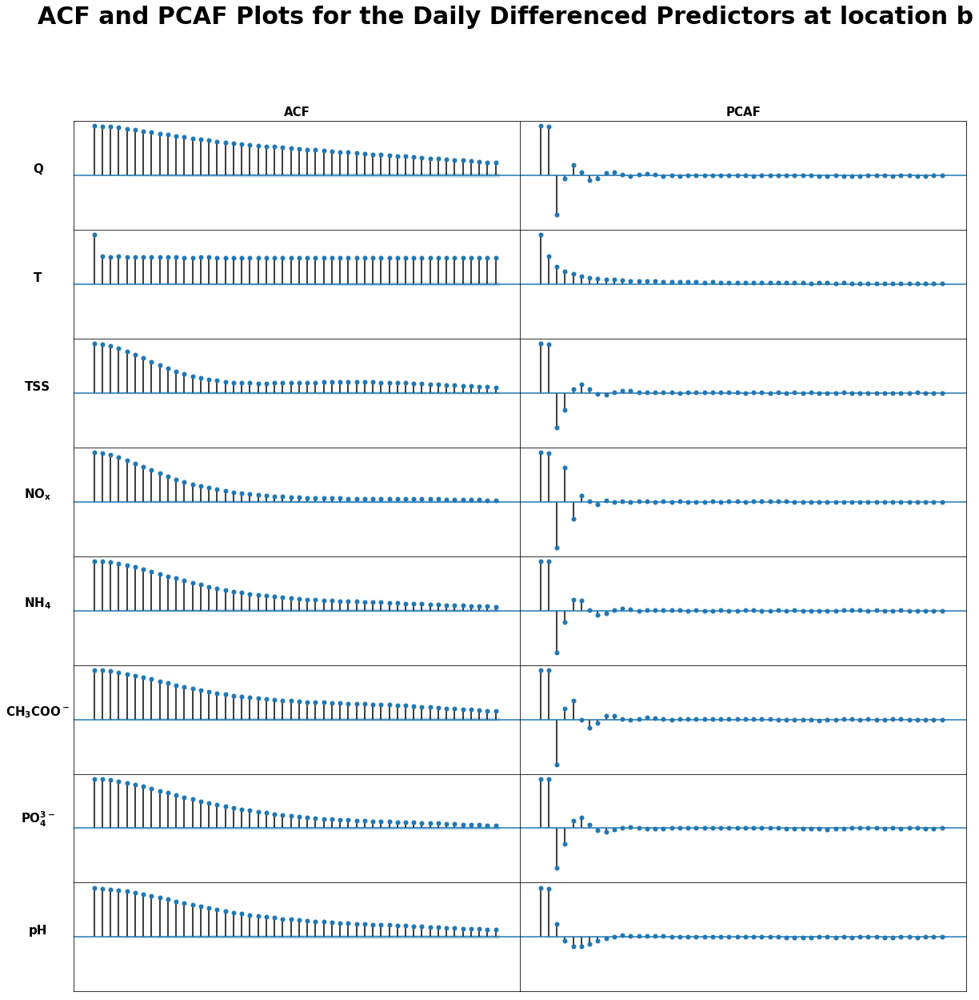

In [349]:
ACFPACF(X_b_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location b',20)

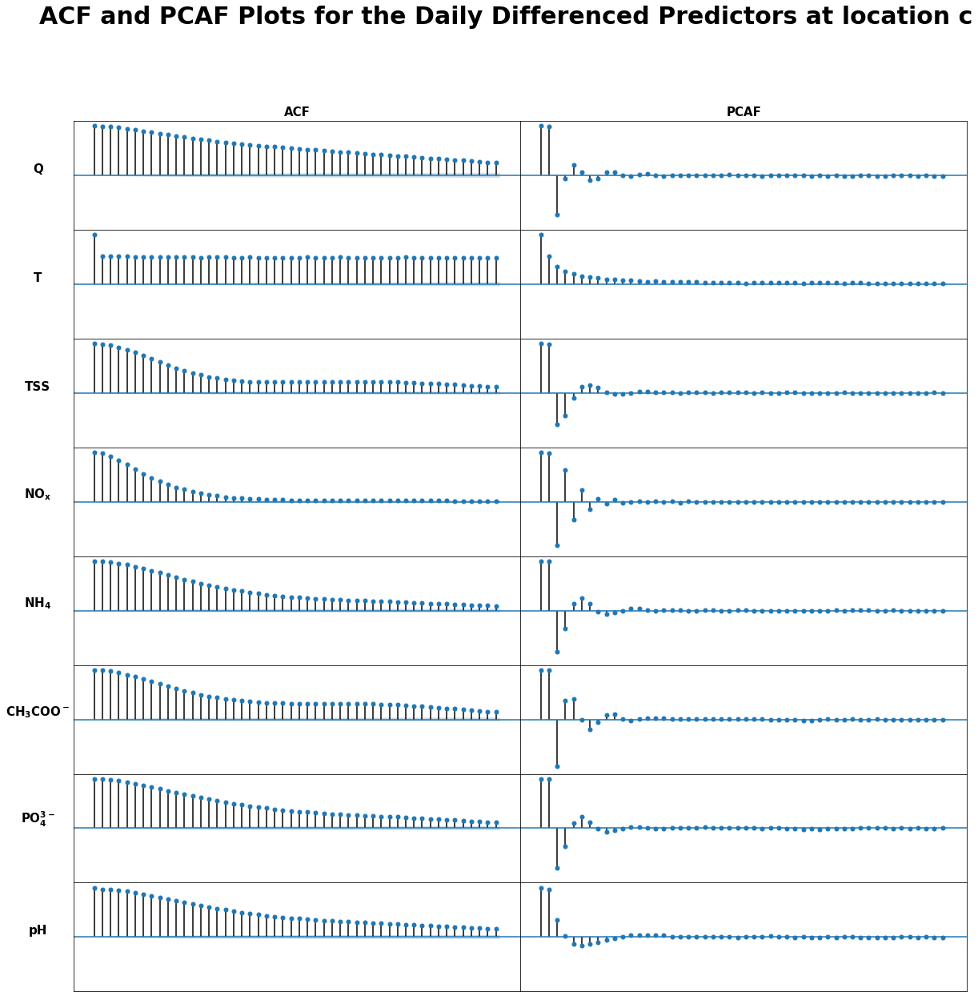

In [350]:
ACFPACF(X_c_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location c',20)

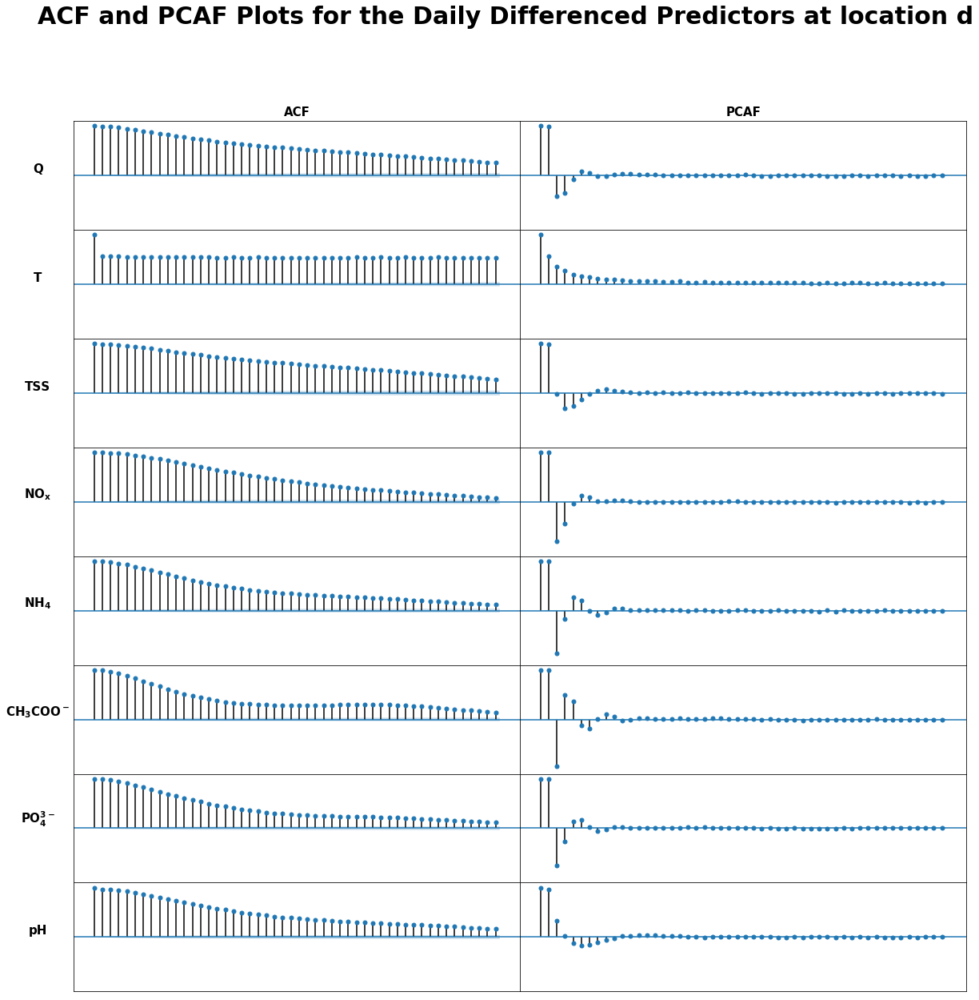

In [351]:
ACFPACF(X_d_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location d',20)

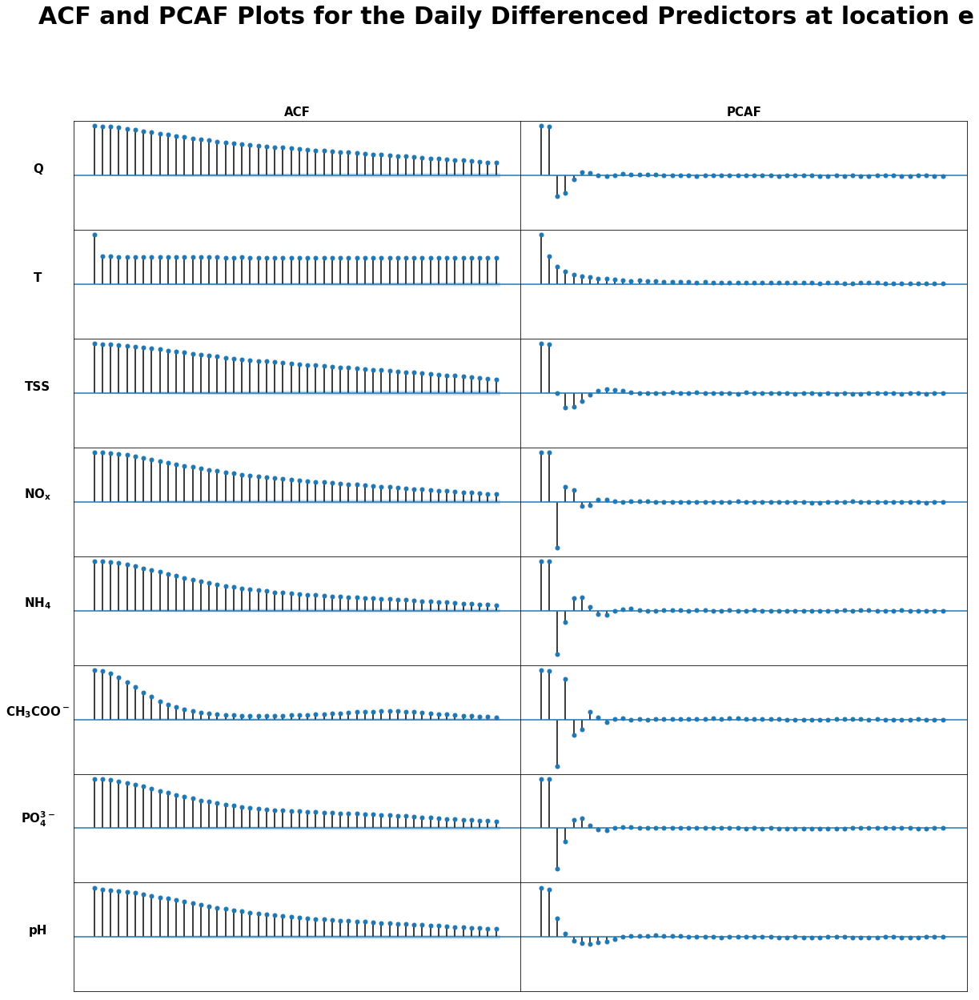

In [352]:
ACFPACF(X_e_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location e',20)

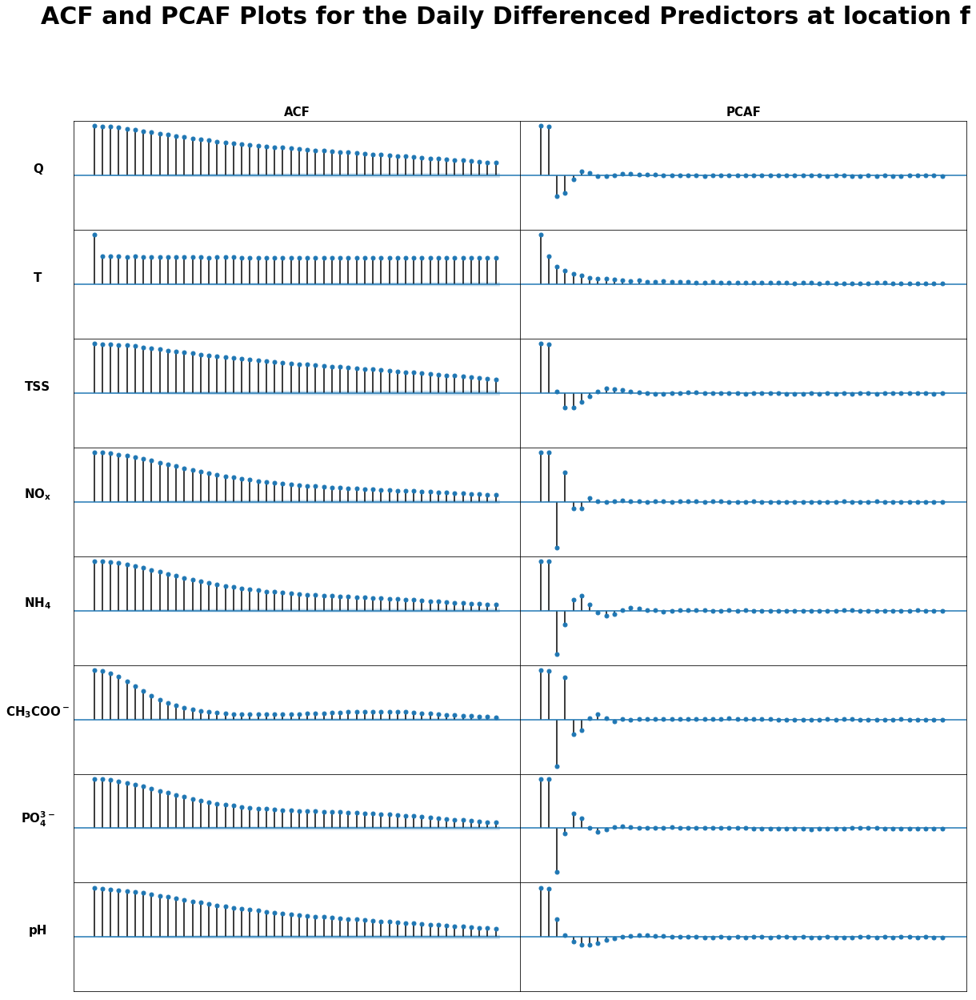

In [353]:
ACFPACF(X_f_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location f',20)

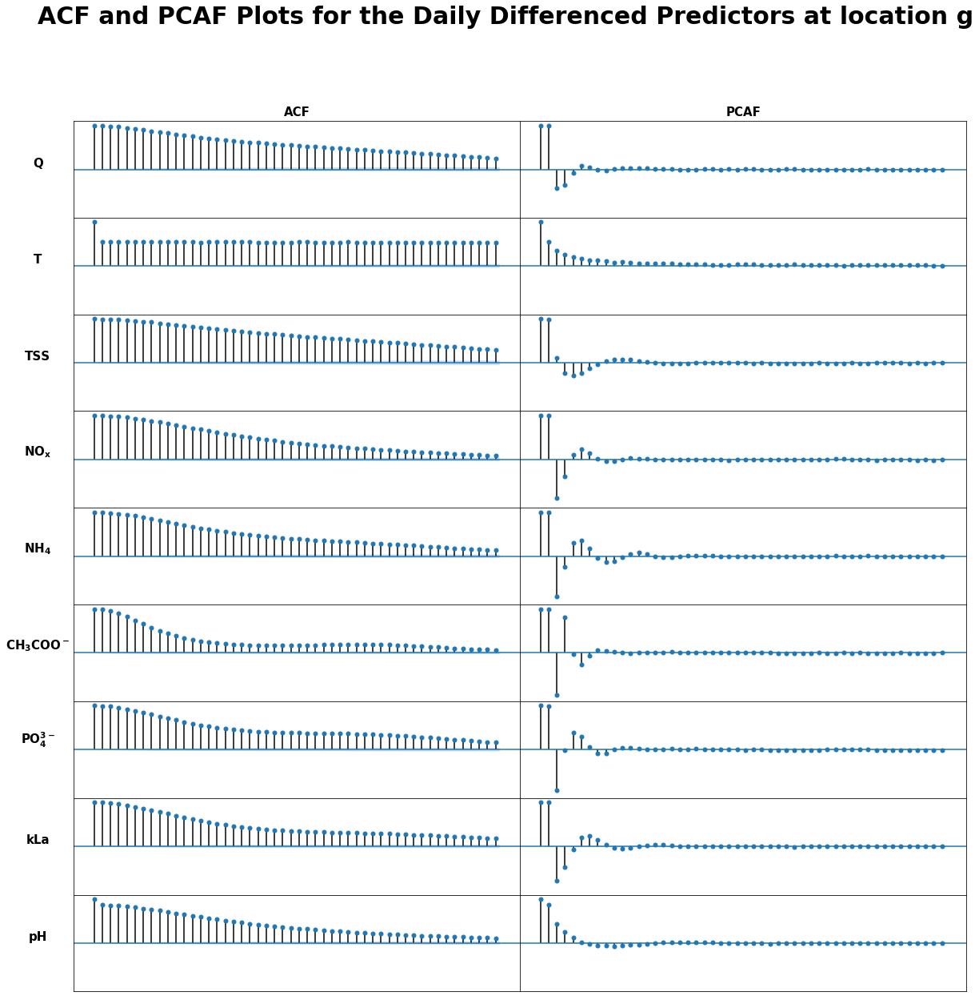

In [354]:
ACFPACF(X_g_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location g',20)

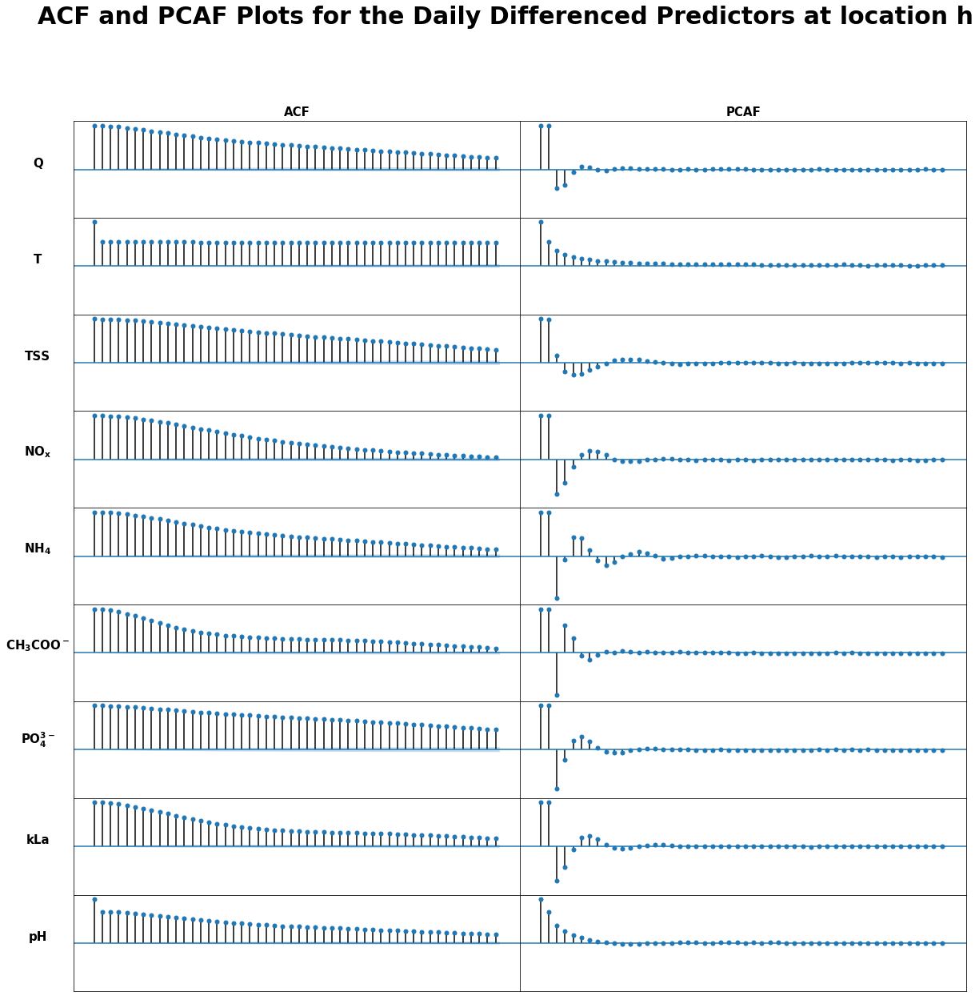

In [355]:
ACFPACF(X_h_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location h',20)

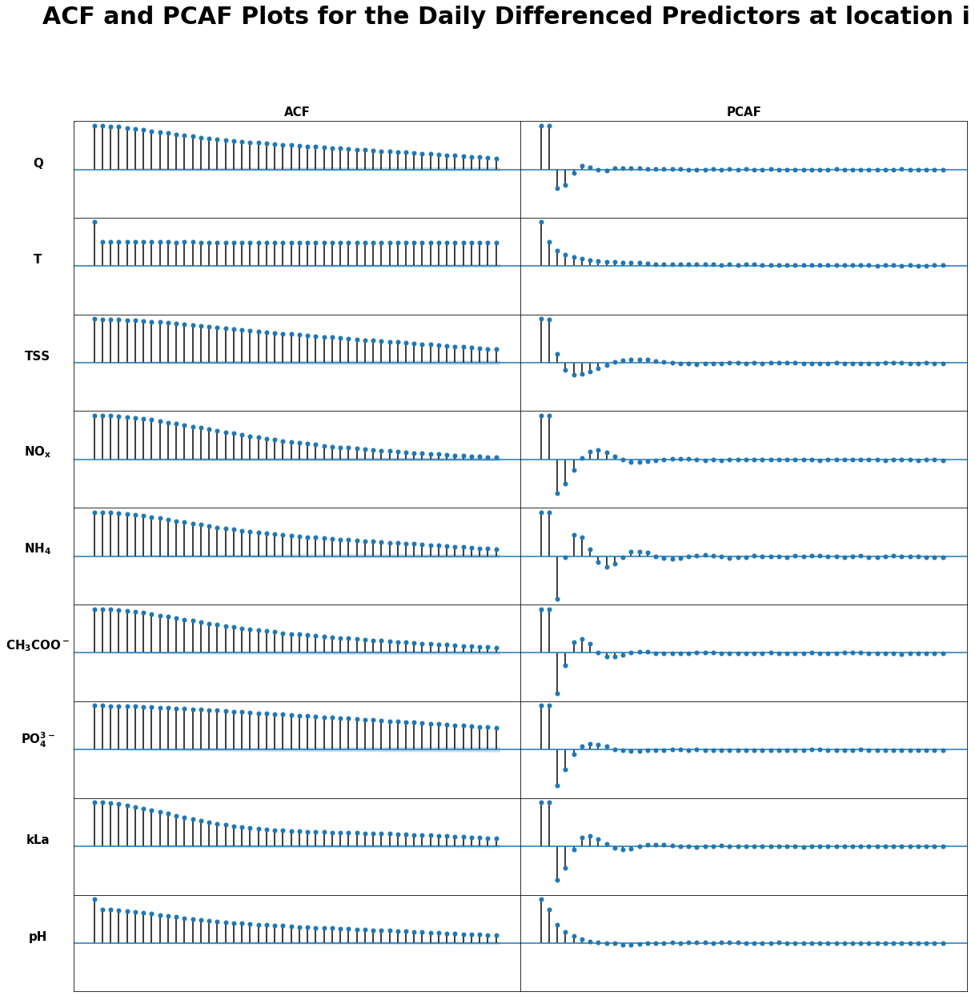

In [356]:
ACFPACF(X_i_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Predictors at location i',20)

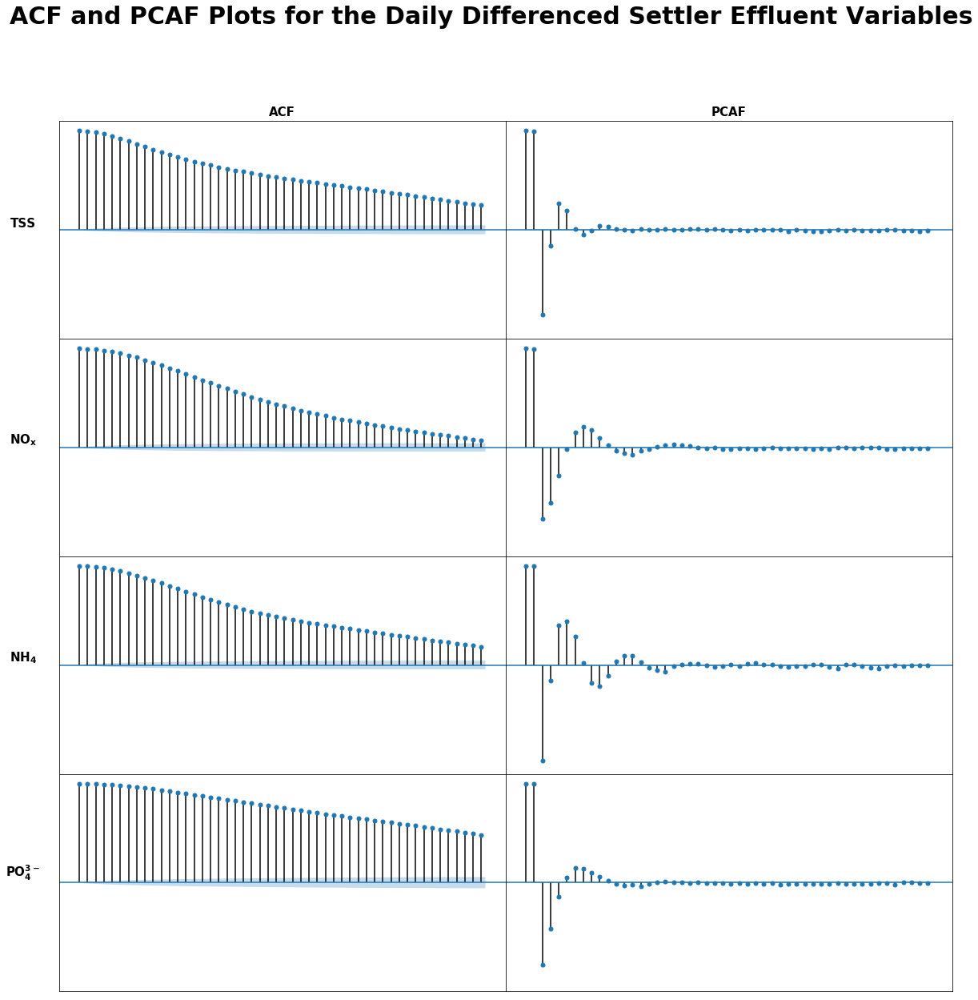

In [357]:
ACFPACF(y_daily_diff, 'ACF and PCAF Plots for the Daily Differenced Settler Effluent Variables',20)

In [42]:
X_a_diff = X_a_daily_diff.diff().dropna()
X_b_diff = X_b_daily_diff.diff().dropna()
X_c_diff = X_c_daily_diff.diff().dropna()
X_d_diff = X_d_daily_diff.diff().dropna()
X_e_diff = X_e_daily_diff.diff().dropna()
X_f_diff = X_f_daily_diff.diff().dropna()
X_g_diff = X_g_daily_diff.diff().dropna()
X_h_diff = X_h_daily_diff.diff().dropna()
X_i_diff = X_i_daily_diff.diff().dropna()
y_diff = y_daily_diff.diff().dropna()

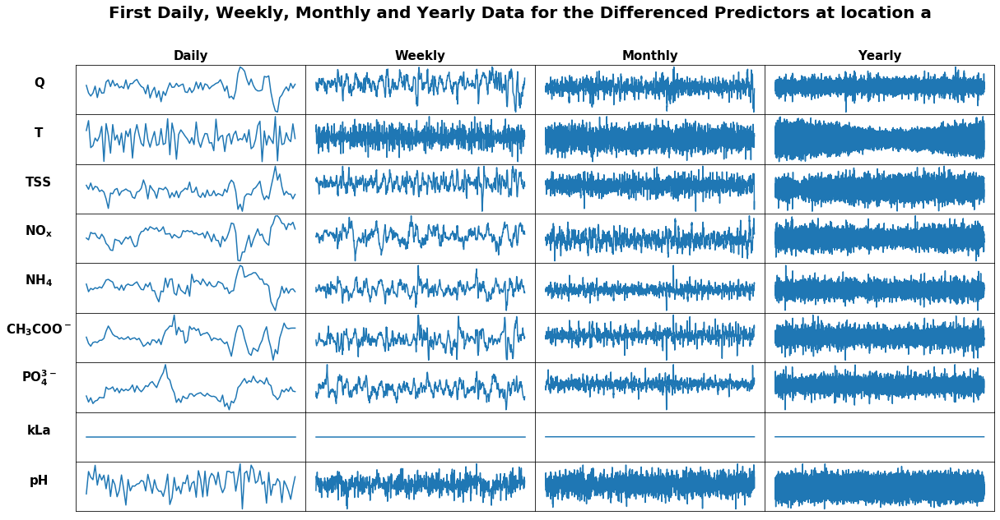

In [20]:
dwmy(X_a_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location a', 10)

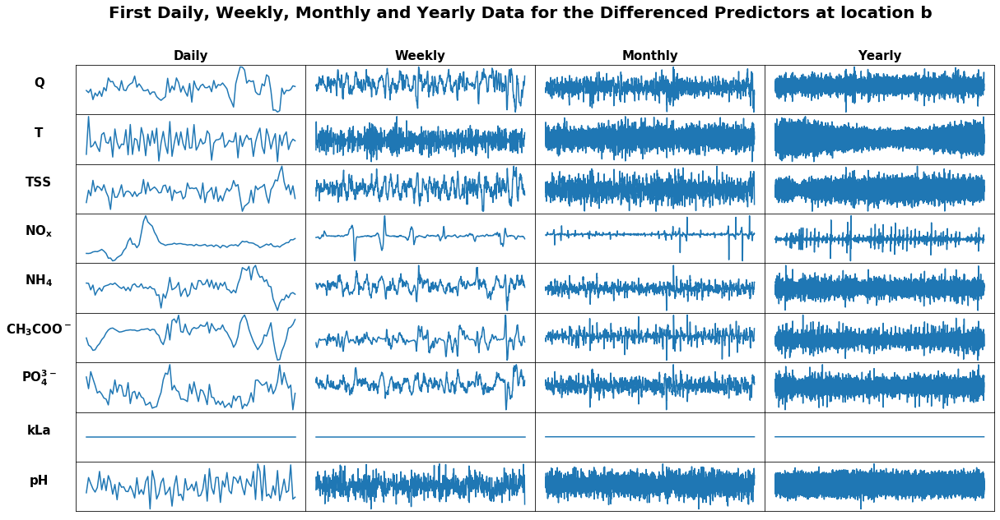

In [360]:
dwmy(X_b_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location b', 10)

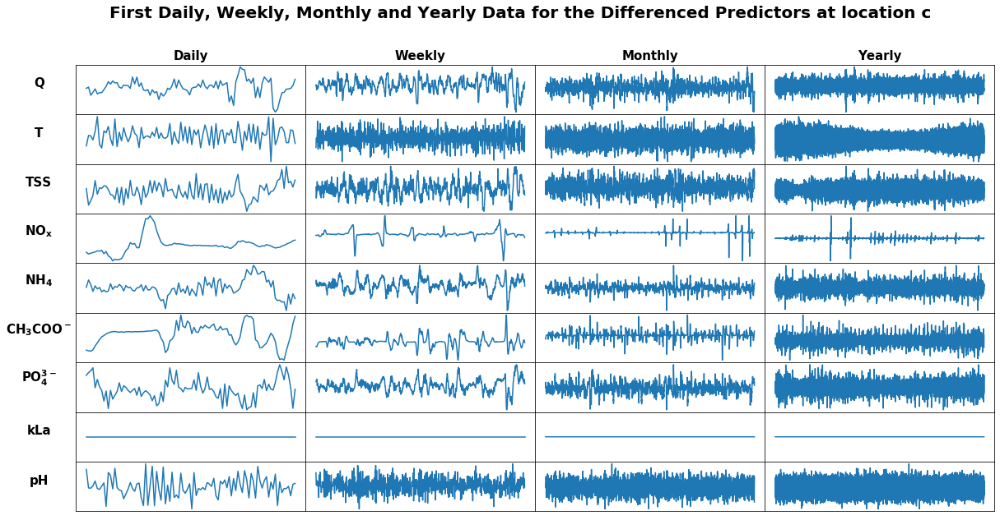

In [361]:
dwmy(X_c_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location c', 10)

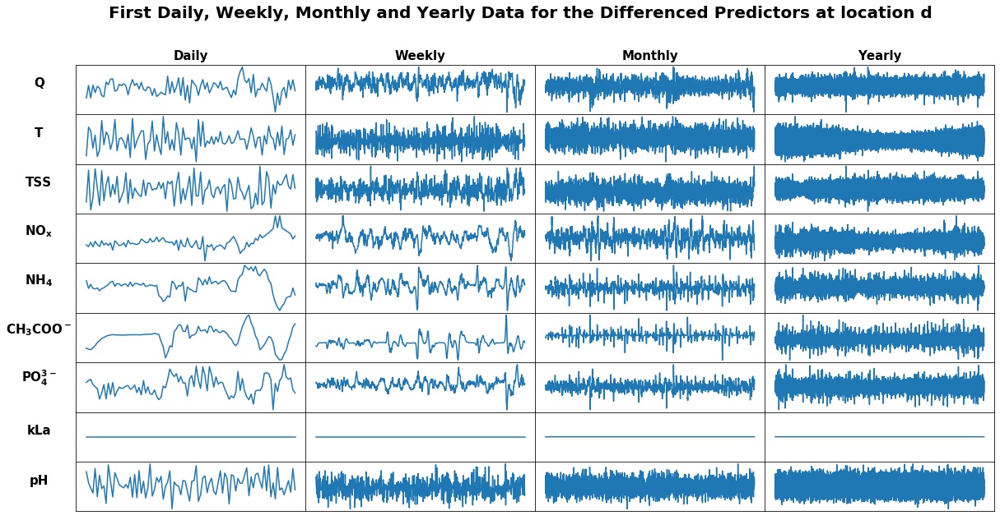

In [362]:
dwmy(X_d_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location d', 10)

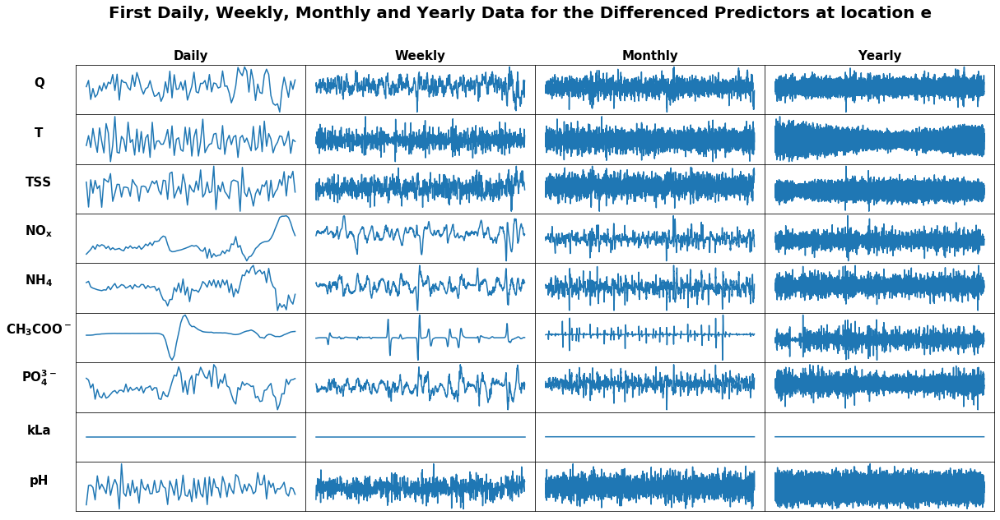

In [363]:
dwmy(X_e_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location e', 10)

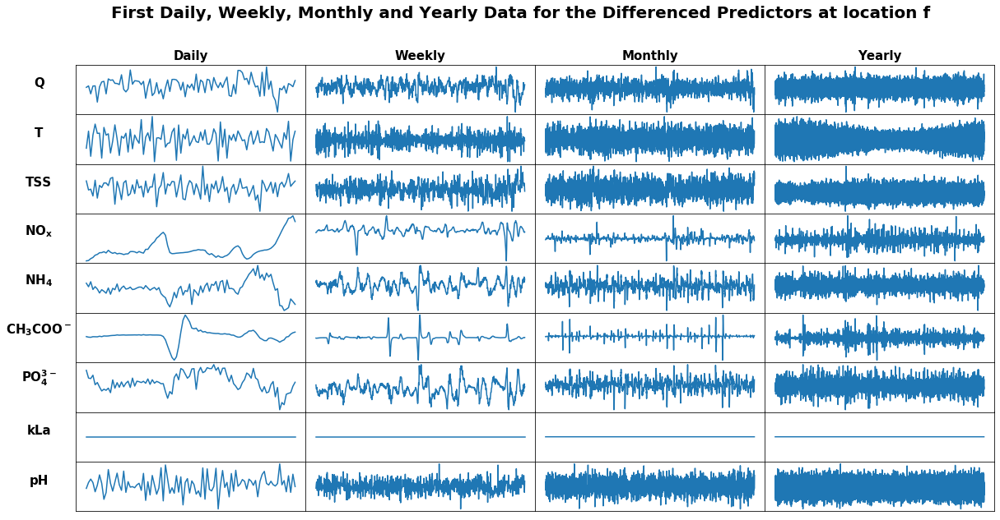

In [364]:
dwmy(X_f_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location f', 10)

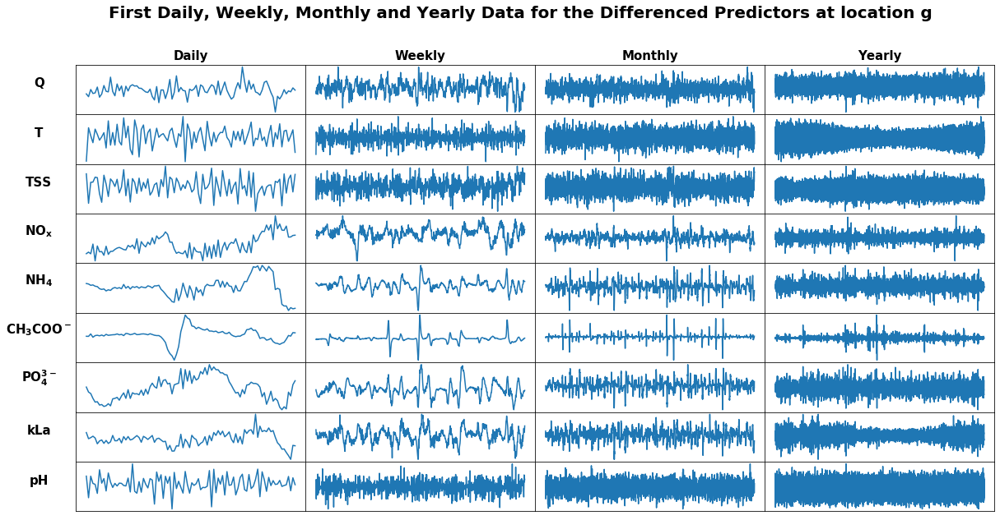

In [365]:
dwmy(X_g_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location g', 10)

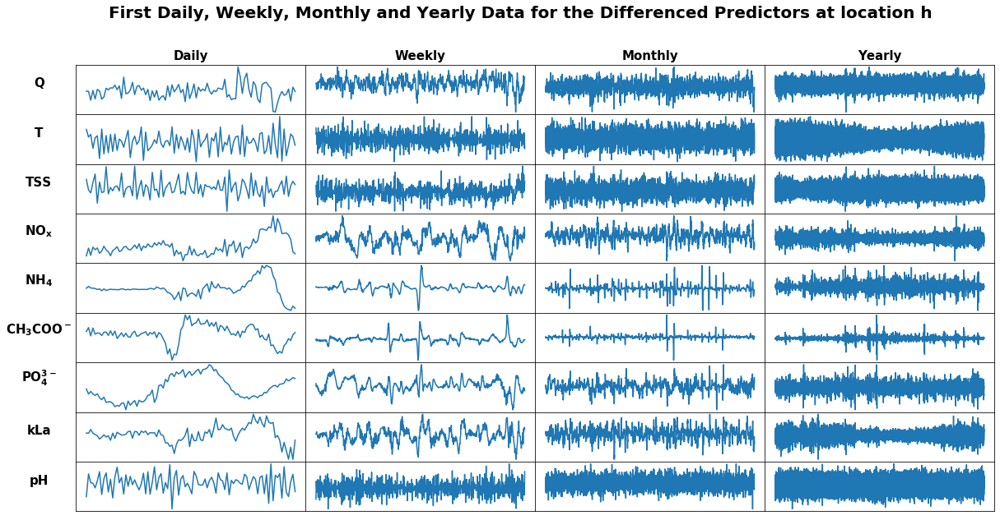

In [366]:
dwmy(X_h_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location h', 10)

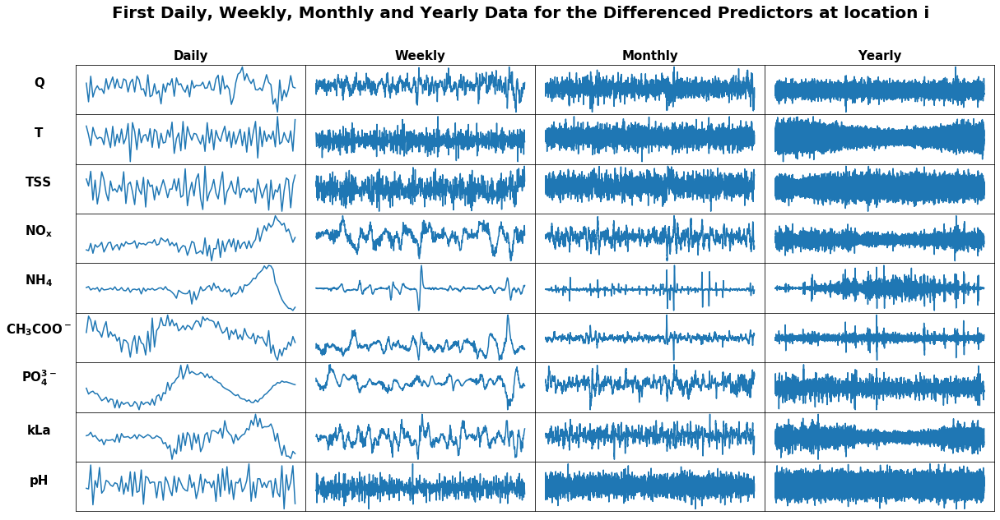

In [367]:
dwmy(X_i_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Predictors at location i', 10)

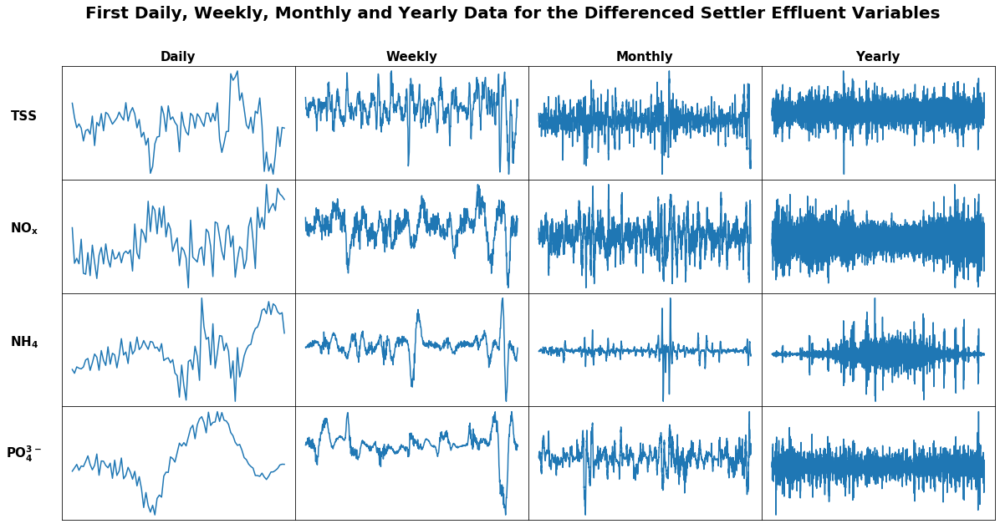

In [368]:
dwmy(y_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Settler Effluent Variables', 10)

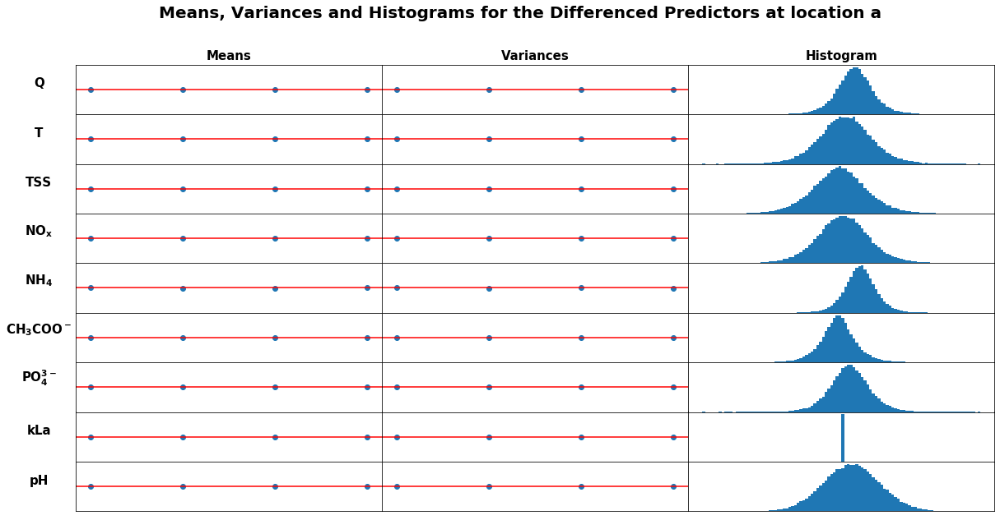

In [21]:
mvh(X_a_diff, r'Means, Variances and Histograms for the Differenced Predictors at location a', 10)

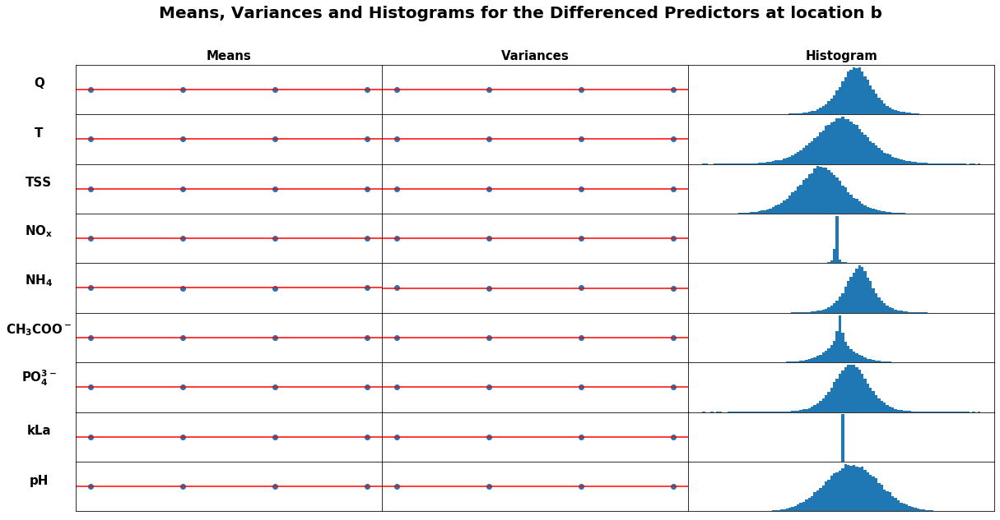

In [370]:
mvh(X_b_diff, r'Means, Variances and Histograms for the Differenced Predictors at location b', 10)

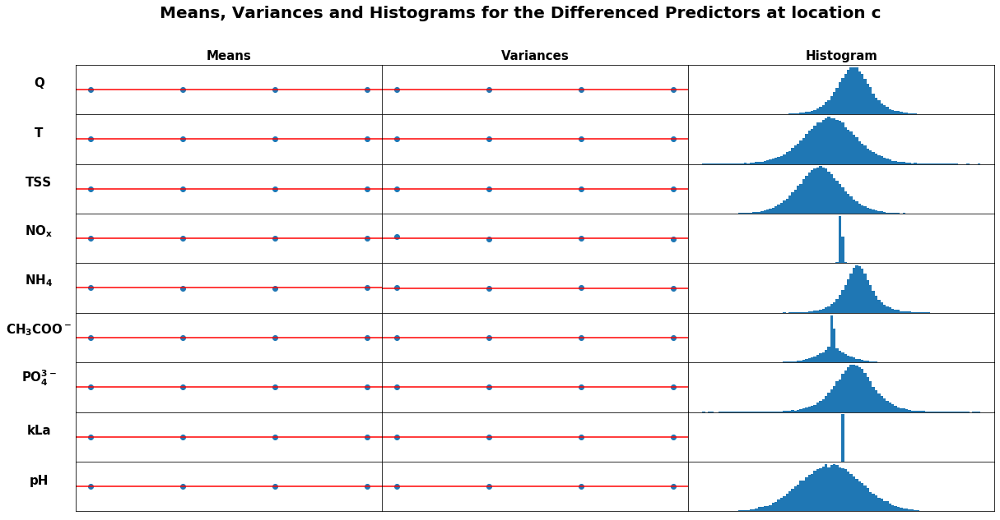

In [371]:
mvh(X_c_diff, r'Means, Variances and Histograms for the Differenced Predictors at location c', 10)

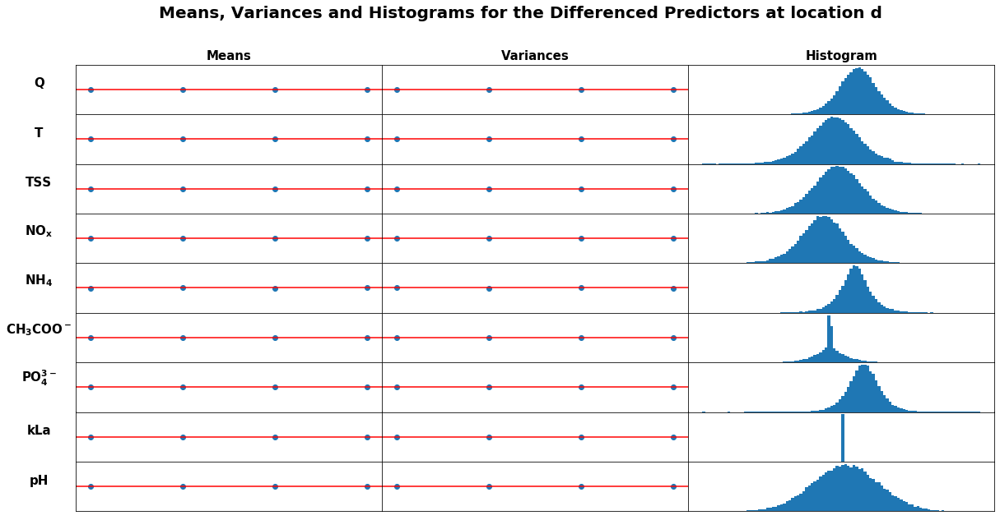

In [372]:
mvh(X_d_diff, r'Means, Variances and Histograms for the Differenced Predictors at location d', 10)

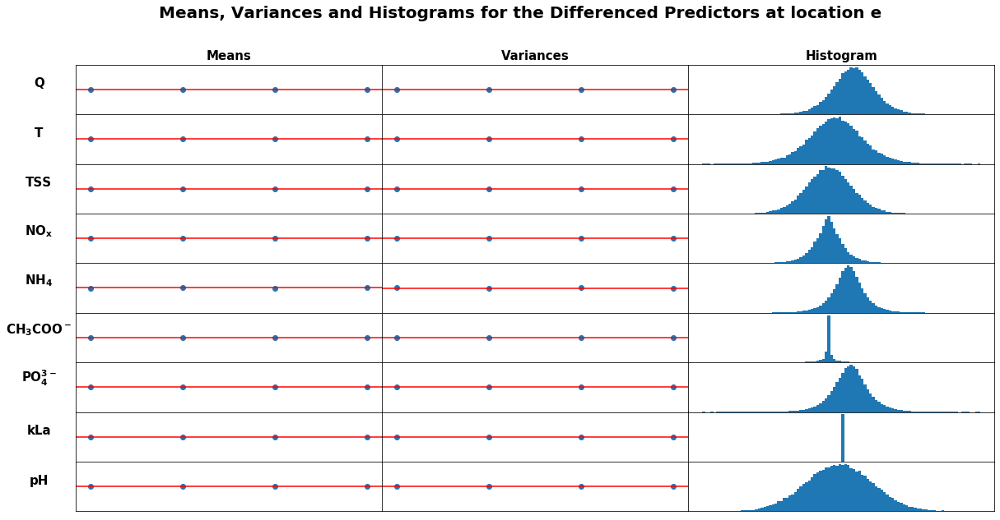

In [373]:
mvh(X_e_diff, r'Means, Variances and Histograms for the Differenced Predictors at location e', 10)

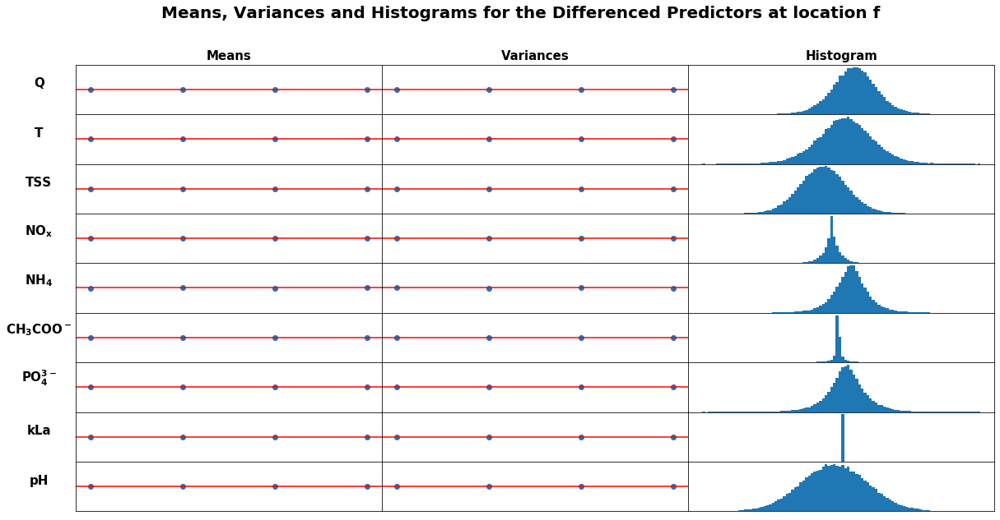

In [374]:
mvh(X_f_diff, r'Means, Variances and Histograms for the Differenced Predictors at location f', 10)

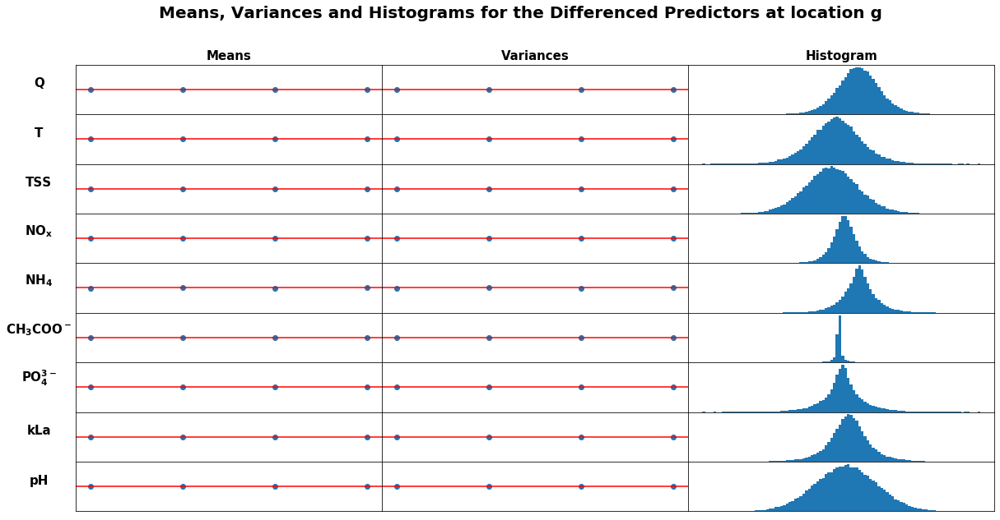

In [375]:
mvh(X_g_diff, r'Means, Variances and Histograms for the Differenced Predictors at location g', 10)

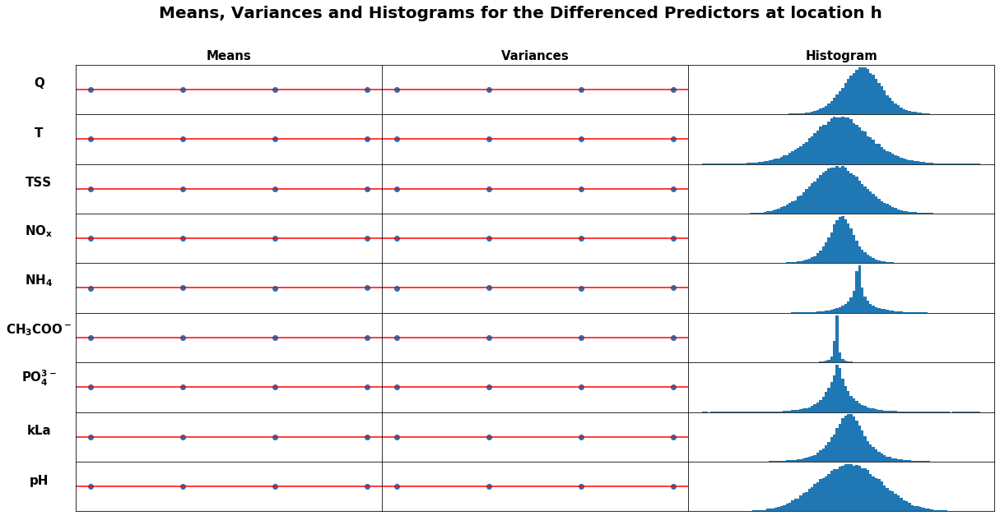

In [376]:
mvh(X_h_diff, r'Means, Variances and Histograms for the Differenced Predictors at location h', 10)

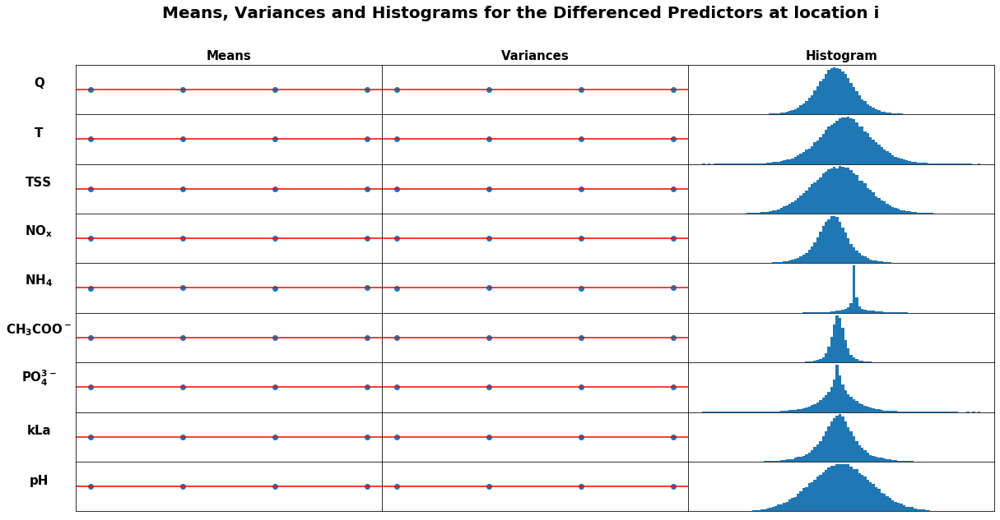

In [377]:
mvh(X_i_diff, r'Means, Variances and Histograms for the Differenced Predictors at location i', 10)

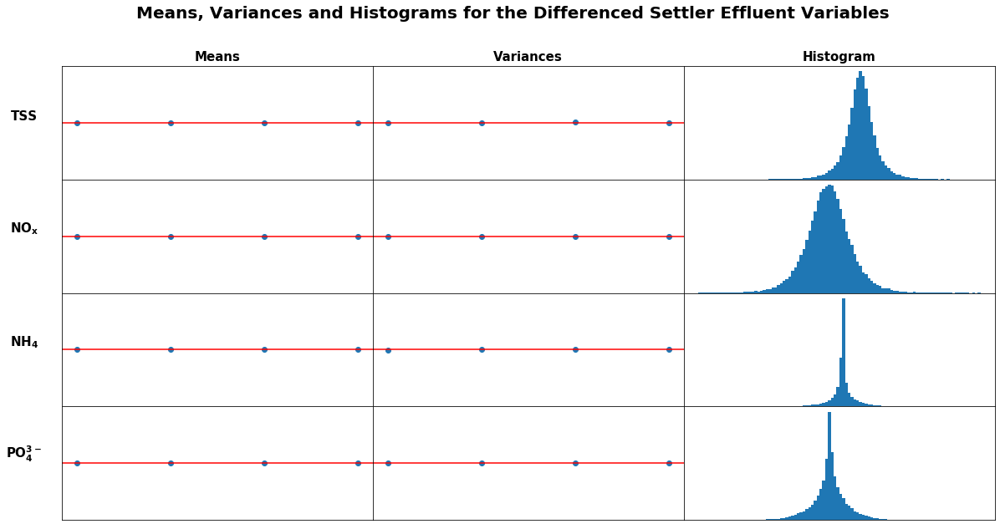

In [378]:
mvh(y_diff, r'Means, Variances and Histograms for the Differenced Settler Effluent Variables', 10)

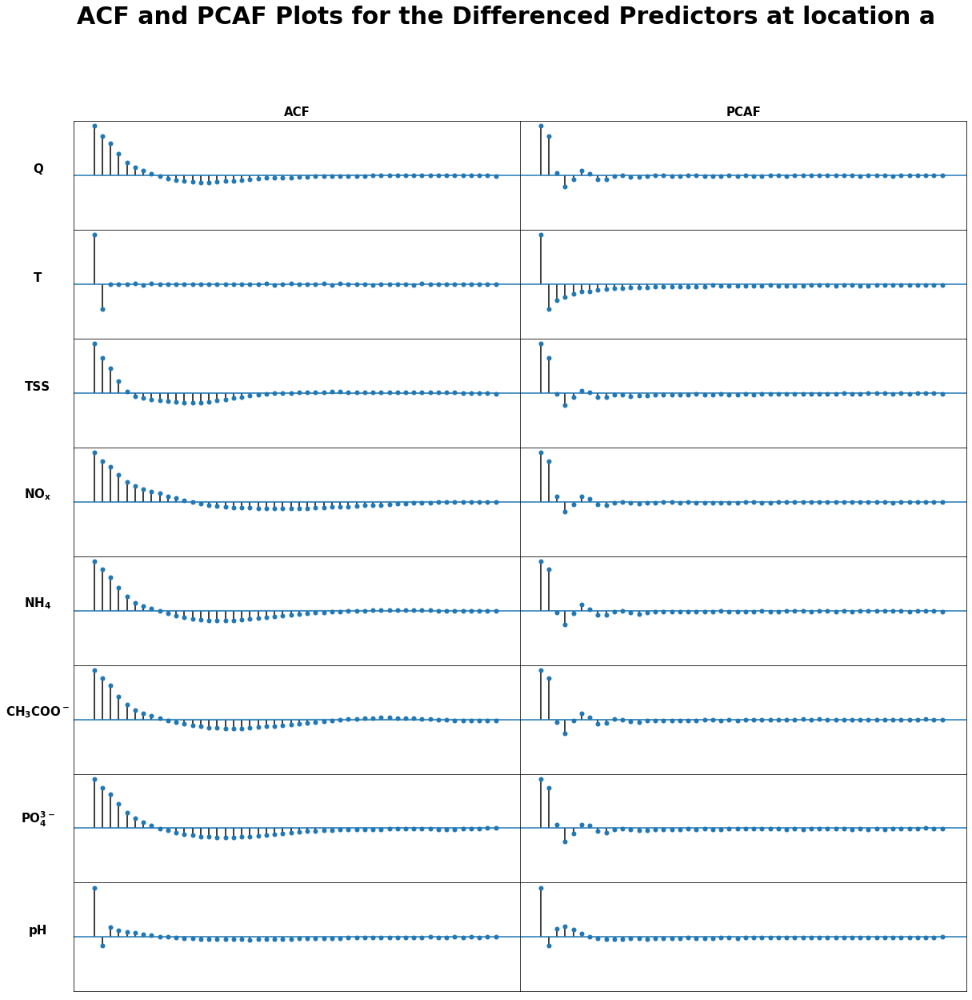

In [22]:
ACFPACF(X_a_diff, 'ACF and PCAF Plots for the Differenced Predictors at location a',20)

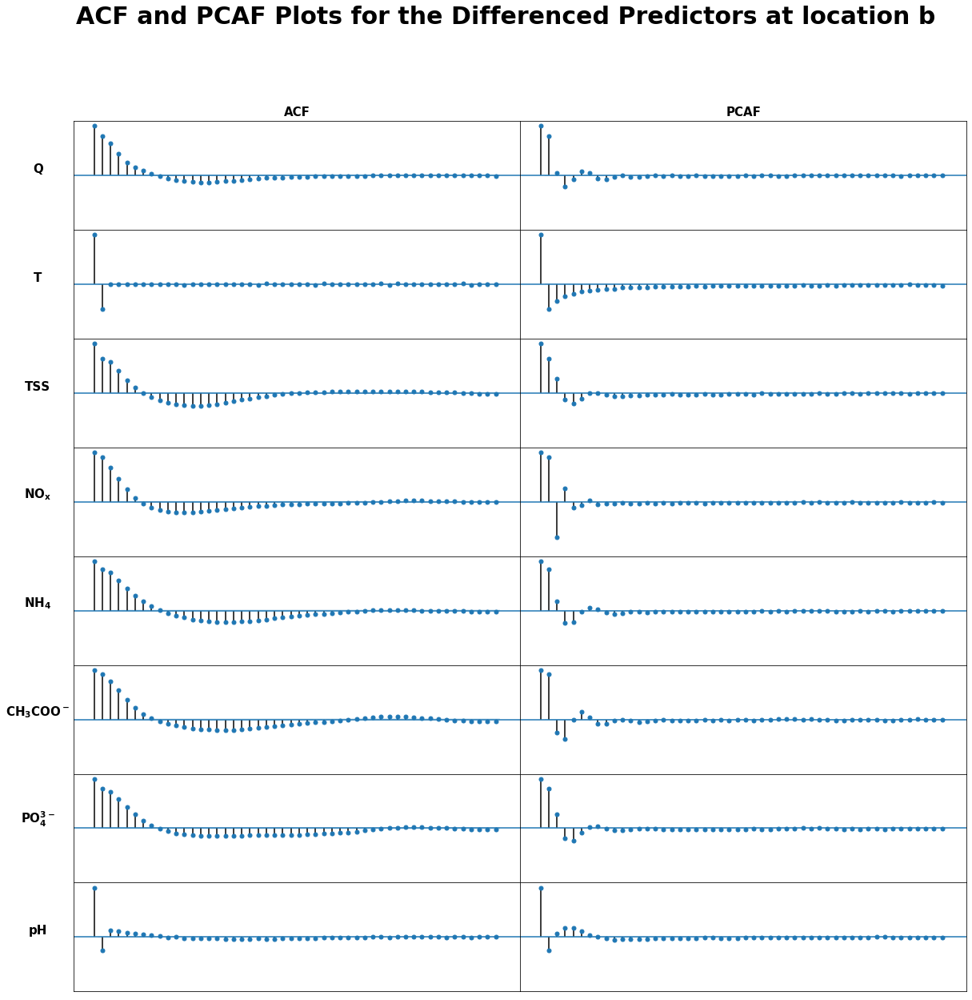

In [380]:
ACFPACF(X_b_diff, 'ACF and PCAF Plots for the Differenced Predictors at location b',20)

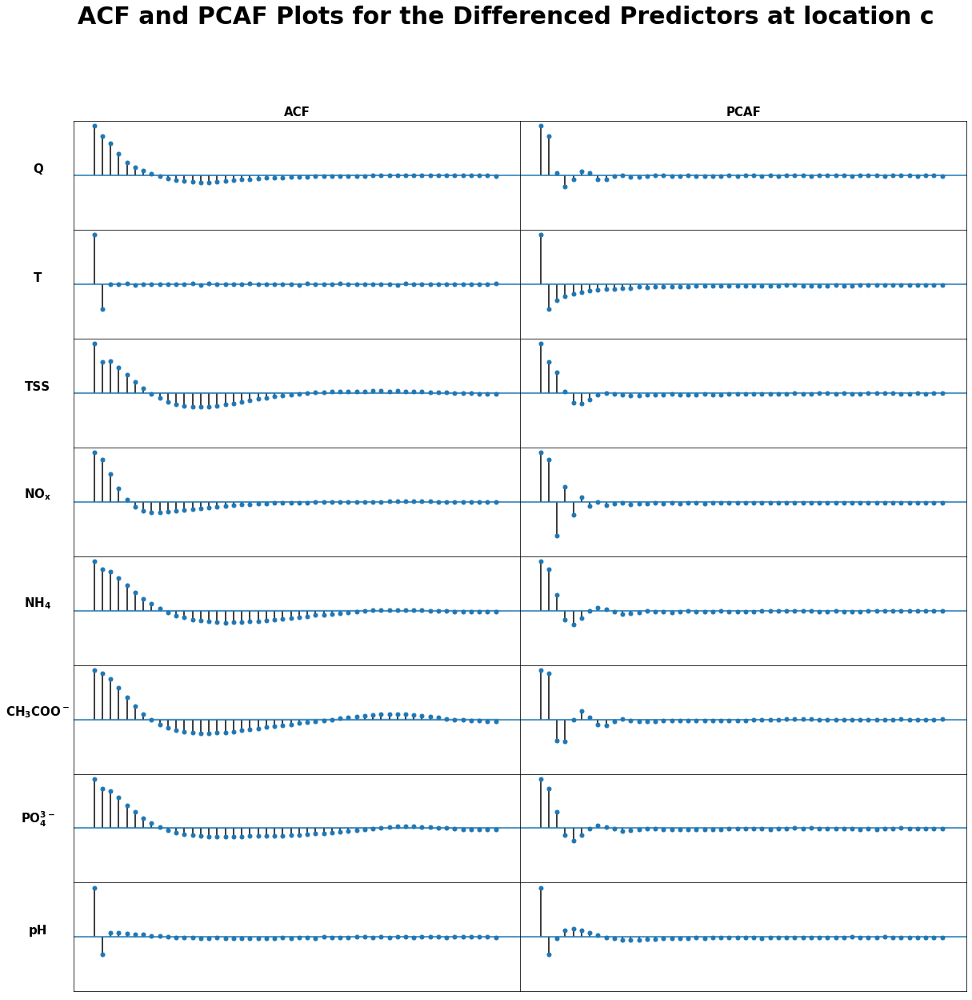

In [381]:
ACFPACF(X_c_diff, 'ACF and PCAF Plots for the Differenced Predictors at location c',20)

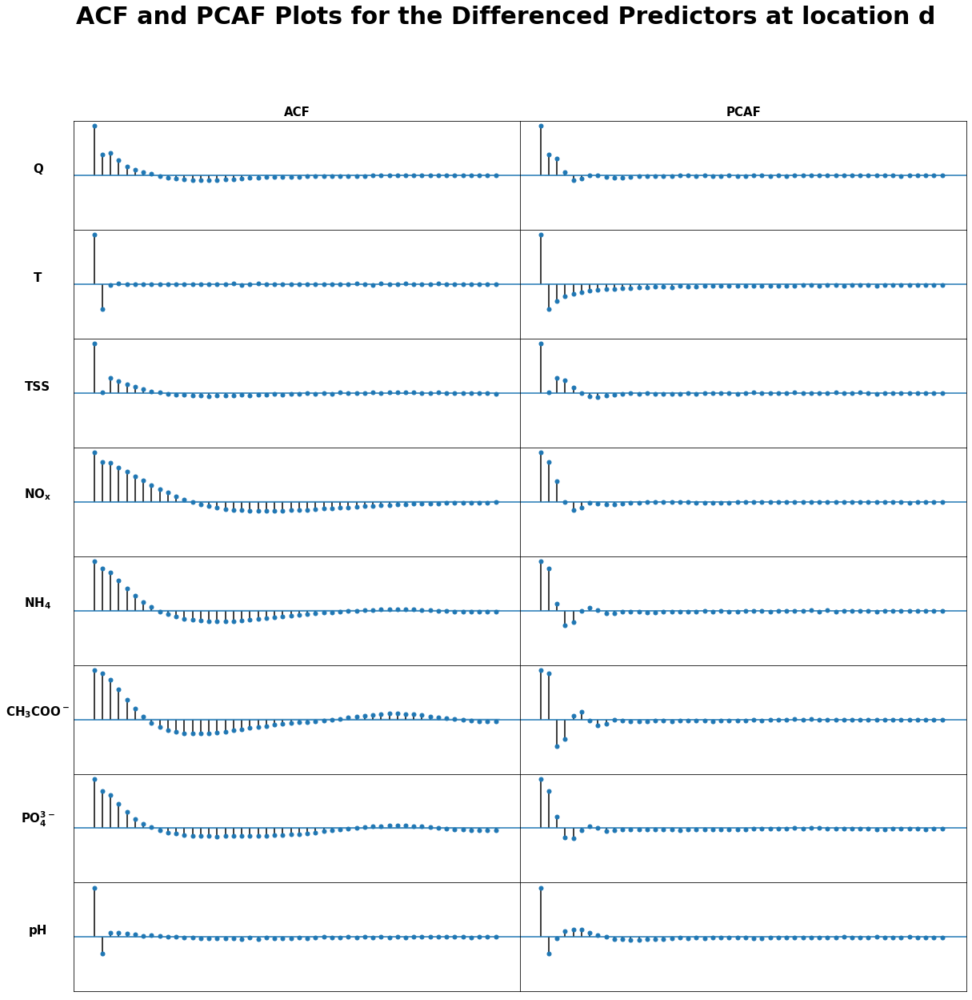

In [382]:
ACFPACF(X_d_diff, 'ACF and PCAF Plots for the Differenced Predictors at location d',20)

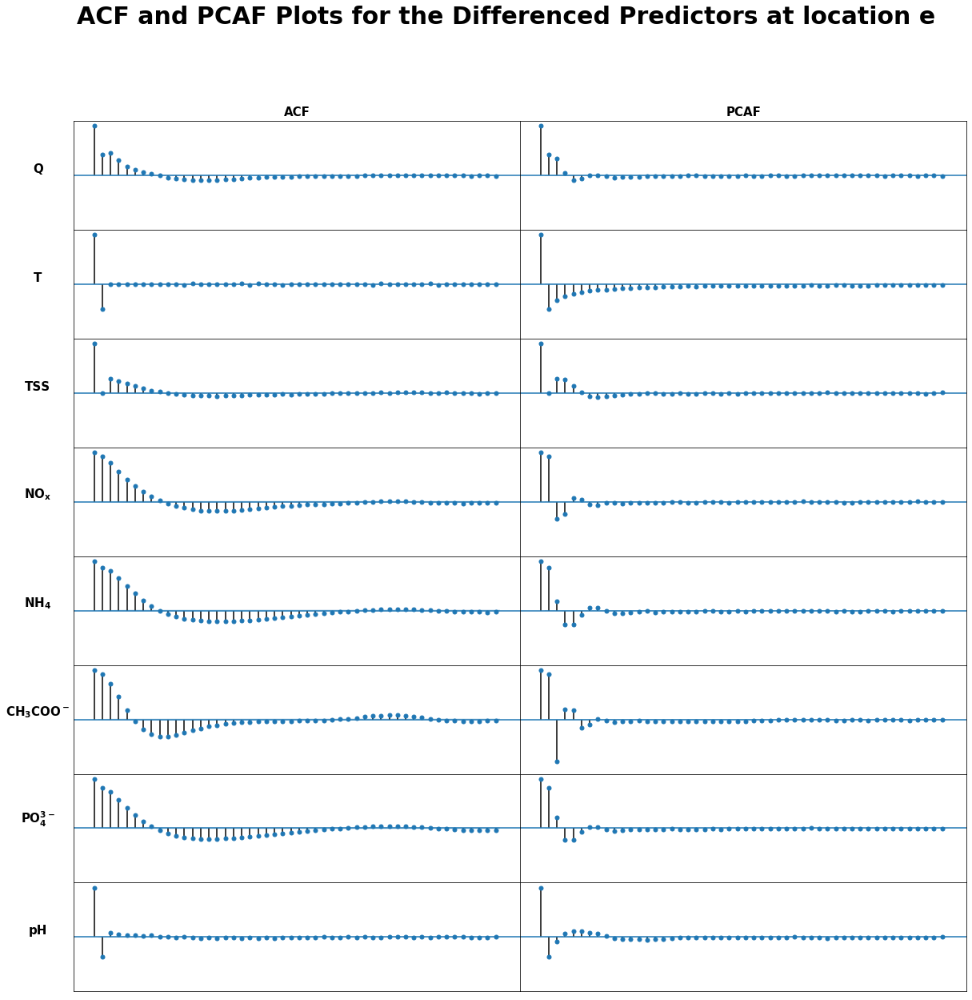

In [383]:
ACFPACF(X_e_diff, 'ACF and PCAF Plots for the Differenced Predictors at location e',20)

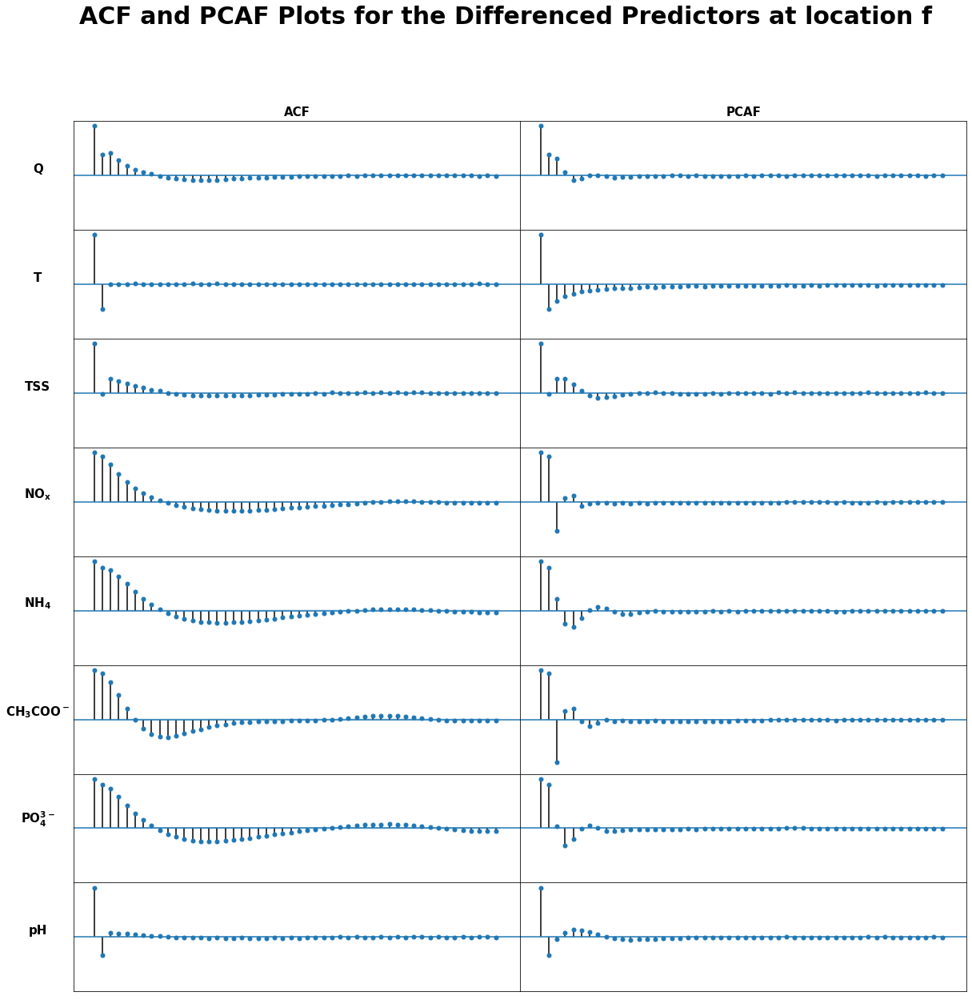

In [384]:
ACFPACF(X_f_diff, 'ACF and PCAF Plots for the Differenced Predictors at location f',20)

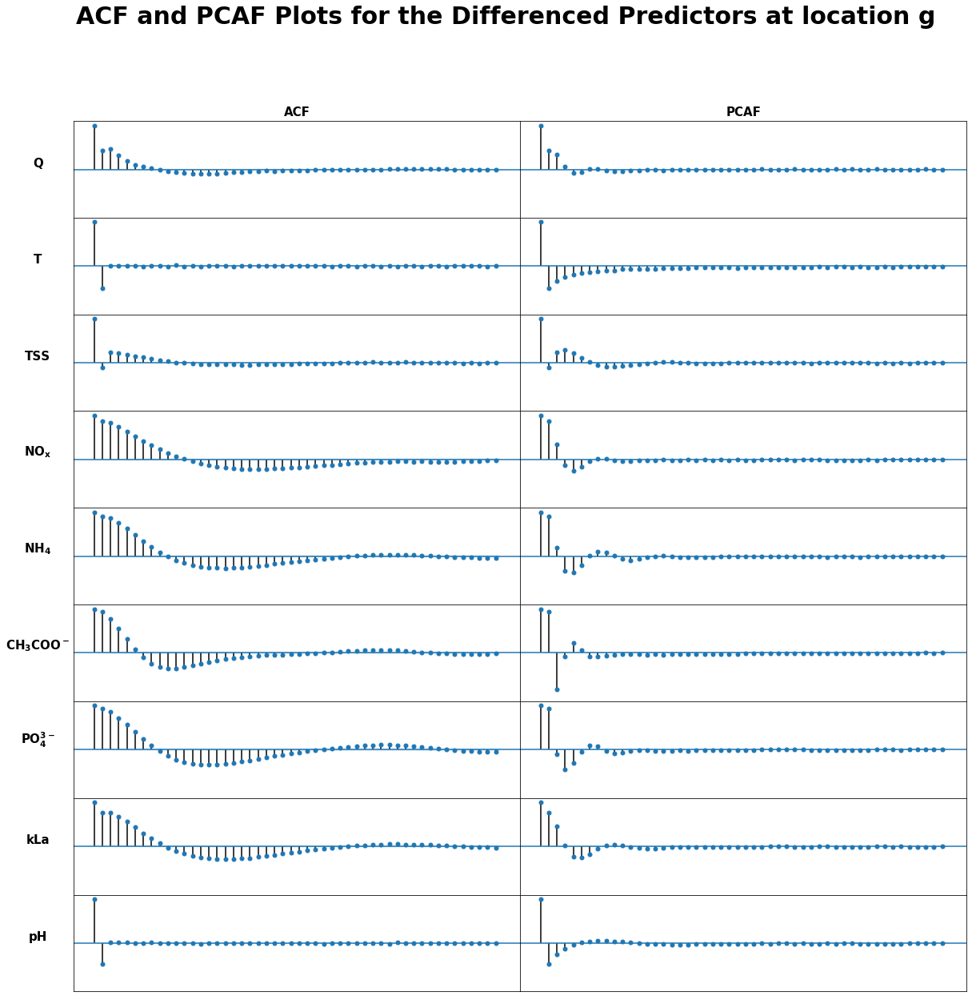

In [23]:
ACFPACF(X_g_diff, 'ACF and PCAF Plots for the Differenced Predictors at location g',20)

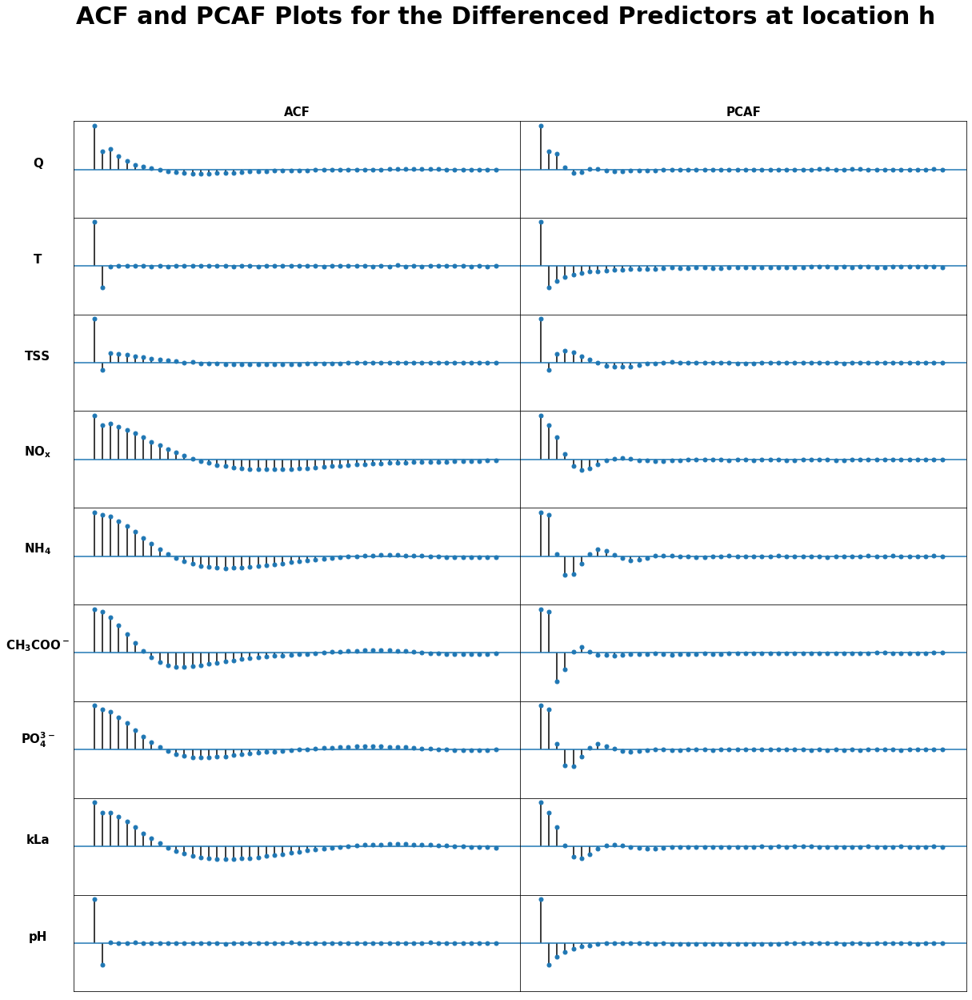

In [24]:
ACFPACF(X_h_diff, 'ACF and PCAF Plots for the Differenced Predictors at location h',20)

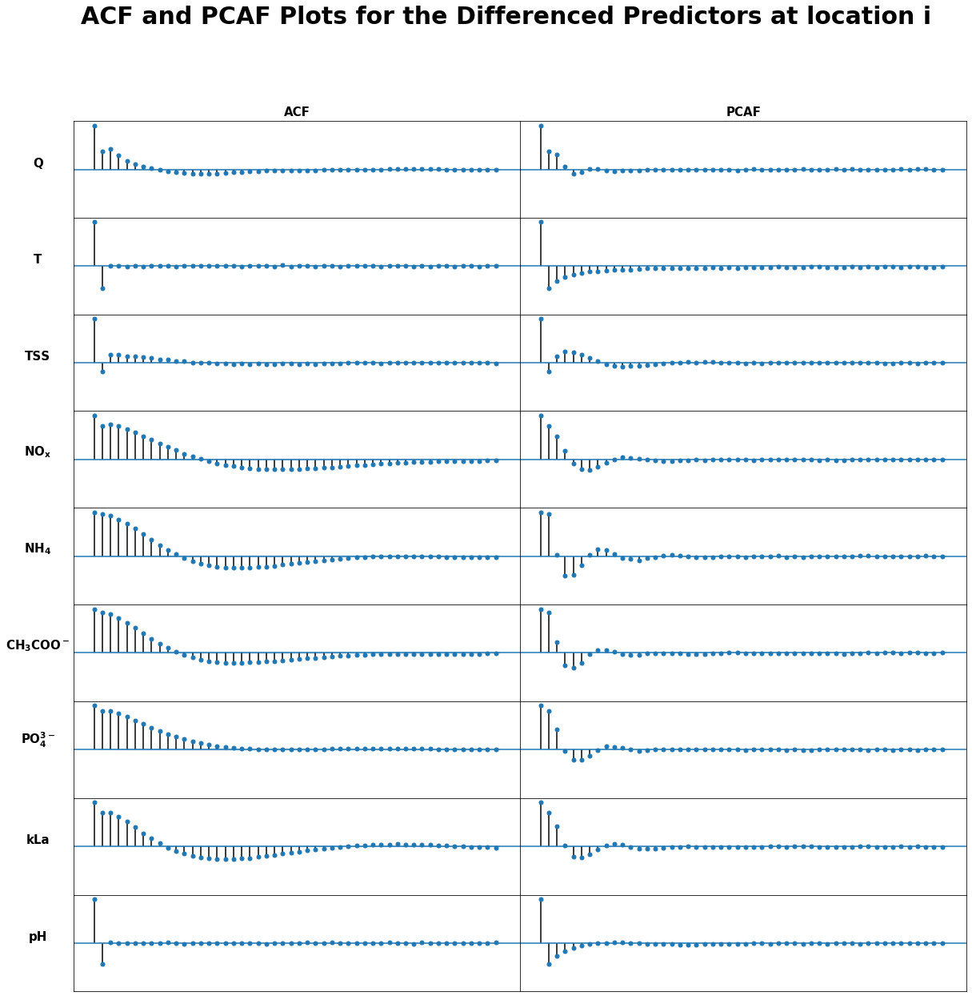

In [25]:
ACFPACF(X_i_diff, 'ACF and PCAF Plots for the Differenced Predictors at location i',20)

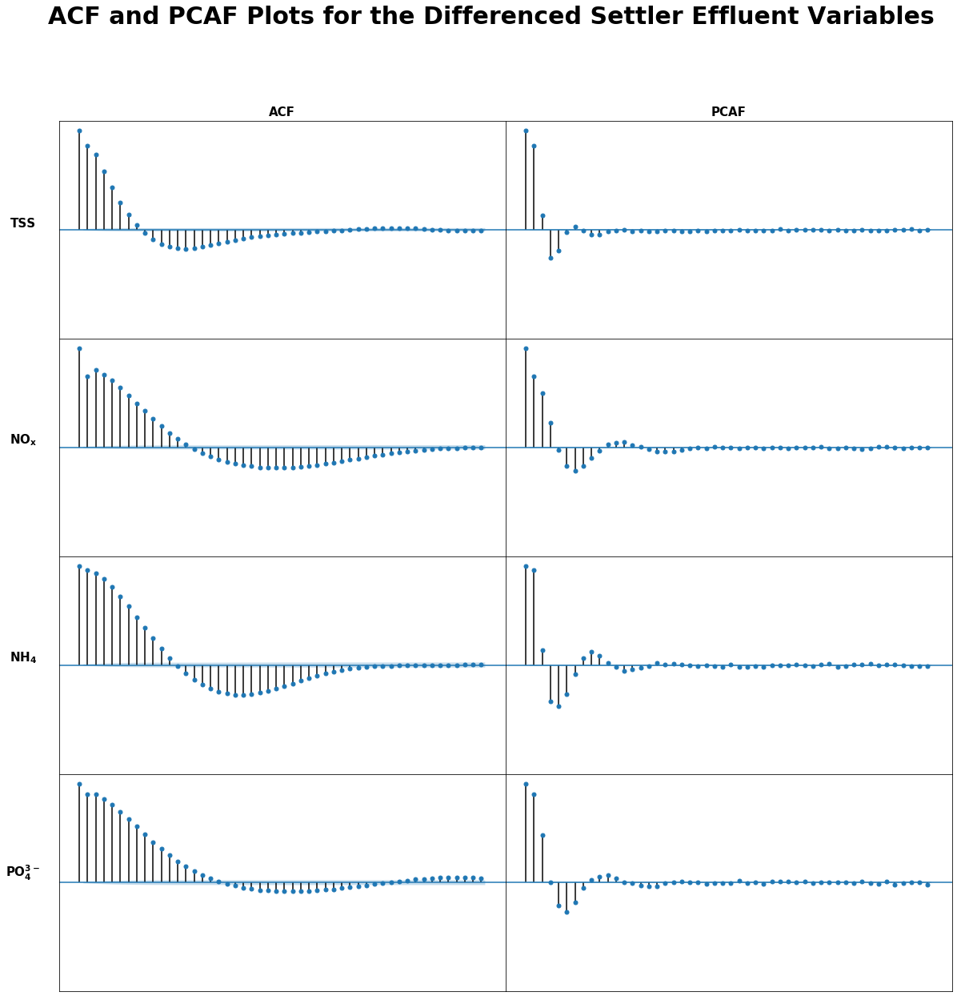

In [26]:
ACFPACF(y_diff, 'ACF and PCAF Plots for the Differenced Settler Effluent Variables',20)

In [27]:
## This function plots the three ACF plots side by side for the variables

def ACF3(X,X2,X3,title,graphsize):
       
    #This drops the kLa column in the non-aerated tanks, since it does not compute,
    #and the data is also just a constant 0, so not much information to grab!
    # This works even though the actual mean of all columns is zero, due to numerical precision
    
    if 'kLa' in X.columns:
        if (np.mean(X['kLa']) == 0.0):
            X = X.drop(['kLa'], axis = 1)
            X2 = X2.drop(['kLa'], axis = 1)
            X3 = X3.drop(['kLa'], axis = 1)
    
    
    
    #Defining a significance level
    significance_level = 0.167
    fig, ax = plt.subplots(X.shape[1],3, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 30, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    number_of_variables = X.shape[1]
    plot_names = ['ACF Original Data', 'ACF Daily Differenced', 'ACF Daily and First Differenced']

    for i in range(number_of_variables):
        plot_acf(X[X.columns.tolist()[i]], ax = ax[i,0], title = None)
        plot_acf(X2[X2.columns.tolist()[i]], ax = ax[i,1], title = None)
        plot_acf(X3[X3.columns.tolist()[i]], ax = ax[i,2], title = None)
        
    
    for i in range(number_of_variables):
        for j in range(3):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            ax[i,j].set_ylim(-1.1,1.1)



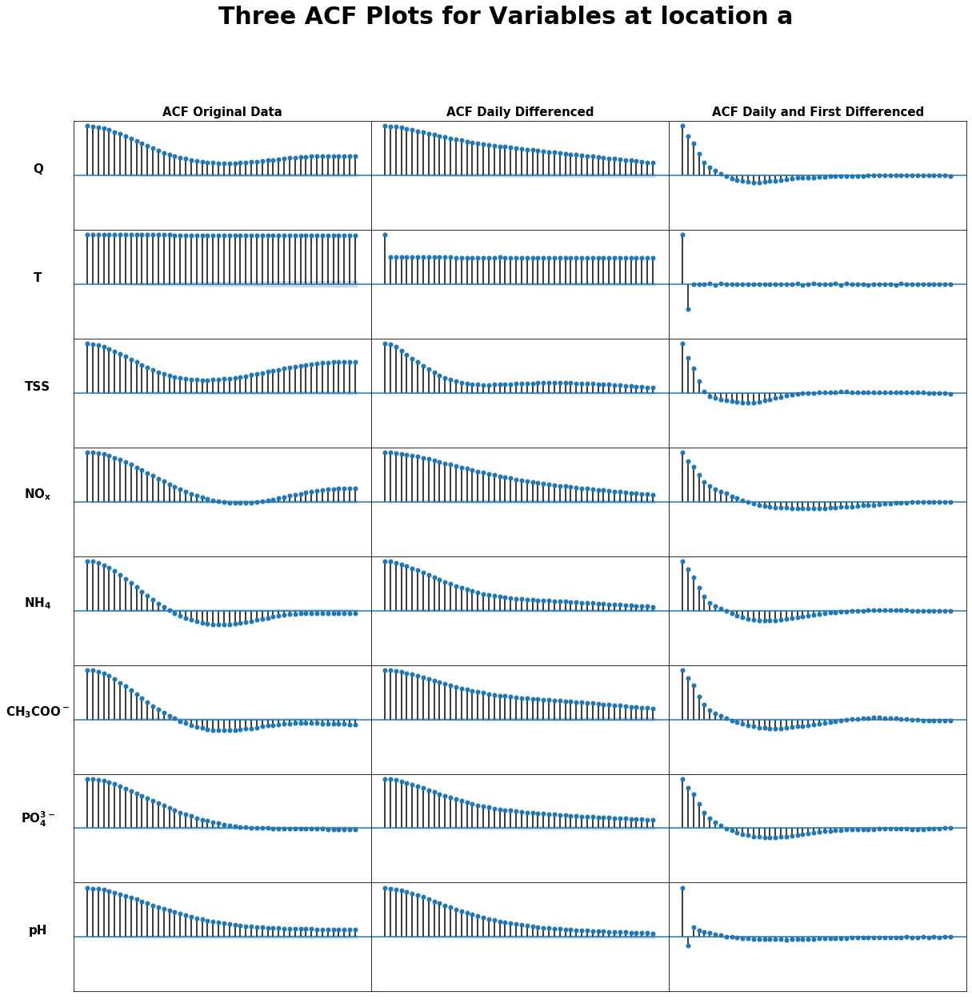

In [28]:
ACF3(X_a, X_a_daily_diff, X_a_diff, 'Three ACF Plots for Variables at location a', 20)

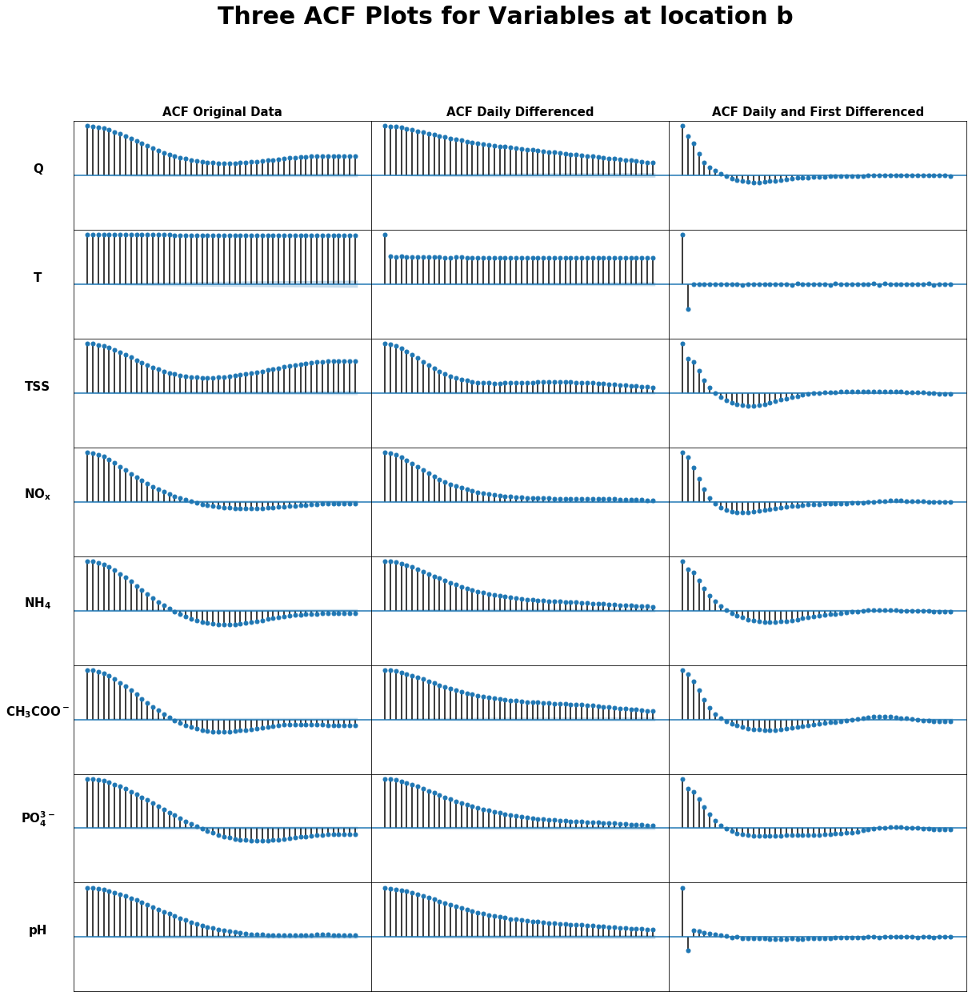

In [29]:
ACF3(X_b, X_b_daily_diff, X_b_diff, 'Three ACF Plots for Variables at location b', 20)

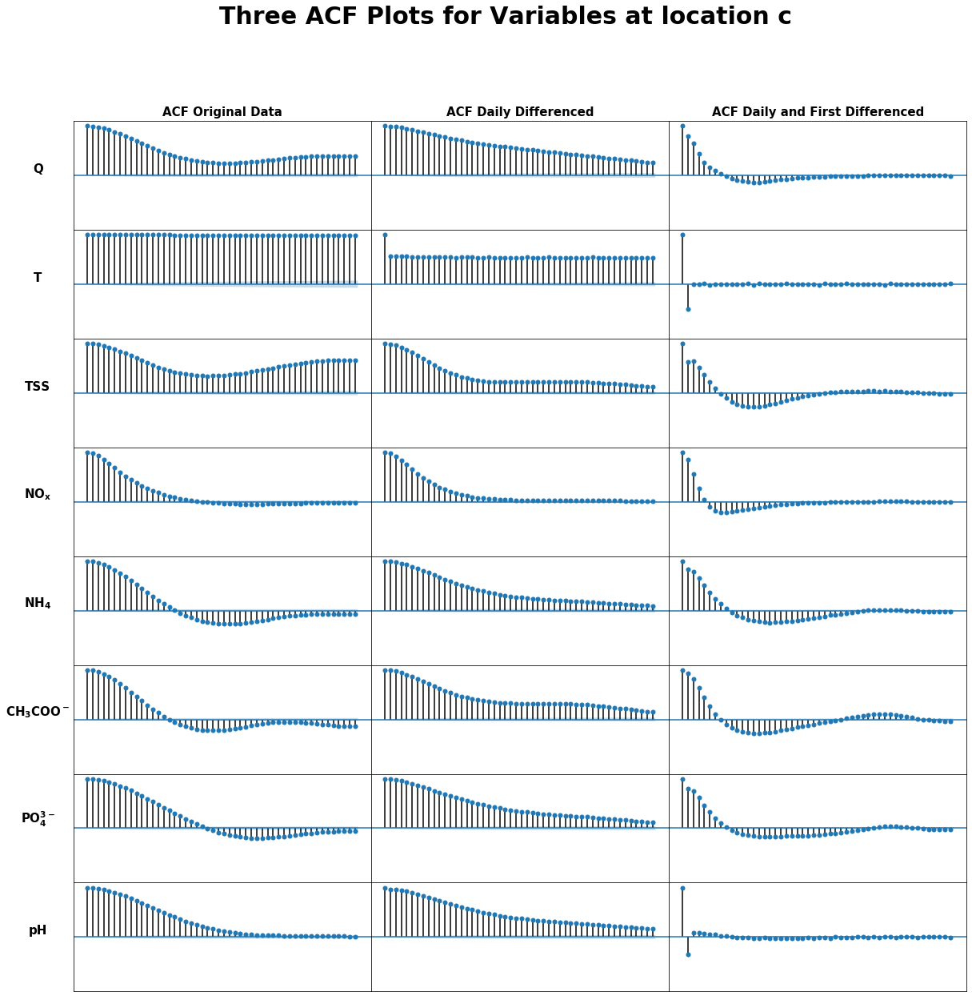

In [30]:
ACF3(X_c, X_c_daily_diff, X_c_diff, 'Three ACF Plots for Variables at location c', 20)

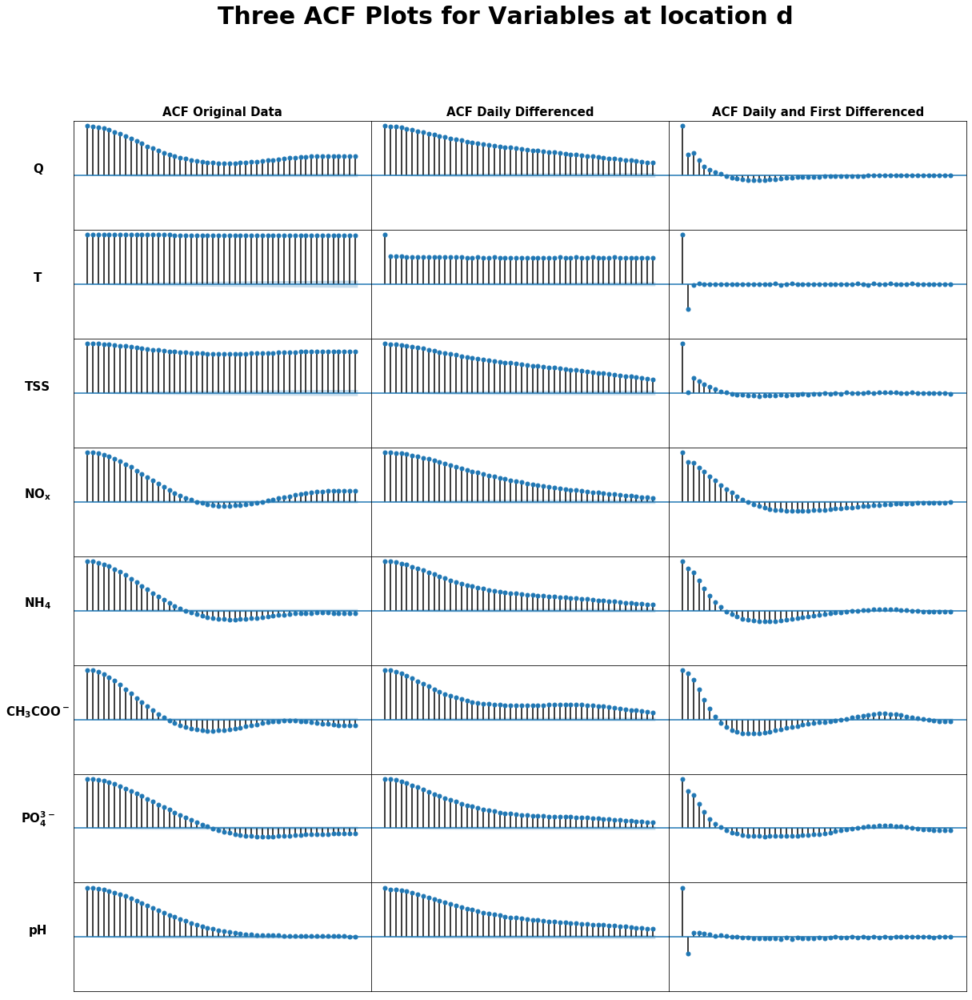

In [31]:
ACF3(X_d, X_d_daily_diff, X_d_diff, 'Three ACF Plots for Variables at location d', 20)

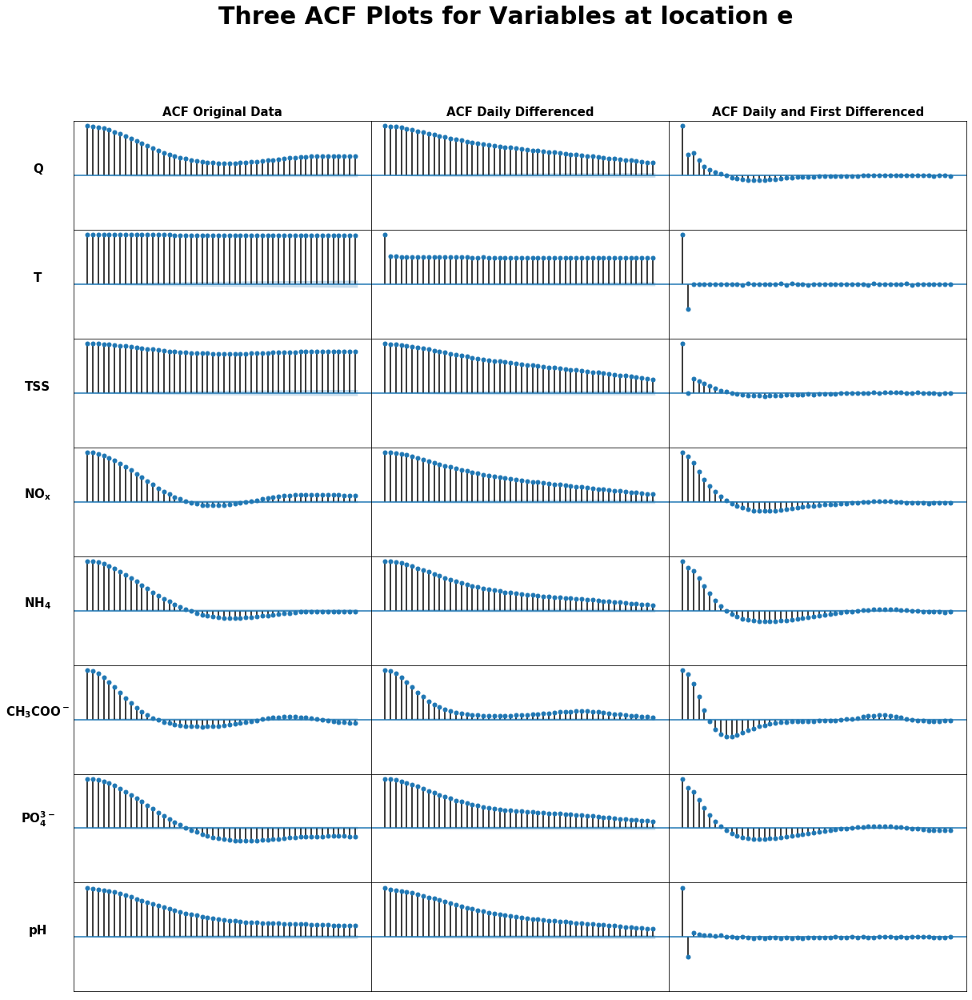

In [32]:
ACF3(X_e, X_e_daily_diff, X_e_diff, 'Three ACF Plots for Variables at location e', 20)

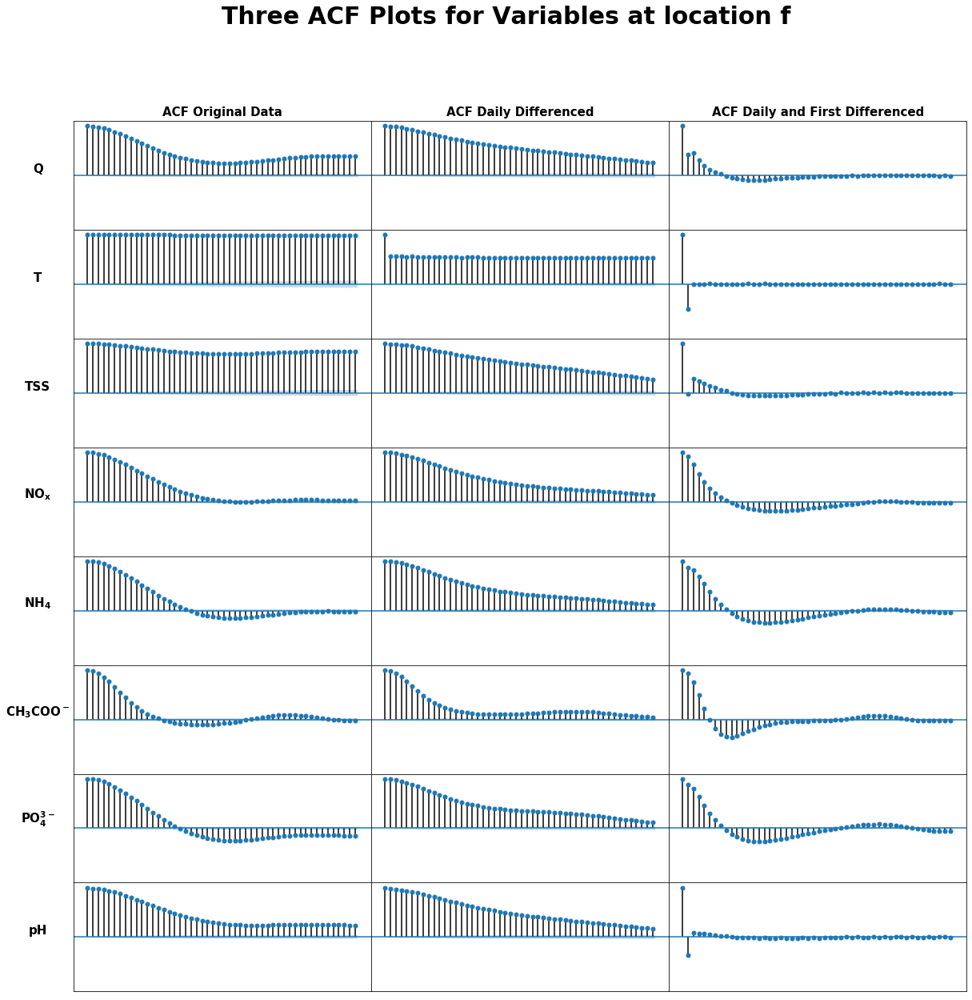

In [33]:
ACF3(X_f, X_f_daily_diff, X_f_diff, 'Three ACF Plots for Variables at location f', 20)

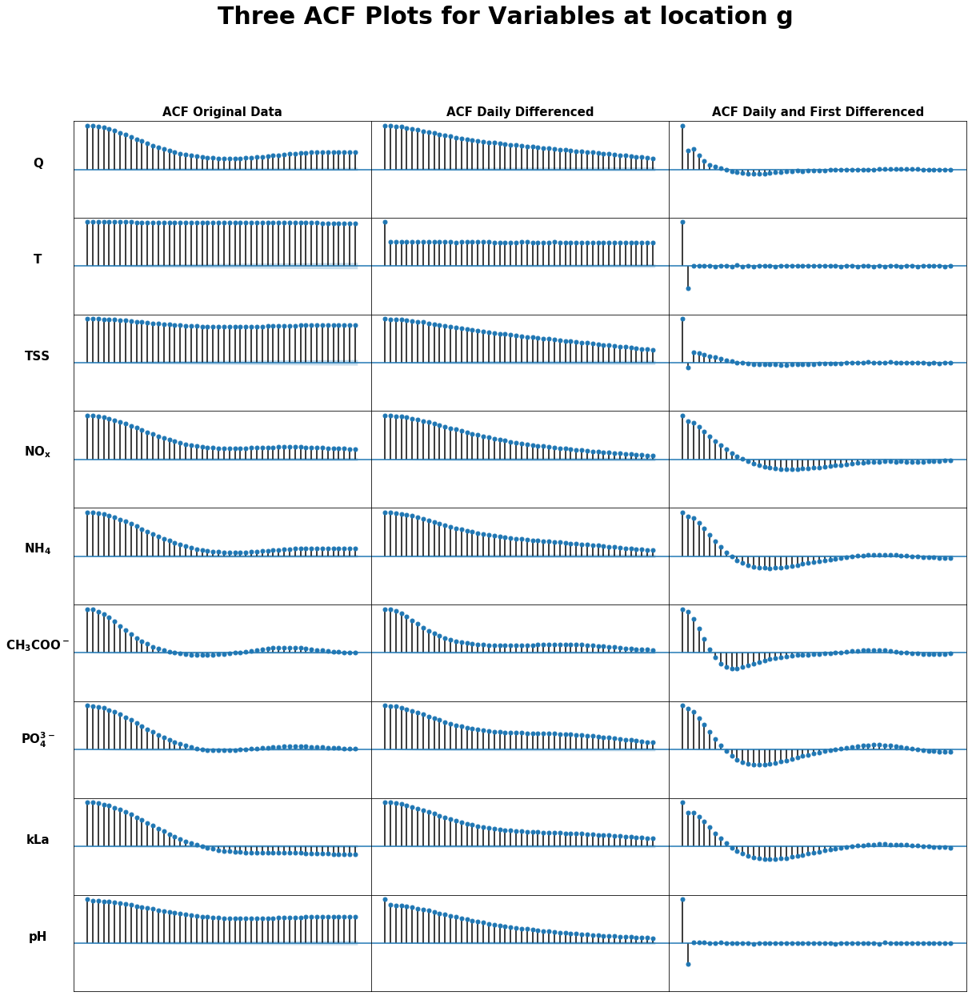

In [34]:
ACF3(X_g, X_g_daily_diff, X_g_diff, 'Three ACF Plots for Variables at location g', 20)

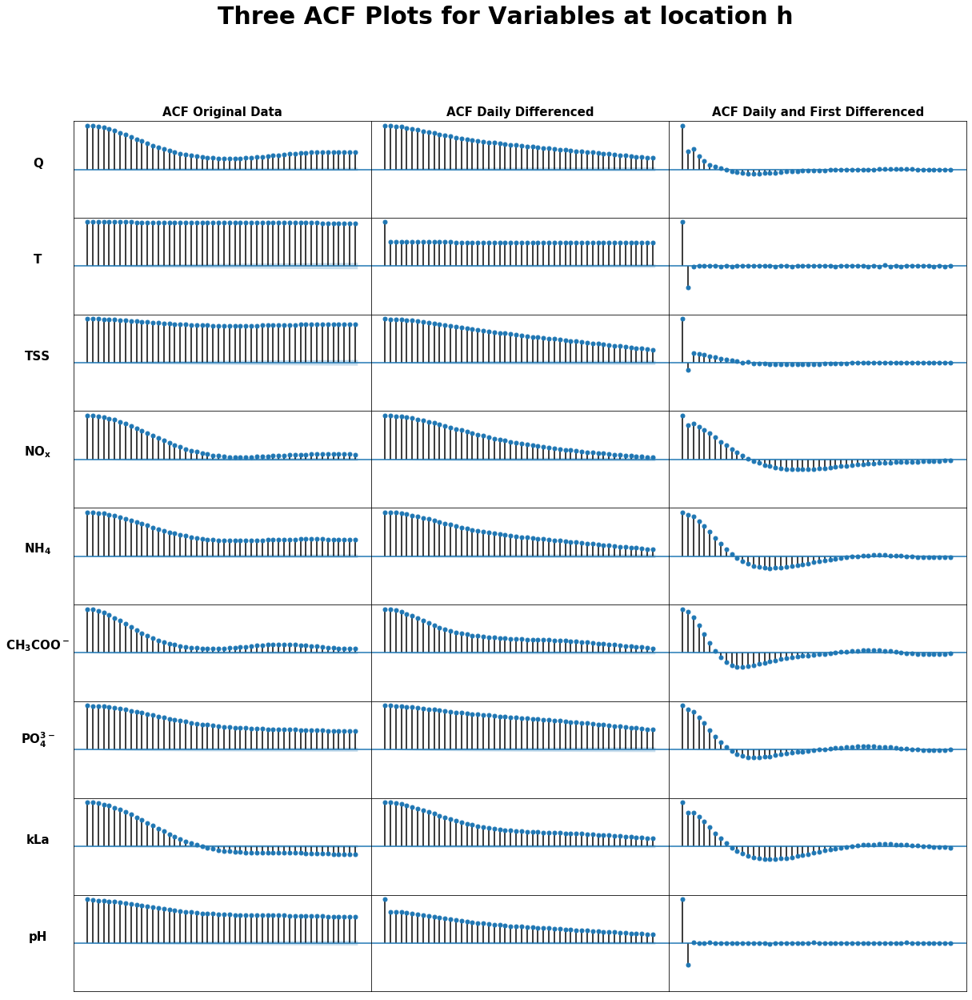

In [35]:
ACF3(X_h, X_h_daily_diff, X_h_diff, 'Three ACF Plots for Variables at location h', 20)

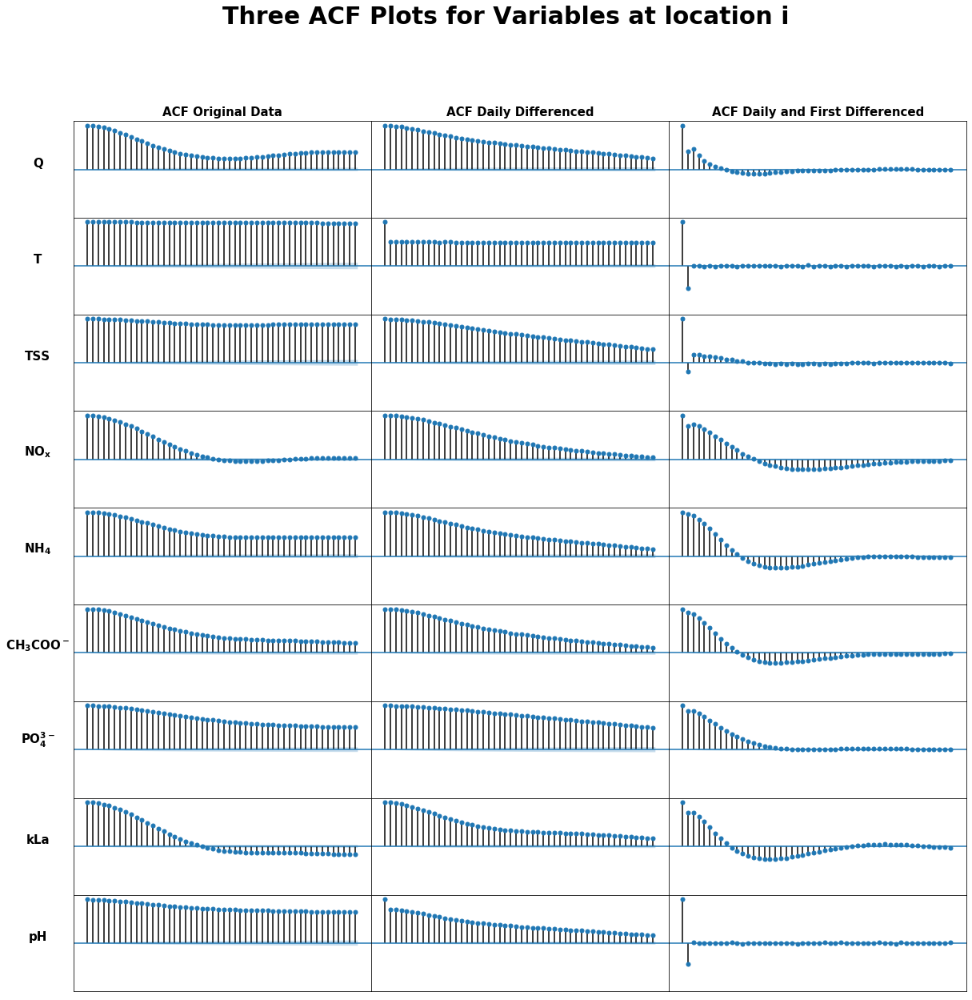

In [36]:
ACF3(X_i, X_i_daily_diff, X_i_diff, 'Three ACF Plots for Variables at location i', 20)

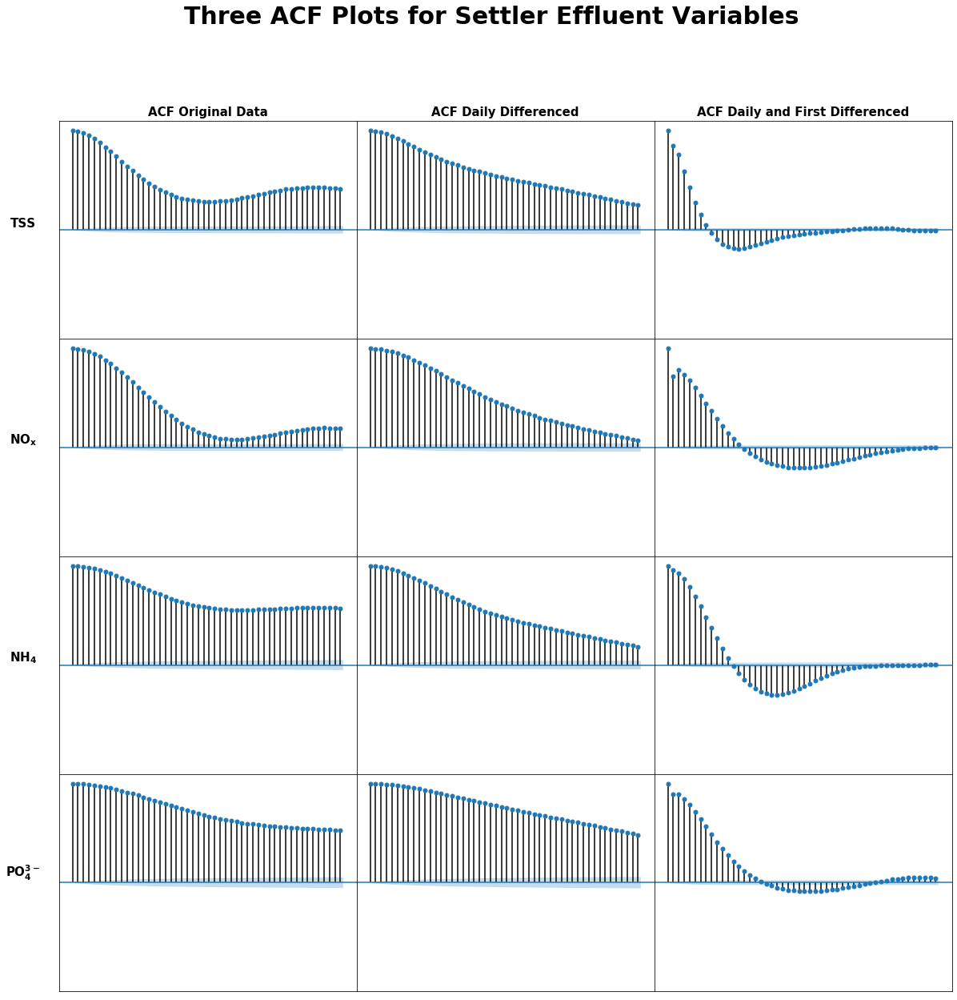

In [37]:
ACF3(y, y_daily_diff, y_diff, 'Three ACF Plots for Settler Effluent Variables', 20)

In [38]:
## This function plots the three PACF plots side by side for the variables

def PACF3(X,X2,X3,title,graphsize):
       
    #This drops the kLa column in the non-aerated tanks, since it does not compute,
    #and the data is also just a constant 0, so not much information to grab!
    # This works even though the actual mean of all columns is zero, due to numerical precision
    
    if 'kLa' in X.columns:
        if (np.mean(X['kLa']) == 0.0):
            X = X.drop(['kLa'], axis = 1)
            X2 = X2.drop(['kLa'], axis = 1)
            X3 = X3.drop(['kLa'], axis = 1)
    
    
    
    #Defining a significance level
    significance_level = 0.167
    fig, ax = plt.subplots(X.shape[1],3, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 30, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    number_of_variables = X.shape[1]
    plot_names = ['PACF Original Data', 'PACF Daily Differenced', 'PACF Daily and First Differenced']

    for i in range(number_of_variables):
        plot_pacf(X[X.columns.tolist()[i]], ax = ax[i,0], title = None)
        plot_pacf(X2[X2.columns.tolist()[i]], ax = ax[i,1], title = None)
        plot_pacf(X3[X3.columns.tolist()[i]], ax = ax[i,2], title = None)
        
    
    for i in range(number_of_variables):
        for j in range(3):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            ax[i,j].set_ylim(-1.1,1.1)




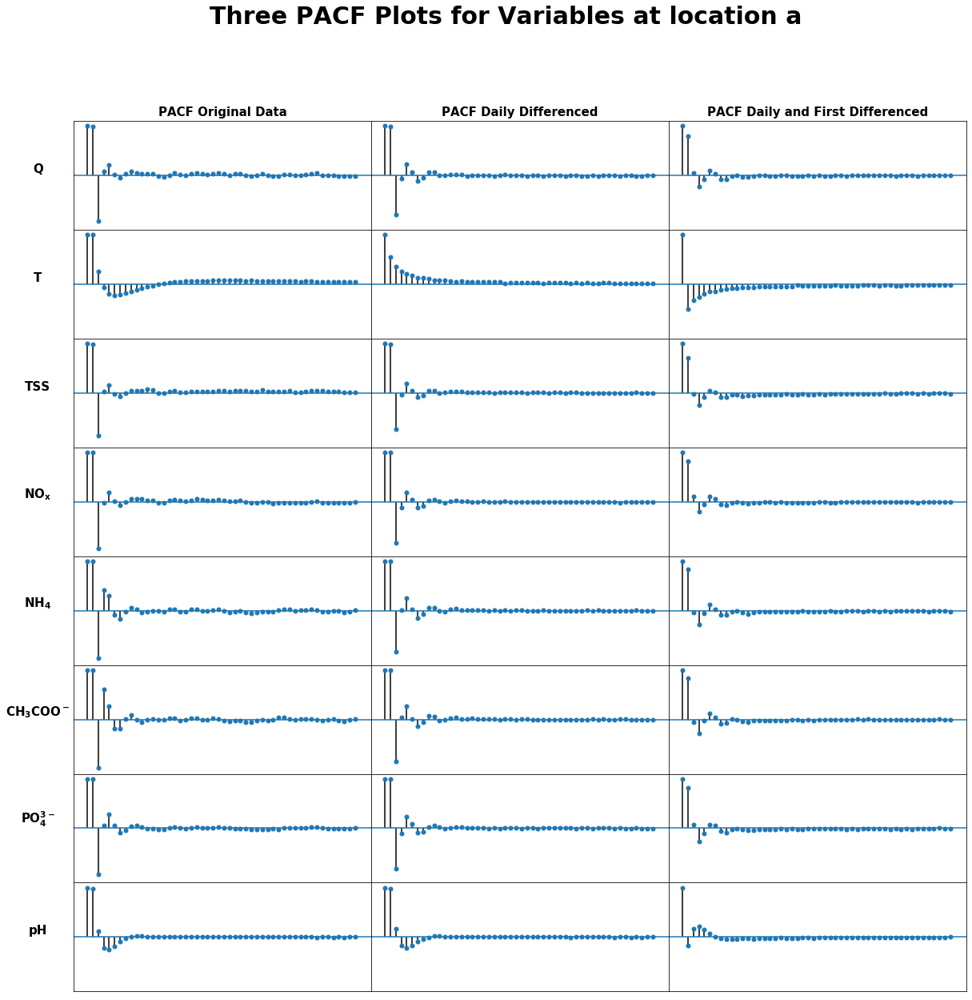

In [39]:
PACF3(X_a, X_a_daily_diff, X_a_diff, 'Three PACF Plots for Variables at location a', 20)

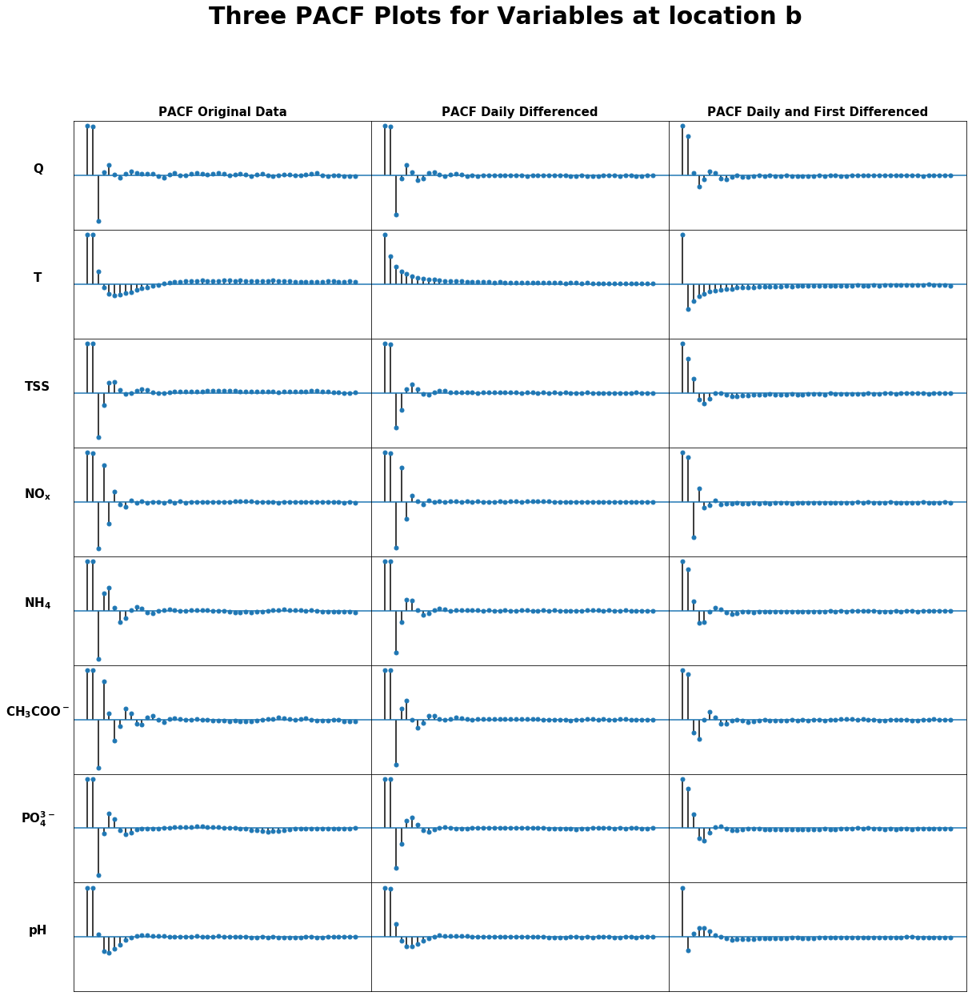

In [40]:
PACF3(X_b, X_b_daily_diff, X_b_diff, 'Three PACF Plots for Variables at location b', 20)

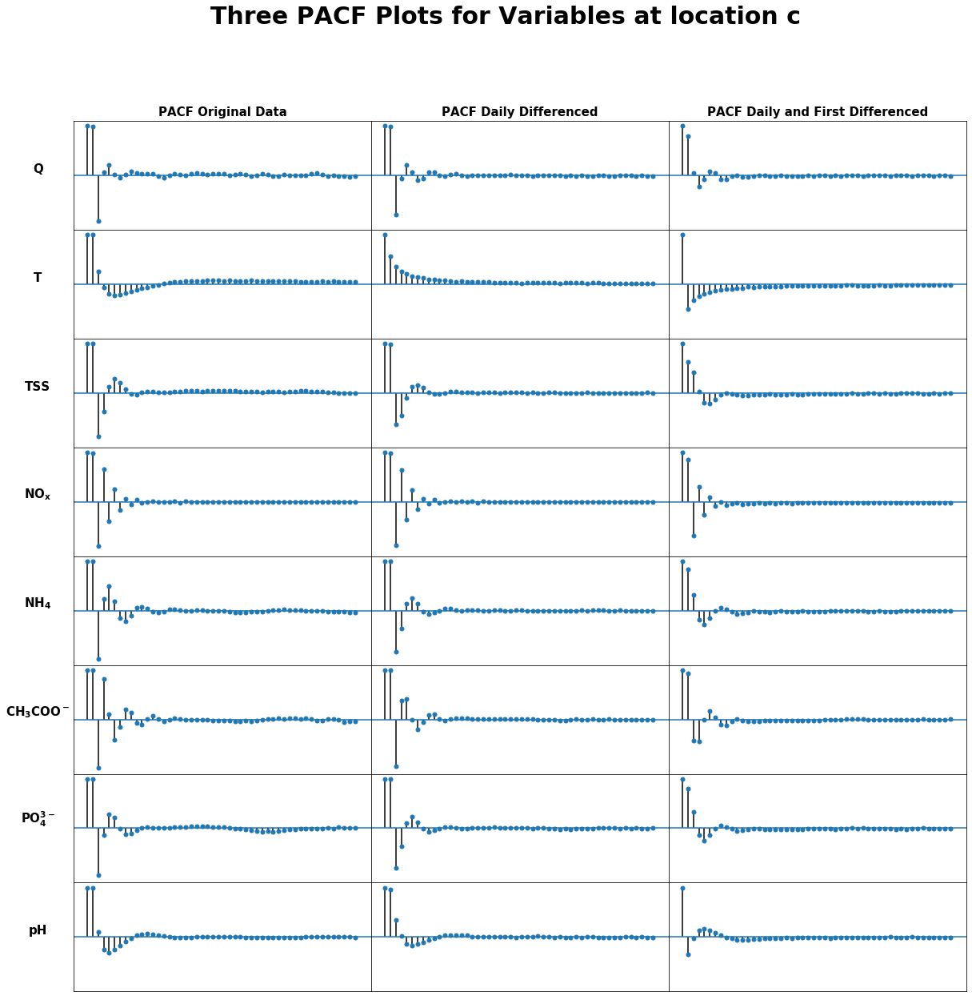

In [41]:
PACF3(X_c, X_c_daily_diff, X_c_diff, 'Three PACF Plots for Variables at location c', 20)

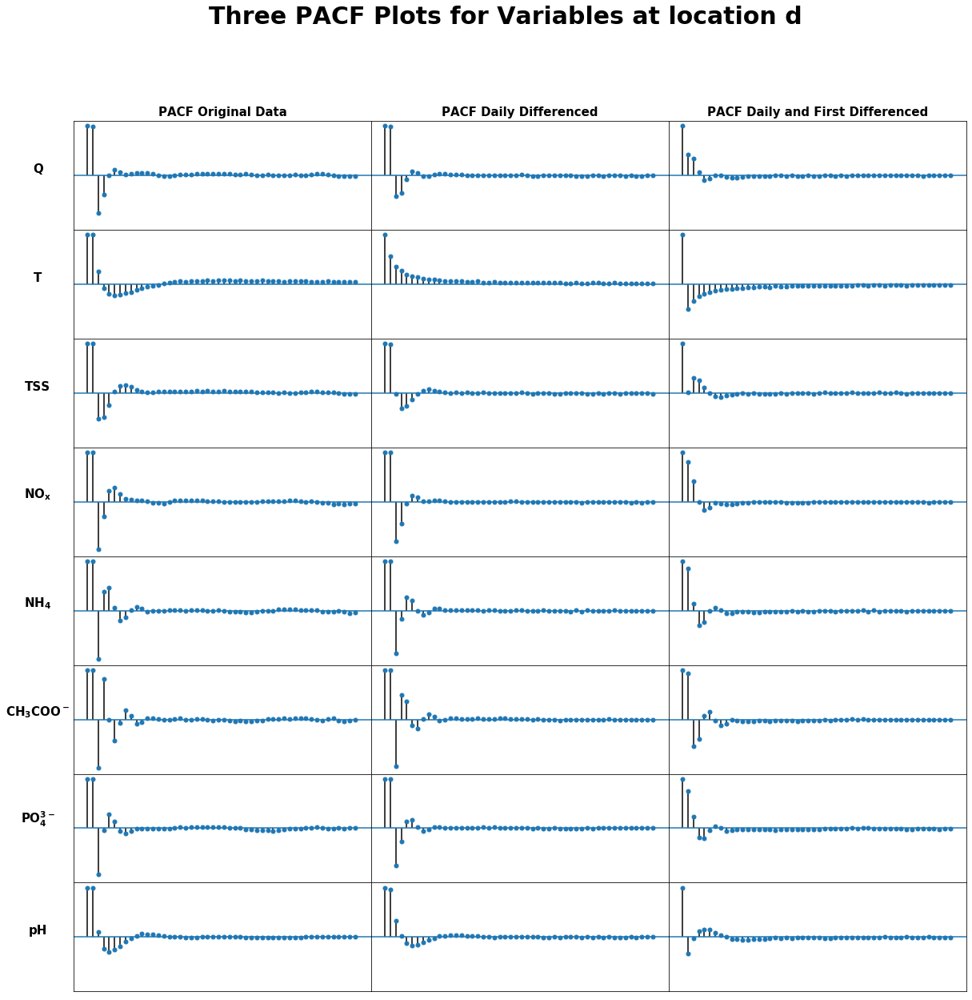

In [42]:
PACF3(X_d, X_d_daily_diff, X_d_diff, 'Three PACF Plots for Variables at location d', 20)

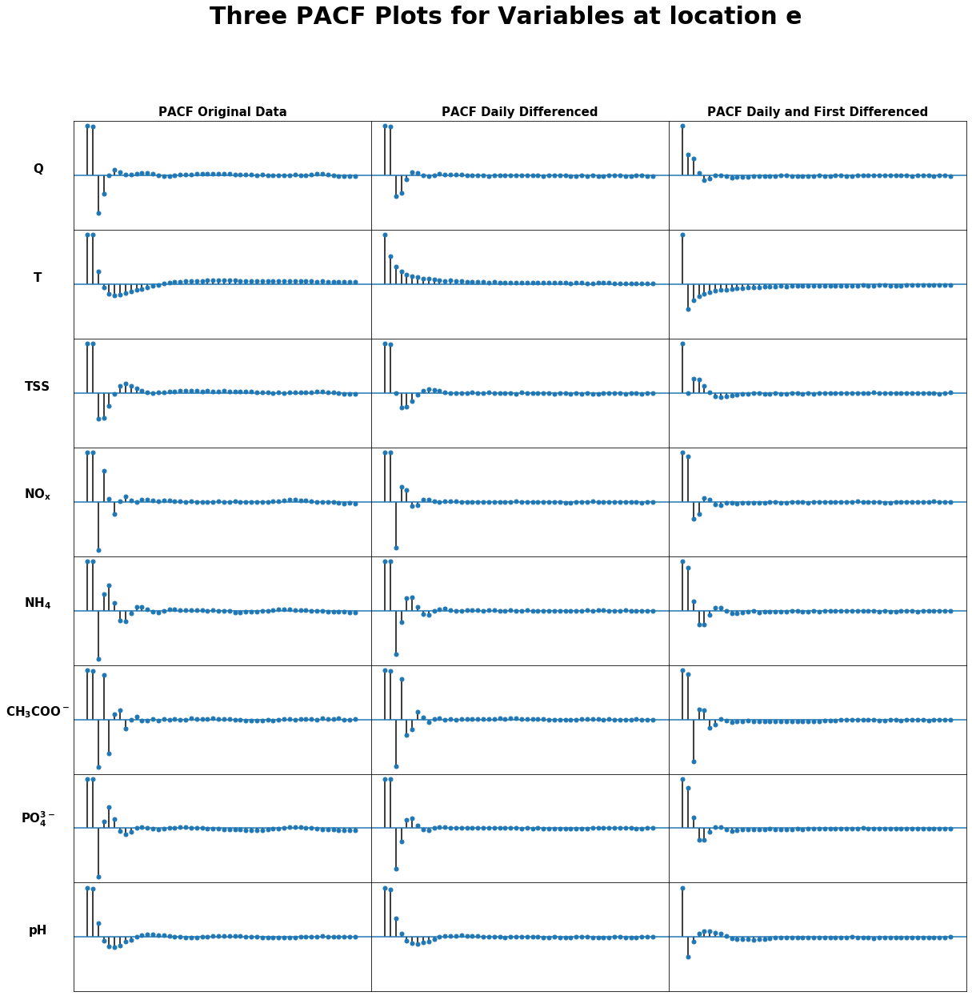

In [43]:
PACF3(X_e, X_e_daily_diff, X_e_diff, 'Three PACF Plots for Variables at location e', 20)

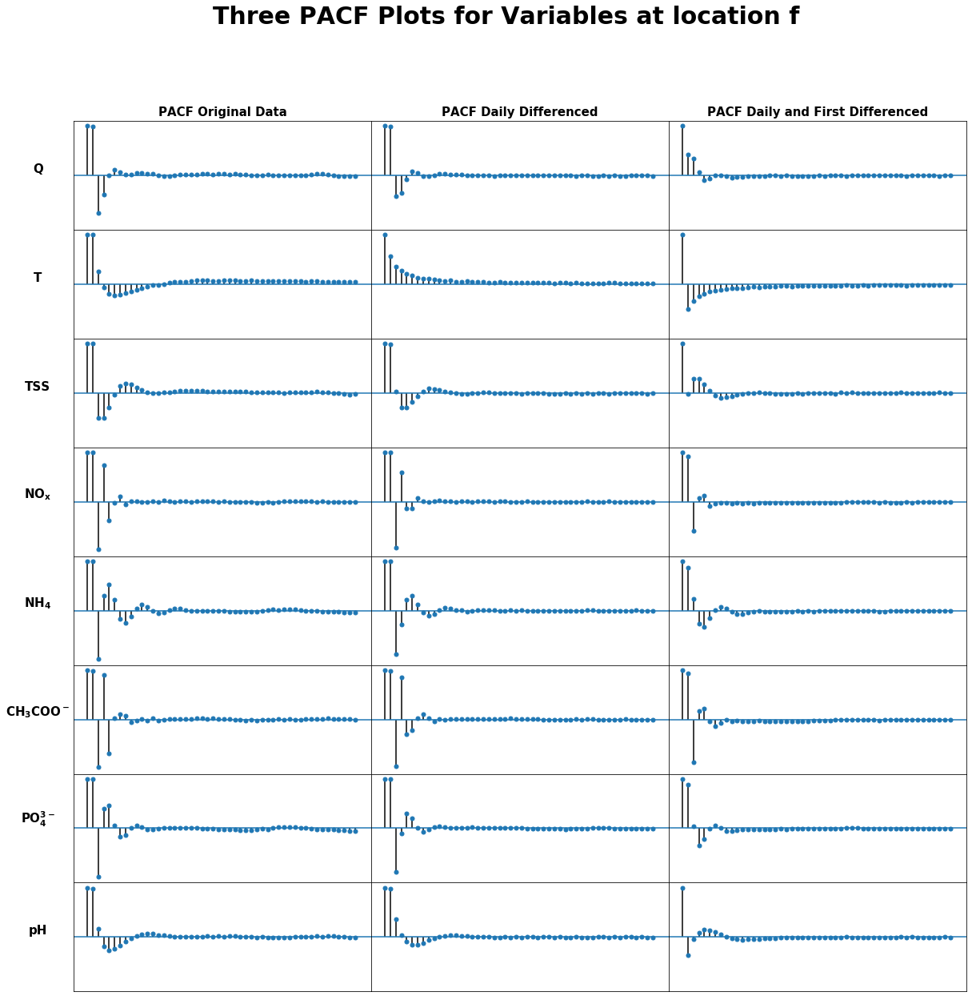

In [44]:
PACF3(X_f, X_f_daily_diff, X_f_diff, 'Three PACF Plots for Variables at location f', 20)

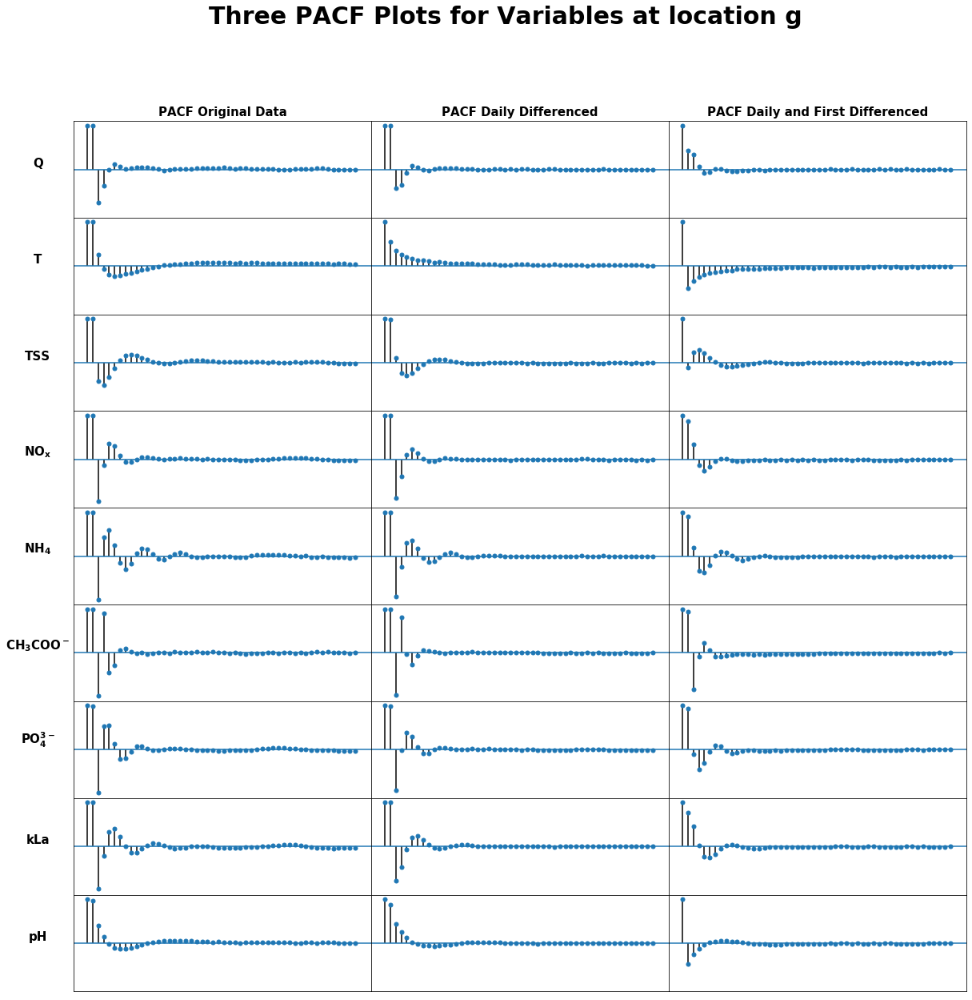

In [45]:
PACF3(X_g, X_g_daily_diff, X_g_diff, 'Three PACF Plots for Variables at location g', 20)

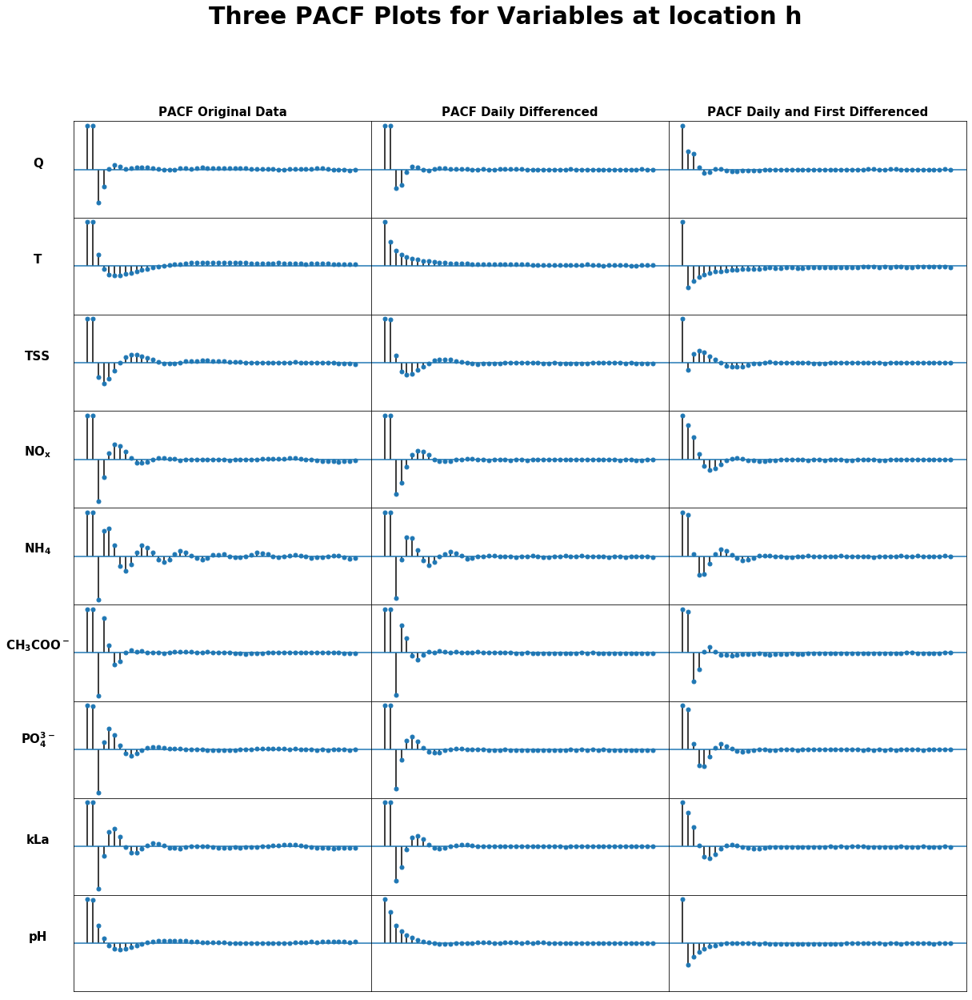

In [46]:
PACF3(X_h, X_h_daily_diff, X_h_diff, 'Three PACF Plots for Variables at location h', 20)

/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


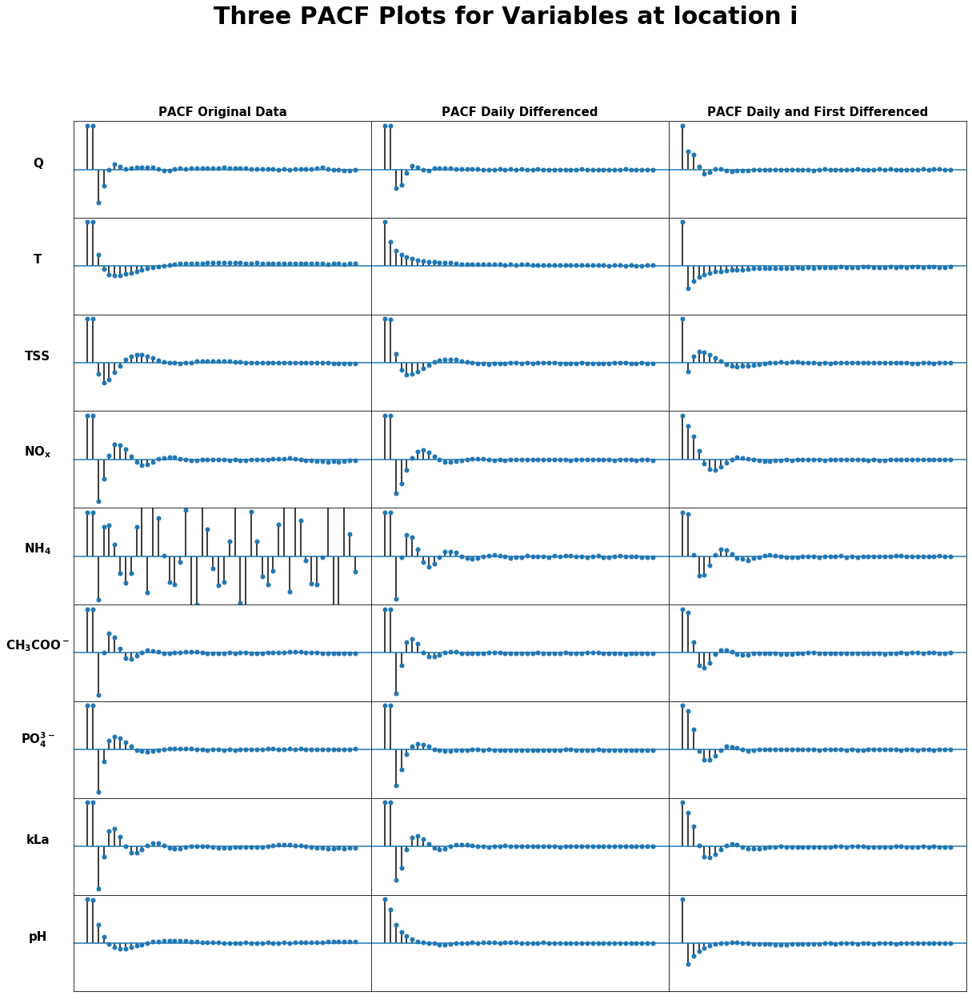

In [47]:
PACF3(X_i, X_i_daily_diff, X_i_diff, 'Three PACF Plots for Variables at location i', 20)

/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


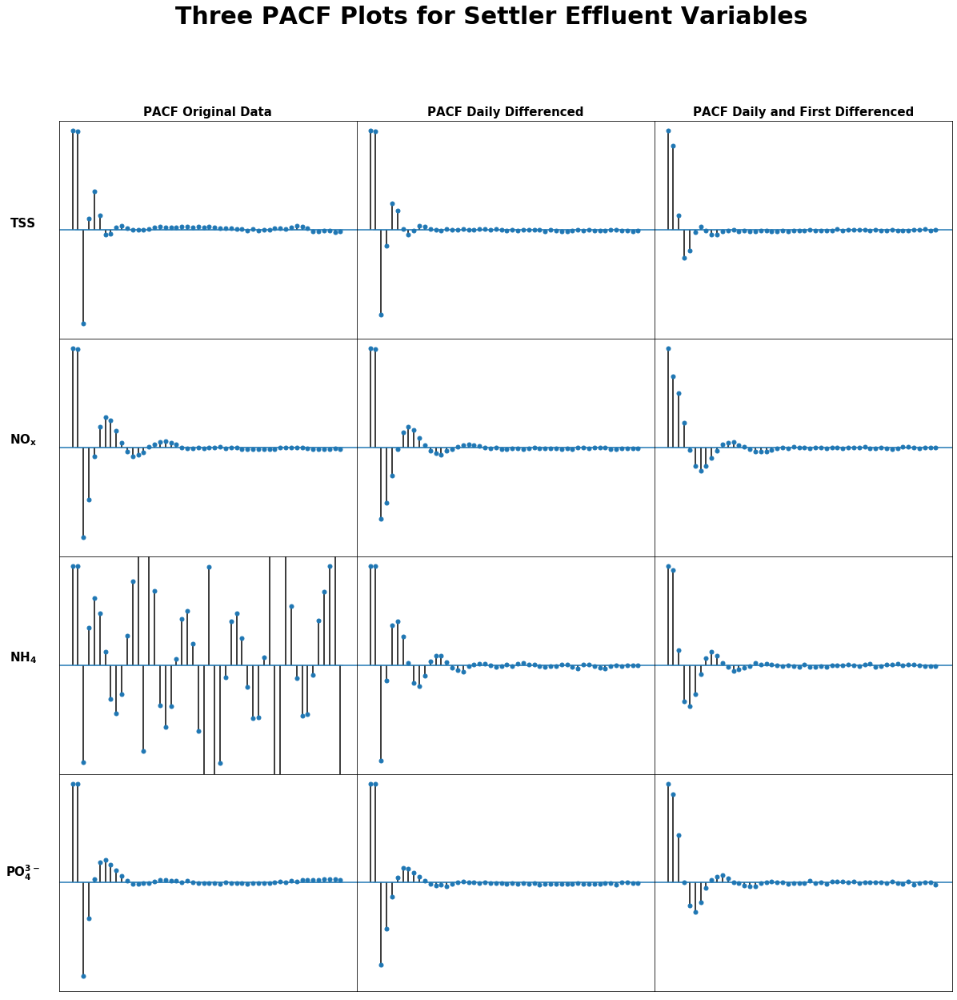

In [30]:
PACF3(y, y_daily_diff, y_diff, 'Three PACF Plots for Settler Effluent Variables', 20)

## Now we will try to combine [X|Y] and model it as a VAR process

In [43]:
# Load the file with the pymatreader function read_mat
data_mat_XY = read_mat('Data_XY.mat')

In [44]:
# Defining column names
#Input variable names
Header_XY = ['Q','T','TSS',r'$\mathbf{NO_x}$', r'$\mathbf{NH_4}$', r'$\mathbf{CH_3COO^-}$', r'$\mathbf{PO^{3-}_4}$', 'kLa', 'pH','TSS', r'$\mathbf{NO_x}$', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$']

# Creating a Pandas dataframe for the 10 different data sets.

a = pd.DataFrame(data_mat_XY['location_a'], columns = Header_XY).drop(['kLa'], axis = 1)
b = pd.DataFrame(data_mat_XY['location_b'], columns = Header_XY).drop(['kLa'], axis = 1)
c = pd.DataFrame(data_mat_XY['location_c'], columns = Header_XY).drop(['kLa'], axis = 1)
d = pd.DataFrame(data_mat_XY['location_d'], columns = Header_XY).drop(['kLa'], axis = 1)
e = pd.DataFrame(data_mat_XY['location_e'], columns = Header_XY).drop(['kLa'], axis = 1)
f = pd.DataFrame(data_mat_XY['location_f'], columns = Header_XY).drop(['kLa'], axis = 1)
g = pd.DataFrame(data_mat_XY['location_g'], columns = Header_XY)
h = pd.DataFrame(data_mat_XY['location_h'], columns = Header_XY)
i = pd.DataFrame(data_mat_XY['location_i'], columns = Header_XY)


y = pd.DataFrame(data_mat['Effluent'], columns = Header_out)

In [45]:
a_diff = a.diff(96).diff().dropna()
b_diff = b.diff(96).diff().dropna()
c_diff = c.diff(96).diff().dropna()
d_diff = d.diff(96).diff().dropna()
e_diff = e.diff(96).diff().dropna()
f_diff = f.diff(96).diff().dropna()
g_diff = g.diff(96).diff().dropna()
h_diff = h.diff(96).diff().dropna()
i_diff = i.diff(96).diff().dropna()

In [46]:
# The following matrix is used to revert the predictions back to the actual values
# The 13978 is the length of the differencing and the 97 are the extra values required from the original data matrix
# To transform back the predictions since we did a daily (96) difference and a first difference (1)
y_test_rev = y[-(13978+97):]

def rev_pred(original, diff):
    
    X = []
        
    for i in range(len(diff)):
        k = diff[i] - original[i] + original[i+1] + original[i+96]
        X.append(k)

    
    return X



In [47]:
class SubVAR:
    def __init__(self, predictions, y_orig):
        self.rev_pred = rev_pred(y_orig[-(13978+97):].values, predictions)
        self.residuals = y_orig[-13978:]-self.rev_pred
        self.RMSE = np.mean((self.residuals)**2)**0.5

In [48]:
class VectorAutoRegressionInsample:
    def __init__(self, X, lag):
        # The 55813 correspond to the length of the training set. This produces a predictions vector with
        # the same length as the test set
        self.model = VAR(X[:55813-lag])
        self.model1 = VAR(X[55813-lag:])
        self.model_fit = self.model.fit(lag)
        self.final = deepcopy(self.model_fit)
        self.predictions = self.model1.predict(self.model_fit.params, lags = lag)
        self.TSS = SubVAR(self.predictions[:,-4], y['TSS'])
        self.NOx = SubVAR(self.predictions[:,-3], y['$\\mathbf{NO_x}$'])
        self.NH4 = SubVAR(self.predictions[:,-2], y['$\\mathbf{NH_4}$'])
        self.PO4 = SubVAR(self.predictions[:,-1], y['$\\mathbf{PO^{3-}_4}$'])
    

In [49]:
a_VAR = VectorAutoRegressionInsample(a_diff, 2)
b_VAR = VectorAutoRegressionInsample(b_diff, 2)
c_VAR = VectorAutoRegressionInsample(c_diff, 2)
d_VAR = VectorAutoRegressionInsample(d_diff, 2)
e_VAR = VectorAutoRegressionInsample(e_diff, 2)
f_VAR = VectorAutoRegressionInsample(f_diff, 2)
g_VAR = VectorAutoRegressionInsample(g_diff, 2)
h_VAR = VectorAutoRegressionInsample(h_diff, 2)
i_VAR = VectorAutoRegressionInsample(i_diff, 2)


/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignore

## Create lagged versions of OLS, PLS, and RF

In [50]:
def update_columns(dataset, lags):
    ogstring = dataset.columns.tolist()
    string = dataset.columns.tolist()
    stringa = []
    for i in range(len(lags)):
        for j in range(len(string)):
            if ogstring[j][-1] == '$':
                if ogstring[j][-4] == '_':
                    string[j] = ogstring[j][:-3] + '{' + ogstring[j][-3] + '_{t-' + f'{lags[i]}' + '}}}$'
                else:
                    string[j] = ogstring[j][:-2]+'_{t-'+f'{lags[i]}'+'}}$'
            elif ogstring[j][-1] is not '$':
                string[j] = '$\\mathbf{' + ogstring[j] + '_{t-' + f'{lags[i]}' + '}}$'
        

        stringa += string
    stringa = ogstring + stringa
    return stringa

In [51]:
def lagdif(dataset, lags):
    X = dataset
    Xlag = pd.DataFrame()
    Xlist = []
    Xlist.append(X)
    for i in range(len(lags)):
        Xlag = pd.concat([Xlag, X.shift(lags[i])], axis = 1).dropna()

    
    Xlag.columns = update_columns(X, lags[1:])
    

    return Xlag

In [52]:
# Creating a Pandas dataframe for the settler effluent data set. This time it is not scaled
y = pd.DataFrame(data_mat['Effluent'], columns = Header_out)
y_diff = y.diff(96).diff().dropna()

In [53]:
X_a_diff_lag = pd.DataFrame(lagdif(X_a_diff, [1,2]))
X_b_diff_lag = pd.DataFrame(lagdif(X_b_diff, [1,2]))
X_c_diff_lag = pd.DataFrame(lagdif(X_c_diff, [1,2]))
X_d_diff_lag = pd.DataFrame(lagdif(X_d_diff, [1,2]))
X_e_diff_lag = pd.DataFrame(lagdif(X_e_diff, [1,2]))
X_f_diff_lag = pd.DataFrame(lagdif(X_f_diff, [1,2]))
X_g_diff_lag = pd.DataFrame(lagdif(X_g_diff, [1,2]))
X_h_diff_lag = pd.DataFrame(lagdif(X_h_diff, [1,2]))
X_i_diff_lag = pd.DataFrame(lagdif(X_i_diff, [1,2]))

In [54]:
# A test_size of 0.20028 makes it so that the test-set is equivalent to the one used for the initial modelling
X_a_lag_train, X_a_lag_test, X_b_lag_train, X_b_lag_test, X_c_lag_train, X_c_lag_test, X_d_lag_train, X_d_lag_test, X_e_lag_train, X_e_lag_test, X_f_lag_train, X_f_lag_test, X_g_lag_train, X_g_lag_test, X_h_lag_train, X_h_lag_test, X_i_lag_train, X_i_lag_test = train_test_split(X_a_diff_lag, X_b_diff_lag, X_c_diff_lag, X_d_diff_lag, X_e_diff_lag, X_f_diff_lag, X_g_diff_lag, X_h_diff_lag, X_i_diff_lag, test_size = 0.20028, shuffle = False)

In [55]:
# Creating the training data for the lagged versions
y_train_diff_lag = y_diff[2:-13978]
y_train_diff = y_diff[:-13978]
y_test = y[-13978:]

In [56]:
class NoCVMethod:
    def __init__(self, X_train, y_train, X_test, y_test, y, Method):
        self.clf = Method
        self.clf.fit(X_train, y_train)
        self.predictions = self.clf.predict(X_test)
        self.rev_preds = rev_pred(y[-(13978+97):].values,self.predictions)
        self.residuals = y_test - self.rev_preds
        self.RMSE = np.mean((self.residuals)**2)**0.5
        self.final = deepcopy(self.clf)
        

In [57]:
class CVMethod:
    def __init__(self, X_train, y_train, X_test, y_test, y, param_dict, Method):
        self.pipeline = Pipeline([
            ('scale', StandardScaler()),
            ('clf', Method)
        ]) 
        self.param_grid = param_dict
        self.grid = GridSearchCV(self.pipeline, param_grid = self.param_grid, cv = 3, verbose = False, n_jobs = -1)
        self.grid.fit(X_train, y_train)
        self.predictions = self.grid.predict(X_test).ravel()
        self.rev_preds = rev_pred(y[-(13978+97):].values,self.predictions)
        self.residuals = y_test - self.rev_preds
        self.RMSE = np.mean((self.residuals)**2)**0.5

In [58]:
class Different_variables:
    def __init__(self, X_train, y_train, X_test, y_test, param_dict, Method):
        self.TSS = NoCVMethod(X_train, y_train[y_train.columns.tolist()[0]], X_test, y_test[y_test.columns.tolist()[0]], y[y.columns.tolist()[0]], Method)
        self.NOx = NoCVMethod(X_train, y_train[y_train.columns.tolist()[1]], X_test, y_test[y_test.columns.tolist()[1]], y[y.columns.tolist()[1]], Method)
        self.NH4 = NoCVMethod(X_train, y_train[y_train.columns.tolist()[2]], X_test, y_test[y_test.columns.tolist()[2]], y[y.columns.tolist()[2]], Method)
        self.PO4 = NoCVMethod(X_train, y_train[y_train.columns.tolist()[3]], X_test, y_test[y_test.columns.tolist()[3]], y[y.columns.tolist()[3]], Method)

In [59]:
class CVDifferent_variables:
    def __init__(self, X_train, y_train, X_test, y_test, param_dict, Method):
        self.TSS = CVMethod(X_train, y_train[y_train.columns.tolist()[0]], X_test, y_test[y_test.columns.tolist()[0]], y[y.columns.tolist()[0]], param_dict, Method)
        self.NOx = CVMethod(X_train, y_train[y_train.columns.tolist()[1]], X_test, y_test[y_test.columns.tolist()[1]], y[y.columns.tolist()[1]], param_dict, Method)
        self.NH4 = CVMethod(X_train, y_train[y_train.columns.tolist()[2]], X_test, y_test[y_test.columns.tolist()[2]], y[y.columns.tolist()[2]], param_dict, Method)
        self.PO4 = CVMethod(X_train, y_train[y_train.columns.tolist()[3]], X_test, y_test[y_test.columns.tolist()[3]], y[y.columns.tolist()[3]], param_dict, Method)

In [60]:
class Different_methods:
    def __init__(self, X_train, y_train, X_test):
        self.OLS = Different_variables(X_train, y_train, X_test, y_test, param_OLS ,LinearRegression())
        self.PLS = CVDifferent_variables(X_train, y_train, X_test, y_test, param_PLS, PLSRegression())
        self.RF = Different_variables(X_train, y_train, X_test, y_test, param_RF ,RandomForestRegressor(n_estimators = 100))

In [61]:
param_PLS = {'clf__n_components':  [int(x) for x in np.linspace(1,9,9)]}
param_OLS = {}
param_RF = {}

In [62]:
Lag_regression_a = Different_methods(X_a_lag_train, y_train_diff_lag, X_a_lag_test)

In [63]:
Lag_regression_b = Different_methods(X_b_lag_train, y_train_diff_lag, X_b_lag_test)

In [64]:
Lag_regression_c = Different_methods(X_c_lag_train, y_train_diff_lag, X_c_lag_test)

In [71]:
Lag_regression_c.RF.TSS.final.feature_importances_

array([0.23755297, 0.00809856, 0.01692749, 0.01325503, 0.01234777,
       0.01246962, 0.0102806 , 0.        , 0.0087827 , 0.59605918,
       0.00780959, 0.02494313, 0.01012423, 0.01094257, 0.0106746 ,
       0.01102206, 0.        , 0.0087099 ])

In [65]:
Lag_regression_d = Different_methods(X_d_lag_train, y_train_diff_lag, X_d_lag_test)

In [66]:
Lag_regression_e = Different_methods(X_e_lag_train, y_train_diff_lag, X_e_lag_test)

In [67]:
Lag_regression_f = Different_methods(X_f_lag_train, y_train_diff_lag, X_f_lag_test)

In [72]:
Lag_regression_g = Different_methods(X_g_lag_train, y_train_diff_lag, X_g_lag_test)

In [76]:
Lag_regression_h = Different_methods(X_h_lag_train, y_train_diff_lag, X_h_lag_test)

KeyboardInterrupt: 

In [ ]:
Lag_regression_i = Different_methods(X_i_lag_train, y_train_diff_lag, X_i_lag_test)

### We can also attempt the regression without lagged variables and just the differenced data

In [ ]:
# A test_size of 0.20027 makes it so that the test-set is equivalent to the one used for the initial modelling
X_a_diff_train, X_a_diff_test, X_b_diff_train, X_b_diff_test, X_c_diff_train, X_c_diff_test, X_d_diff_train, X_d_diff_test, X_e_diff_train, X_e_diff_test, X_f_diff_train, X_f_diff_test, X_g_diff_train, X_g_diff_test, X_h_diff_train, X_h_diff_test, X_i_diff_train, X_i_diff_test = train_test_split(X_a_diff, X_b_diff, X_c_diff, X_d_diff, X_e_diff, X_f_diff, X_g_diff, X_h_diff, X_i_diff, test_size = 0.20027, shuffle = False)

In [ ]:
Diff_regression_a = Different_methods(X_a_diff_train, y_train_diff, X_a_diff_test)

In [ ]:
Diff_regression_b = Different_methods(X_b_diff_train, y_train_diff, X_b_diff_test)

In [ ]:
Diff_regression_c = Different_methods(X_c_diff_train, y_train_diff, X_c_diff_test)

In [ ]:
Diff_regression_d = Different_methods(X_d_diff_train, y_train_diff, X_d_diff_test)

In [ ]:
Diff_regression_e = Different_methods(X_e_diff_train, y_train_diff, X_e_diff_test)

In [ ]:
Diff_regression_f = Different_methods(X_f_diff_train, y_train_diff, X_f_diff_test)

In [ ]:
Diff_regression_g = Different_methods(X_g_diff_train, y_train_diff, X_g_diff_test)

In [ ]:
Diff_regression_h = Different_methods(X_h_diff_train, y_train_diff, X_h_diff_test)

In [ ]:
Diff_regression_i = Different_methods(X_i_diff_train, y_train_diff, X_i_diff_test)

In [305]:
VAR_keys = [a_VAR,b_VAR,c_VAR,d_VAR,e_VAR,f_VAR,g_VAR,h_VAR,i_VAR]
lag_keys = [Lag_regression_a,Lag_regression_b,Lag_regression_c,Lag_regression_d,Lag_regression_e,Lag_regression_f,Lag_regression_g,Lag_regression_h,Lag_regression_i]
diff_keys = [Diff_regression_a,Diff_regression_b,Diff_regression_c,Diff_regression_d,Diff_regression_e,Diff_regression_f,Diff_regression_g,Diff_regression_h,Diff_regression_i]

#Create empty dataframe for the VAR 
VAR_RMSE = pd.DataFrame()

#Create empty dataframes for the regressions on the lagged data
OLS_lag_RMSE = pd.DataFrame()
PLS_lag_RMSE = pd.DataFrame()
RF_lag_RMSE = pd.DataFrame()

#Create empty dataframes for the regressions on the differenced data
OLS_dif_RMSE = pd.DataFrame()
PLS_dif_RMSE = pd.DataFrame()
RF_dif_RMSE = pd.DataFrame()


for key in VAR_keys:
    v1 = pd.DataFrame({'TSS':[key.TSS.RMSE],'NOx':[key.NOx.RMSE],'NH4':[key.NH4.RMSE],'PO4':[key.PO4.RMSE]})
    VAR_RMSE = VAR_RMSE.append(v1)



for key in lag_keys:
    a1 = pd.DataFrame({'TSS':[key.OLS.TSS.RMSE],'NOx':[key.OLS.NOx.RMSE],'NH4':[key.OLS.NH4.RMSE],'PO4':[key.OLS.PO4.RMSE]})
    OLS_lag_RMSE = OLS_lag_RMSE.append(a1)
                                       
    b1 = pd.DataFrame({'TSS':[key.PLS.TSS.RMSE],'NOx':[key.PLS.NOx.RMSE],'NH4':[key.PLS.NH4.RMSE],'PO4':[key.PLS.PO4.RMSE]})
    PLS_lag_RMSE = PLS_lag_RMSE.append(b1)                 
    
    c1 = pd.DataFrame({'TSS':[key.RF.TSS.RMSE],'NOx':[key.RF.NOx.RMSE],'NH4':[key.RF.NH4.RMSE],'PO4':[key.RF.PO4.RMSE]})
    RF_lag_RMSE = RF_lag_RMSE.append(c1)
                      

for key in diff_keys:
    d1 = pd.DataFrame({'TSS':[key.OLS.TSS.RMSE],'NOx':[key.OLS.NOx.RMSE],'NH4':[key.OLS.NH4.RMSE],'PO4':[key.OLS.PO4.RMSE]})
    OLS_dif_RMSE = OLS_dif_RMSE.append(d1)
                                       
    e1 = pd.DataFrame({'TSS':[key.PLS.TSS.RMSE],'NOx':[key.PLS.NOx.RMSE],'NH4':[key.PLS.NH4.RMSE],'PO4':[key.PLS.PO4.RMSE]})
    PLS_dif_RMSE = PLS_dif_RMSE.append(e1)                 
    
    f1 = pd.DataFrame({'TSS':[key.RF.TSS.RMSE],'NOx':[key.RF.NOx.RMSE],'NH4':[key.RF.NH4.RMSE],'PO4':[key.RF.PO4.RMSE]})
    RF_dif_RMSE = RF_dif_RMSE.append(f1)
                    

VAR_RMSE.index = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
OLS_lag_RMSE.index = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
PLS_lag_RMSE.index = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
RF_lag_RMSE.index = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
OLS_dif_RMSE.index = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
PLS_dif_RMSE.index = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
RF_dif_RMSE.index = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']



In [306]:
VAR_RMSE

,TSS,NOx,NH4,PO4
a,0.103252,0.038758,0.016031,0.022513
b,0.102480,0.038958,0.015965,0.022453
c,0.101425,0.039049,0.015985,0.022373
d,0.109824,0.038310,0.016119,0.022389
e,0.112016,0.038770,0.016061,0.022581
f,0.114265,0.038709,0.015843,0.022641
g,0.113821,0.038520,0.015307,0.022588
h,0.114428,0.038262,0.014623,0.022354
i,0.115222,0.037723,0.014246,0.021752


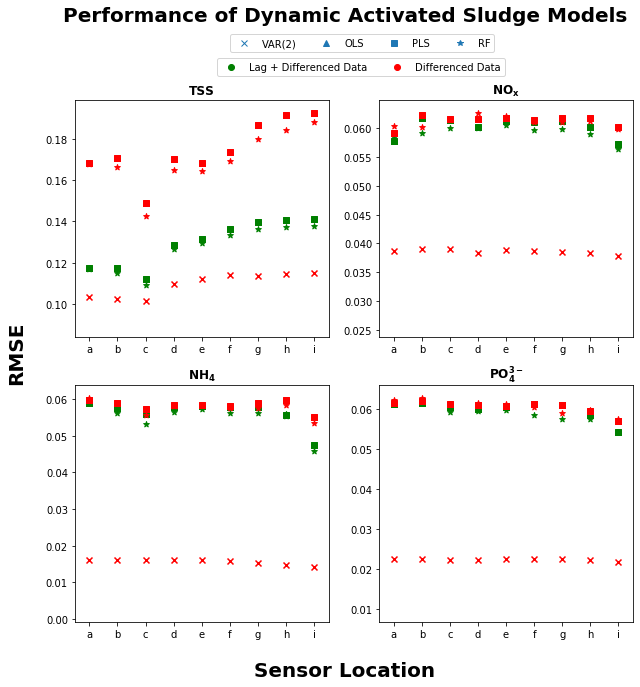

In [307]:
fig, ax = plt.subplots(2,2, figsize=(10,10))
variables = ['TSS','NOx','NH4','PO4']
index = [1,2,3,4,5,6,7,8,9]


fig.suptitle('Performance of Dynamic Activated Sludge Models', fontsize = 20, fontweight = 'bold')
ax = ax.ravel()
for i in range(4):
    ax[i].scatter(index, VAR_RMSE[variables[i]], marker = 'x',color = 'r')
    ax[i].scatter(index, OLS_lag_RMSE[variables[i]], marker = '^', color = 'g')
    ax[i].scatter(index, PLS_lag_RMSE[variables[i]], marker = 's', color = 'g')
    ax[i].scatter(index, RF_lag_RMSE[variables[i]], marker = '*', color = 'g')
    ax[i].scatter(index, OLS_dif_RMSE[variables[i]], marker = '^', color = 'r')
    ax[i].scatter(index, PLS_dif_RMSE[variables[i]], marker = 's', color = 'r')
    ax[i].scatter(index, RF_dif_RMSE[variables[i]], marker = '*', color = 'r')
    ax[i].set_xticks(index)
    ax[i].set_xticklabels(['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'])
    ax[i].set_title(Header_out[i], fontweight = 'bold')
    
fig.text(0.031, 0.5,'RMSE', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Sensor Location', ha = 'center', fontsize = 20, fontweight = 'bold')

legend_elements = [Line2D([0], [0],linestyle='None', marker = 'x', label = 'VAR(2)'),
                  Line2D([0],[0],linestyle='None', marker = '^', label = 'OLS'),
                  Line2D([0],[0], linestyle='None',marker = 's', label = 'PLS'),
                  Line2D([0],[0], linestyle='None',marker = '*', label = 'RF')]


legend_elements2 = [Line2D([0],[0], linestyle='None',marker = 'o', color = 'g',  label = 'Lag + Differenced Data'),
                  Line2D([0],[0], linestyle='None',marker = 'o', color = 'r', label = 'Differenced Data')]

legend2 = plt.legend(handles = legend_elements2,
                    loc = (-0.64, 2.3),
                    borderaxespad = 0.1,
                    ncol = 2)


legend1 = plt.legend(handles=legend_elements, 
          loc = (-0.59,2.4),
                    ncol = 4)

fig.add_artist(legend2)




fig.subplots_adjust(top=0.85)



### We can now import the initial modelling results to compare the improvement

In [308]:
Initial_OLS_RMSE = pd.read_csv('Initial_OLS_RMSE.csv', index_col = 0)
Initial_PLS_RMSE = pd.read_csv('Initial_PLS_RMSE.csv', index_col = 0)
Initial_KNN_RMSE = pd.read_csv('Initial_KNN_RMSE.csv', index_col = 0)
Initial_RF_RMSE = pd.read_csv('Initial_RF_RMSE.csv', index_col = 0)

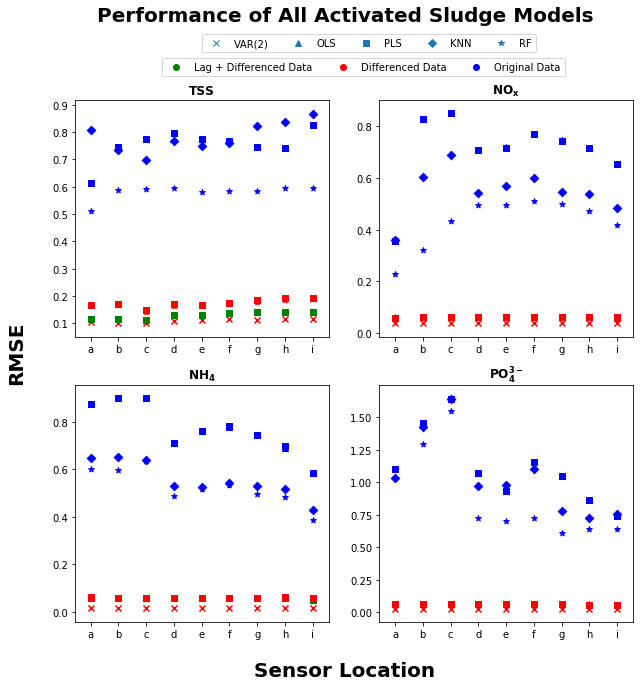

In [309]:
fig, ax = plt.subplots(2,2, figsize=(10,10))
variables = ['TSS','NOx','NH4','PO4']
index = [1,2,3,4,5,6,7,8,9]


fig.suptitle('Performance of All Activated Sludge Models', fontsize = 20, fontweight = 'bold')
ax = ax.ravel()
for i in range(4):
    ax[i].scatter(index, VAR_RMSE[variables[i]], marker = 'x',color = 'r')
    ax[i].scatter(index, OLS_lag_RMSE[variables[i]], marker = '^', color = 'g')
    ax[i].scatter(index, PLS_lag_RMSE[variables[i]], marker = 's', color = 'g')
    ax[i].scatter(index, RF_lag_RMSE[variables[i]], marker = '*', color = 'g')
    ax[i].scatter(index, OLS_dif_RMSE[variables[i]], marker = '^', color = 'r')
    ax[i].scatter(index, PLS_dif_RMSE[variables[i]], marker = 's', color = 'r')
    ax[i].scatter(index, RF_dif_RMSE[variables[i]], marker = '*', color = 'r')
    ax[i].scatter(index, Initial_OLS_RMSE[variables[i]], marker = '^', color = 'b')
    ax[i].scatter(index, Initial_PLS_RMSE[variables[i]], marker = 's', color = 'b')
    ax[i].scatter(index, Initial_KNN_RMSE[variables[i]], marker = 'D', color = 'b')
    ax[i].scatter(index, Initial_RF_RMSE[variables[i]], marker = '*', color = 'b')
    ax[i].set_xticks(index)
    ax[i].set_xticklabels(['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'])
    ax[i].set_title(Header_out[i], fontweight = 'bold')
    
fig.text(0.031, 0.5,'RMSE', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Sensor Location', ha = 'center', fontsize = 20, fontweight = 'bold')

legend_elements = [Line2D([0], [0],linestyle='None', marker = 'x', label = 'VAR(2)'),
                  Line2D([0],[0],linestyle='None', marker = '^', label = 'OLS'),
                  Line2D([0],[0], linestyle='None',marker = 's', label = 'PLS'),
                  Line2D([0],[0], linestyle='None',marker = 'D', label = 'KNN'),
                  Line2D([0],[0], linestyle='None',marker = '*', label = 'RF')]


legend_elements2 = [Line2D([0],[0], linestyle='None',marker = 'o', color = 'g',  label = 'Lag + Differenced Data'),
                  Line2D([0],[0], linestyle='None',marker = 'o', color = 'r', label = 'Differenced Data'),
                  Line2D([0],[0], linestyle='None',marker = 'o', color = 'b', label = 'Original Data')]

legend2 = plt.legend(handles = legend_elements2,
                    loc = (-0.855, 2.3),
                    borderaxespad = 0.1,
                    ncol = 3)


legend1 = plt.legend(handles=legend_elements, 
          loc = (-0.7,2.4),
                    ncol = 5)

fig.add_artist(legend2)


fig.subplots_adjust(top=0.85)

In [310]:
VAR_RMSE

,TSS,NOx,NH4,PO4
a,0.103252,0.038758,0.016031,0.022513
b,0.102480,0.038958,0.015965,0.022453
c,0.101425,0.039049,0.015985,0.022373
d,0.109824,0.038310,0.016119,0.022389
e,0.112016,0.038770,0.016061,0.022581
f,0.114265,0.038709,0.015843,0.022641
g,0.113821,0.038520,0.015307,0.022588
h,0.114428,0.038262,0.014623,0.022354
i,0.115222,0.037723,0.014246,0.021752


In [311]:
OLS_lag_RMSE

,TSS,NOx,NH4,PO4
a,0.117304,0.057863,0.058926,0.061152
b,0.117230,0.061745,0.057549,0.061486
c,0.112098,0.061443,0.055987,0.060514
d,0.128771,0.060161,0.057950,0.059945
e,0.131652,0.061283,0.058211,0.060458
f,0.136245,0.061157,0.057776,0.061195
g,0.139823,0.061334,0.057791,0.060990
h,0.140512,0.060316,0.055815,0.058532
i,0.140997,0.057319,0.047532,0.054231


In [312]:
PLS_lag_RMSE

,TSS,NOx,NH4,PO4
a,0.117311,0.057862,0.058923,0.061165
b,0.117275,0.061750,0.057547,0.061481
c,0.112219,0.061447,0.055985,0.060510
d,0.128801,0.060174,0.057958,0.059943
e,0.131686,0.061294,0.058211,0.060459
f,0.136304,0.061206,0.057794,0.061195
g,0.139824,0.061333,0.057792,0.060993
h,0.140519,0.060322,0.055744,0.058527
i,0.141014,0.057317,0.047523,0.054227


In [313]:
RF_lag_RMSE

,TSS,NOx,NH4,PO4
a,0.117161,0.058486,0.058934,0.061660
b,0.114830,0.059234,0.056296,0.061493
c,0.109239,0.060052,0.053216,0.059274
d,0.126833,0.059994,0.056612,0.059516
e,0.129550,0.060593,0.057246,0.059682
f,0.133203,0.059737,0.056217,0.058439
g,0.136568,0.059905,0.056139,0.057553
h,0.137235,0.059111,0.055511,0.057413
i,0.137656,0.056345,0.045785,0.054114


In [314]:
OLS_dif_RMSE

,TSS,NOx,NH4,PO4
a,0.168116,0.059274,0.059762,0.061521
b,0.170640,0.062376,0.058922,0.061983
c,0.149053,0.061714,0.057324,0.061171
d,0.170048,0.061697,0.058510,0.060874
e,0.168356,0.061818,0.058384,0.060787
f,0.173561,0.061458,0.058128,0.061092
g,0.186678,0.061861,0.059006,0.060844
h,0.191253,0.061761,0.059806,0.059566
i,0.192195,0.060268,0.055146,0.056883


In [315]:
PLS_dif_RMSE

,TSS,NOx,NH4,PO4
a,0.168116,0.059266,0.059765,0.061521
b,0.170640,0.062397,0.058939,0.061983
c,0.149040,0.061703,0.057324,0.061171
d,0.170057,0.061697,0.058510,0.060874
e,0.168356,0.061820,0.058385,0.060800
f,0.173560,0.061453,0.058133,0.061092
g,0.186683,0.061861,0.059005,0.060849
h,0.191256,0.061764,0.059806,0.059542
i,0.192204,0.060222,0.055120,0.056877


In [316]:
RF_dif_RMSE

,TSS,NOx,NH4,PO4
a,0.167876,0.060452,0.060274,0.062193
b,0.166094,0.060283,0.058851,0.062672
c,0.142767,0.061433,0.055732,0.061188
d,0.164625,0.062601,0.058205,0.061446
e,0.164451,0.062145,0.058357,0.061316
f,0.169277,0.061199,0.057691,0.060486
g,0.179802,0.061093,0.057722,0.059001
h,0.184179,0.061302,0.058540,0.059762
i,0.187937,0.059896,0.053585,0.057525


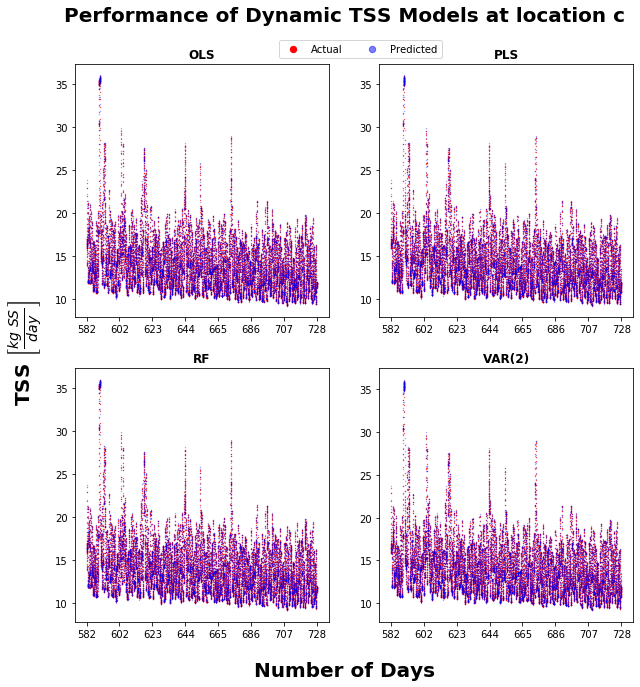

In [317]:
# Prediction plot for location C  TSS

x_axis = y_test.index.tolist()
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()
fig.suptitle('Performance of Dynamic TSS Models at location c', fontsize = 20, fontweight ='bold')
ax[0].scatter(x_axis, y_test['TSS'], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_c.OLS.TSS.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test['TSS'], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_c.PLS.TSS.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[2].scatter(x_axis, y_test['TSS'], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_c.RF.TSS.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test['TSS'], s = 0.1, color = 'r')
ax[3].scatter(x_axis, c_VAR.TSS.rev_pred, s = 0.1, color = 'b', alpha = 0.5)

titles = ['OLS','PLS','RF','VAR(2)']

fig.text(0.031, 0.5, 'TSS '+r'$\left[\frac{kg \, \, SS}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')

for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)


Text(0.5, 0.05, 'Predicted TSS $\\left[\\frac{kg \\, \\, SS}{day}\\right]$')

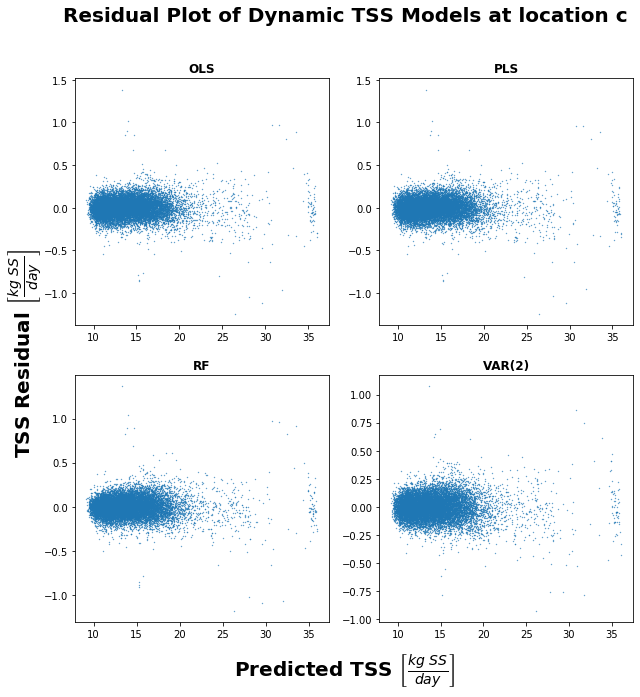

In [318]:
# Residual plot for dynamic models at location c TSS

fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle('Residual Plot of Dynamic TSS Models at location c', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_c.OLS.TSS.rev_preds, Lag_regression_c.OLS.TSS.residuals, s = 0.1)
ax[1].scatter(Lag_regression_c.PLS.TSS.rev_preds, Lag_regression_c.PLS.TSS.residuals, s = 0.1)
ax[2].scatter(Lag_regression_c.RF.TSS.rev_preds, Lag_regression_c.RF.TSS.residuals, s = 0.1)
ax[3].scatter(c_VAR.TSS.rev_pred, c_VAR.TSS.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')

fig.text(0.031, 0.5, 'TSS Residual '+r'$\left[\frac{kg \, \, SS}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,'Predicted TSS '+r'$\left[\frac{kg \, \, SS}{day}\right]$', ha = 'center', fontsize = 20, fontweight = 'bold')



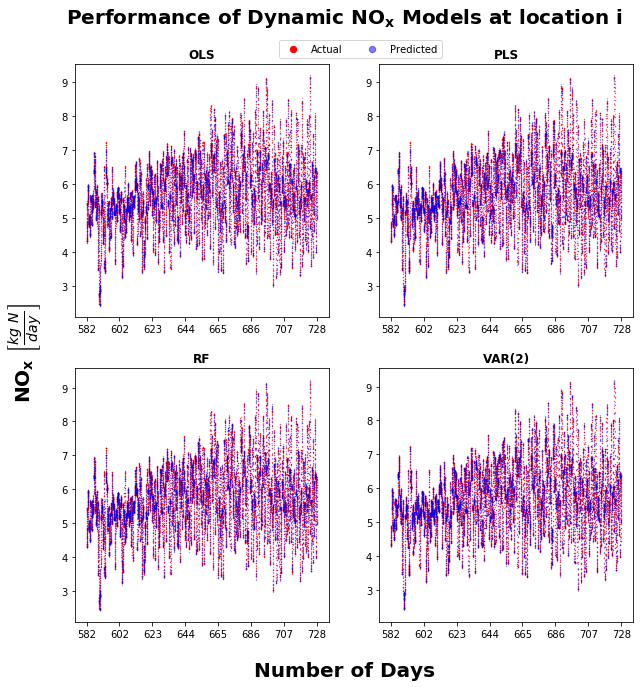

In [322]:
# Prediction plot for NOx location i

x_axis = y_test.index.tolist()
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()
fig.suptitle(r'Performance of Dynamic $\mathbf{NO_{x}}$ Models at location i', fontsize = 20, fontweight ='bold')
ax[0].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_i.OLS.NOx.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_i.PLS.NOx.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[2].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_i.RF.NOx.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[3].scatter(x_axis, i_VAR.NOx.rev_pred, s = 0.1, color = 'b', alpha = 0.5)

titles = ['OLS','PLS','RF','VAR(2)']

fig.text(0.031, 0.5, r'$\mathbf{NO_{x}}$ '+r'$\left[\frac{kg \, \, N}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')

for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)

Text(0.5, 0.05, 'Predicted $\\mathbf{NO_{x}}$ $\\left[\\frac{kg \\, \\, N}{day}\\right]$')

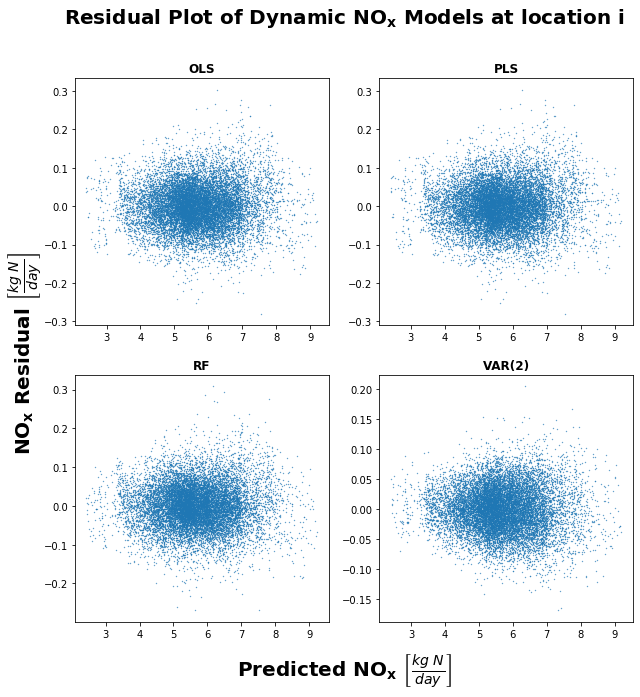

In [323]:
# Residual plot for dynamic NOx models at location a

fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle(r'Residual Plot of Dynamic $\mathbf{NO_{x}}$ Models at location i', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_i.OLS.NOx.rev_preds, Lag_regression_i.OLS.NOx.residuals, s = 0.1)
ax[1].scatter(Lag_regression_i.PLS.NOx.rev_preds, Lag_regression_i.PLS.NOx.residuals, s = 0.1)
ax[2].scatter(Lag_regression_i.RF.NOx.rev_preds, Lag_regression_i.RF.NOx.residuals, s = 0.1)
ax[3].scatter(i_VAR.NOx.rev_pred, i_VAR.NOx.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')

fig.text(0.031, 0.5, r'$\mathbf{NO_{x}}$ Residual '+r'$\left[\frac{kg \, \, N}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,r'Predicted $\mathbf{NO_{x}}$ '+r'$\left[\frac{kg \, \, N}{day}\right]$' , ha = 'center', fontsize = 20, fontweight = 'bold')



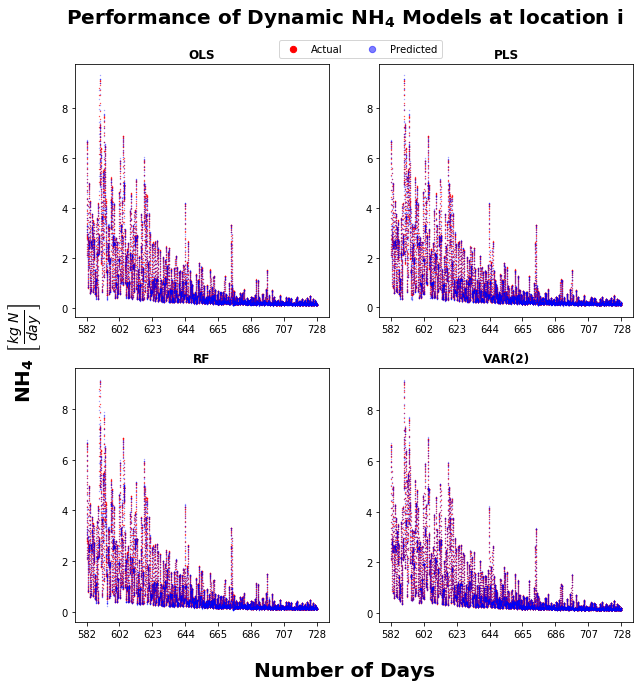

In [324]:
# Prediction plot for NH4 location i

x_axis = y_test.index.tolist()
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()
fig.suptitle(r'Performance of Dynamic $\mathbf{NH_{4}}$ Models at location i', fontsize = 20, fontweight ='bold')
ax[0].scatter(x_axis, y_test[y_test.columns.tolist()[2]], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_i.OLS.NH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test[y_test.columns.tolist()[2]], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_i.PLS.NH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[2].scatter(x_axis, y_test[y_test.columns.tolist()[2]], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_i.RF.NH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test[y_test.columns.tolist()[2]], s = 0.1, color = 'r')
ax[3].scatter(x_axis, i_VAR.NH4.rev_pred, s = 0.1, color = 'b', alpha = 0.5)

titles = ['OLS','PLS','RF','VAR(2)']

fig.text(0.031, 0.5, r'$\mathbf{NH_{4}}$ '+r'$\left[\frac{kg \, \, N}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')

for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)

Text(0.5, 0.05, 'Predicted $\\mathbf{NH_{4}}$ $\\left[\\frac{kg \\, \\, N}{day}\\right]$')

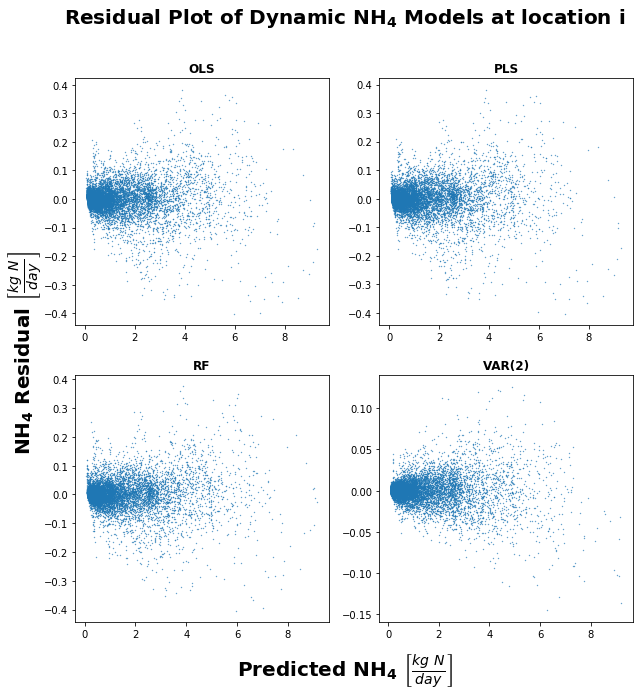

In [325]:
# Residual plot for dynamic NH4 models at location i

fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle(r'Residual Plot of Dynamic $\mathbf{NH_{4}}$ Models at location i', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_i.OLS.NH4.rev_preds, Lag_regression_i.OLS.NH4.residuals, s = 0.1)
ax[1].scatter(Lag_regression_i.PLS.NH4.rev_preds, Lag_regression_i.PLS.NH4.residuals, s = 0.1)
ax[2].scatter(Lag_regression_i.RF.NH4.rev_preds, Lag_regression_i.RF.NH4.residuals, s = 0.1)
ax[3].scatter(i_VAR.NH4.rev_pred, i_VAR.NH4.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')

fig.text(0.031, 0.5, r'$\mathbf{NH_{4}}$ Residual '+r'$\left[\frac{kg \, \, N}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,r'Predicted $\mathbf{NH_{4}}$ '+r'$\left[\frac{kg \, \, N}{day}\right]$' , ha = 'center', fontsize = 20, fontweight = 'bold')



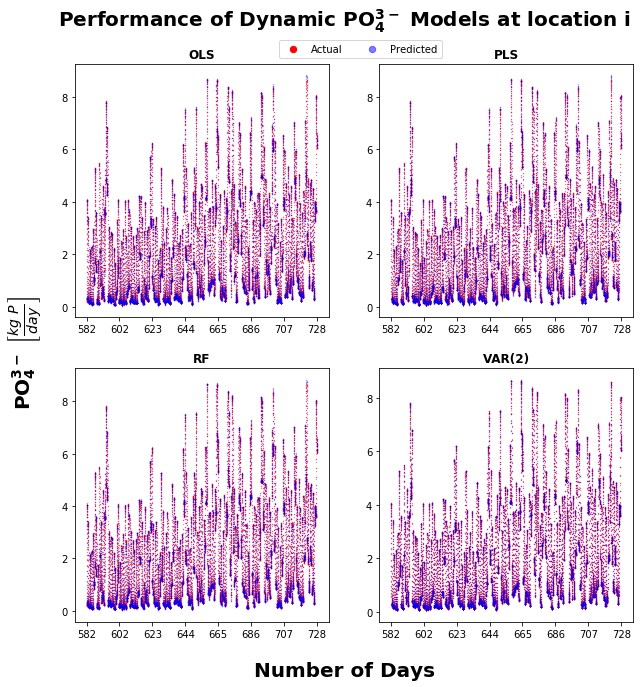

In [326]:
# Prediction plot for PO4 location i

x_axis = y_test.index.tolist()
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()
fig.suptitle(r'Performance of Dynamic $\mathbf{PO_{4}^{3-}}$ Models at location i', fontsize = 20, fontweight ='bold')
ax[0].scatter(x_axis, y_test[y_test.columns.tolist()[3]], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_i.OLS.PO4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test[y_test.columns.tolist()[3]], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_i.PLS.PO4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[2].scatter(x_axis, y_test[y_test.columns.tolist()[3]], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_i.RF.PO4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test[y_test.columns.tolist()[3]], s = 0.1, color = 'r')
ax[3].scatter(x_axis, i_VAR.PO4.rev_pred, s = 0.1, color = 'b', alpha = 0.5)

titles = ['OLS','PLS','RF','VAR(2)']

fig.text(0.031, 0.5, r'$\mathbf{PO_{4}^{3-}}$ '+r'$\left[\frac{kg \, \, P}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')

for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)

Text(0.5, 0.05, 'Predicted $\\mathbf{PO^{3-}_4}$ $\\left[\\frac{kg \\, \\, P}{day}\\right]$')

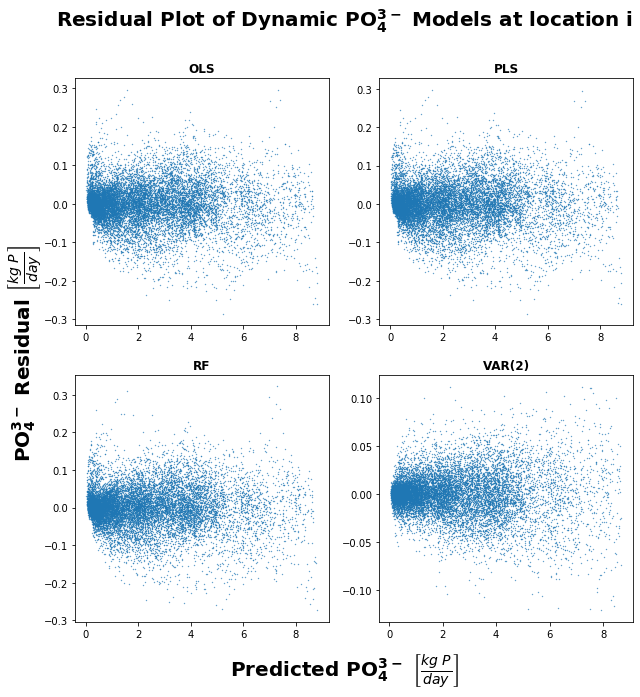

In [327]:
# Residual plot for dynamic PO4 models at location i

fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle(r'Residual Plot of Dynamic $\mathbf{PO_{4}^{3-}}$ Models at location i', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_i.OLS.PO4.rev_preds, Lag_regression_i.OLS.PO4.residuals, s = 0.1)
ax[1].scatter(Lag_regression_i.PLS.PO4.rev_preds, Lag_regression_i.PLS.PO4.residuals, s = 0.1)
ax[2].scatter(Lag_regression_i.RF.PO4.rev_preds, Lag_regression_i.RF.PO4.residuals, s = 0.1)
ax[3].scatter(i_VAR.PO4.rev_pred, i_VAR.PO4.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.text(0.031, 0.5, r'$\mathbf{PO^{3-}_4}$ Residual '+r'$\left[\frac{kg \, \, P}{day}\right]$', va = 'center', fontsize = 20, fontweight = 'bold', rotation = 'vertical')
fig.text(0.5, 0.05,r'Predicted $\mathbf{PO^{3-}_4}$ '+r'$\left[\frac{kg \, \, P}{day}\right]$' , ha = 'center', fontsize = 20, fontweight = 'bold')




### Comparison of the models

#### Comparison of TSS models

In [328]:
RF_lag_RMSE['TSS']['c']/Initial_RF_RMSE['TSS']['c']

0.18518967245187495

In [329]:
RF_dif_RMSE['TSS']['c']/Initial_RF_RMSE['TSS']['c']

0.24202737778391137

In [330]:
RF_lag_RMSE['TSS']['c']/RF_dif_RMSE['TSS']['c']

0.7651600168027988

In [331]:
np.mean(np.abs(Lag_regression_c.RF.TSS.residuals/y_test['TSS']))*100

0.5674008290854742

The mean average percentage error is 0.57 % for the lagged RF regression model at location c

In [75]:
np.mean(np.abs(c_VAR.TSS.residuals/y_test['TSS']))*100

0.5411359363621718

The mean average percentage error is 0.54 % for the VAR model at location c

### Comparison of NOx models

In [77]:
RF_lag_RMSE['NOx']['i']/Initial_RF_RMSE['NOx']['a']

NameError: name 'RF_lag_RMSE' is not defined

In [339]:
RF_dif_RMSE['NOx']['i']/Initial_RF_RMSE['NOx']['a']

0.2649853412061137

In [340]:
RF_lag_RMSE['NOx']['i']/RF_dif_RMSE['NOx']['i']

0.9407215544318352

In [341]:
np.mean(np.abs(Lag_regression_i.RF.NOx.residuals/y_test[y_test.columns.tolist()[1]]))*100

0.7849331786377626

The mean average percentage error is 0.78 % for the lagged RF regression model at location a

In [78]:
np.mean(np.abs(i_VAR.NOx.residuals/y_test[y_test.columns.tolist()[1]]))*100

0.5309996738649599

In [79]:
i_VAR.NOx.RMSE

0.03772269360922999

The mean average percentage error is 0.53% for the VAR model at location i 

### Comparison of NH4 models

In [343]:
RF_lag_RMSE['NH4']['i']/Initial_RF_RMSE['NH4']['i']

0.11895953418764575

In [344]:
RF_dif_RMSE['NH4']['i']/Initial_RF_RMSE['NH4']['i']

0.13922598835656969

In [345]:
RF_lag_RMSE['NH4']['i']/RF_dif_RMSE['NH4']['i']

0.854434833552628

In [346]:
np.mean(np.abs(Lag_regression_i.RF.NH4.residuals/y_test[y_test.columns.tolist()[2]]))*100

3.3236110983963085

In [81]:
i_VAR.NH4.RMSE

0.014246085731026136

The mean average percentage error is 3.32% for the lagged RF regression model at location i

In [82]:
np.mean(np.abs(i_VAR.NH4.residuals/y_test[y_test.columns.tolist()[2]]))*100

1.0854301503945627

The mean average percentage errorr is 1.09% for the VAR model at location i

### Comparison of PO4 models

In [348]:
RF_lag_RMSE['PO4']['i']/Initial_RF_RMSE['PO4']['g']

0.08861520814824715

In [349]:
RF_dif_RMSE['PO4']['i']/Initial_RF_RMSE['PO4']['g']

0.09420064498222366

In [350]:
RF_lag_RMSE['PO4']['i']/RF_dif_RMSE['PO4']['i']

0.9407070213263347

In [353]:
np.mean(np.abs(Lag_regression_i.RF.PO4.residuals/y_test[y_test.columns.tolist()[3]]))*100

3.4139310094318414

The mean percentage error is 3.4% for the lagged RF regression model at location a

In [83]:
np.mean(np.abs(i_VAR.PO4.residuals/y_test[y_test.columns.tolist()[3]]))*100

1.1582405243891642

The mean percentage error is 1.16% for the VAR model at location i

In [355]:
dict_PLS_n_components = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}

dict_models = {'a_model':Lag_regression_a, 
       'b_model':Lag_regression_b, 
       'c_model':Lag_regression_c, 
       'd_model':Lag_regression_d,
       'e_model':Lag_regression_e,
       'f_model':Lag_regression_f, 
       'g_model':Lag_regression_g,
       'h_model':Lag_regression_h,
       'i_model':Lag_regression_i}
dict_list = list(dict_models.keys())

In [356]:
dict_rf_feature_importance = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_rf_max_features = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_KNN_neighbors = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_PLS_n_components = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_OLS_beta_intercept = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}

for attr, value in Lag_regression_a.PLS.__dict__.items():
      dict_PLS_n_components[attr] = Lag_regression_a.PLS.TSS.grid.best_estimator_['clf'].n_components

In [357]:
for key in dict_models:
    for attr, value in dict_models[key].PLS.__dict__.items():
        d = value.grid.best_estimator_['clf'].n_components
        dict_PLS_n_components[attr] = np.vstack((dict_PLS_n_components[attr],d));
        
        
        
#This deletes the first duplicate column
for key in dict_PLS_n_components:
    dict_PLS_n_components[key] = np.delete(dict_PLS_n_components[key], (0), axis = 0)
    

In [358]:
a = np.hstack((dict_PLS_n_components['TSS'],dict_PLS_n_components['NOx'], dict_PLS_n_components['NH4'],dict_PLS_n_components['PO4']))
pd.DataFrame(a, index = ['a', 'b','c','d','e','f','g','h','i'], columns = Header_out)

,TSS,$\mathbf{NO_x}$,$\mathbf{NH_4}$,$\mathbf{PO^{3-}_4}$
a,9,7,5,6
b,9,5,9,9
c,5,6,9,9
d,9,7,9,9
e,8,8,8,8
f,9,8,9,9
g,9,6,9,9
h,9,9,9,9
i,7,9,9,9


In [359]:
dict_PLS_n_components = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}

dict_models = {'a_model':Diff_regression_a, 
       'b_model':Diff_regression_b, 
       'c_model':Diff_regression_c, 
       'd_model':Diff_regression_d,
       'e_model':Diff_regression_e,
       'f_model':Diff_regression_f, 
       'g_model':Diff_regression_g,
       'h_model':Diff_regression_h,
       'i_model':Diff_regression_i}
dict_list = list(dict_models.keys())

In [360]:
dict_rf_feature_importance = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_rf_max_features = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_KNN_neighbors = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_PLS_n_components = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}
dict_OLS_beta_intercept = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}

for attr, value in Lag_regression_a.PLS.__dict__.items():
      dict_PLS_n_components[attr] = Diff_regression_a.PLS.TSS.grid.best_estimator_['clf'].n_components
      dict_rf_feature_importance[attr] = Diff_regression_a.RF.TSS.clf.feature_importances_

In [361]:
for key in dict_models:
    for attr, value in dict_models[key].PLS.__dict__.items():
        d = value.grid.best_estimator_['clf'].n_components
        dict_PLS_n_components[attr] = np.vstack((dict_PLS_n_components[attr],d));
        

for key in dict_models:
    for attr, value in dict_models[key].RF.__dict__.items():
        e = value.final.feature_importances_
        dict_rf_feature_importance[attr] = np.vstack((dict_rf_feature_importance[attr],e))
        
        
#This deletes the first duplicate column
for key in dict_PLS_n_components:
    dict_PLS_n_components[key] = np.delete(dict_PLS_n_components[key], (0), axis = 0)
    dict_rf_feature_importance[key] = np.delete(dict_rf_feature_importance[key], (0), axis = 0)

In [362]:
a = np.hstack((dict_PLS_n_components['TSS'],dict_PLS_n_components['NOx'], dict_PLS_n_components['NH4'],dict_PLS_n_components['PO4']))
pd.DataFrame(a, index = ['a', 'b','c','d','e','f','g','h','i'], columns = Header_out)

,TSS,$\mathbf{NO_x}$,$\mathbf{NH_4}$,$\mathbf{PO^{3-}_4}$
a,7,5,4,7
b,7,3,3,6
c,4,3,7,7
d,4,7,6,6
e,7,4,5,4
f,5,3,5,7
g,5,4,6,5
h,5,3,5,3
i,5,3,3,3


In [8]:
dict_linreg = {'TSS':[],'NOx':[],'NH4':[],'PO4':[]}

for key in dict_models:
    for attr, value, in dict_models[key].OLS.__dict__.items():
        a = value.final.coef_
        a = np.append(a, value.clf.intercept_)
        dict_linreg[attr] = np.append(dict_linreg[attr],a)
        
cols = ['Q','T','TSS',r'$\mathbf{NO_{x}}$', r'$\mathbf{NH_4}$', r'$\mathbf{CH_3COO^-}$', r'$\mathbf{PO^{3-}_4}$', 'kLa', 'pH', 'Intercept']
index = ['a','b','c','d','e','f','g','h','i']
for key in dict_linreg:
    dict_linreg[key] = dict_linreg[key].reshape(9,10)

NameError: name 'dict_models' is not defined

In [1]:
import plotly.io as pio
pio.renderers.default='notebook'

In [2]:
fig = ff.create_annotated_heatmap(np.round(dict_linreg['TSS'],2), x = cols, y = index)
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of OLS coefficients and Intercept for TSS Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

NameError: name 'ff' is not defined

In [ ]:
fig = ff.create_annotated_heatmap(np.round(dict_linreg['NOx'],2), x = cols, y = index)
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of OLS coefficients and Intercept for }NO_x \text{ Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

In [ ]:
fig = ff.create_annotated_heatmap(np.round(dict_linreg['NH4'],2), x = cols, y = index)
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of OLS coefficients and Intercept for }NH_4 \text{ Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

In [3]:
fig = ff.create_annotated_heatmap(np.round(dict_linreg['PO4'],2), x = cols, y = index)
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of OLS coefficients and Intercept for }PO_4^{3-} \text{ Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

NameError: name 'ff' is not defined

In [4]:
fig = ff.create_annotated_heatmap( np.round(dict_rf_feature_importance['TSS'],2),  x= Header_X_in, y  = ['a', 'b','c','d','e','f','g','h','i'])
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of Random Forest Feature Importance for TSS Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

NameError: name 'ff' is not defined

In [5]:
fig = ff.create_annotated_heatmap( np.round(dict_rf_feature_importance['NOx'],2),  x= Header_X_in, y  = ['a', 'b','c','d','e','f','g','h','i'])
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of Random Forest Feature Importance for } NO_x \text{ Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

NameError: name 'ff' is not defined

In [6]:
fig = ff.create_annotated_heatmap( np.round(dict_rf_feature_importance['NH4'],2),  x= Header_X_in, y  = ['a', 'b','c','d','e','f','g','h','i'])
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of Random Forest Feature Importance for } NH_4 \text{ Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

NameError: name 'ff' is not defined

In [7]:
fig = ff.create_annotated_heatmap( np.round(dict_rf_feature_importance['PO4'],2),  x= Header_X_in, y  = ['a', 'b','c','d','e','f','g','h','i'])
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of Random Forest Feature Importance for } PO_4^{3-} \text{ Models on Differenced Data}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Sensor Location'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=15,
        color="#7f7f7f"
    )

fig.show()

NameError: name 'ff' is not defined

In [36]:
pd.DataFrame(a_VAR.final.acorr()[1])

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.790148,-0.014935,-0.659597,-0.618504,0.392892,0.372214,0.333561,-0.146822,0.554005,-0.013883,-0.061999,0.007446
1,-0.014703,-0.495794,0.023655,0.018116,-0.010974,-0.010300,-0.011170,0.004060,-0.006744,0.001687,-0.001101,0.001395
2,-0.529122,0.012394,0.716511,0.387368,-0.384287,-0.428339,-0.320145,0.087599,-0.165212,-0.011520,0.013787,-0.005949
3,-0.614705,0.016788,0.530112,0.822047,-0.415491,-0.314444,-0.335905,0.111448,-0.342488,0.297342,0.029492,0.092241
4,0.206369,-0.004241,-0.320540,-0.270289,0.831351,0.563798,0.299897,0.190198,-0.091233,-0.119622,-0.076068,-0.037037
5,0.108258,-0.001091,-0.289062,-0.127934,0.531310,0.837881,0.328458,-0.052149,-0.207782,-0.025570,-0.057172,0.022586
6,0.207870,-0.005324,-0.294738,-0.234172,0.314632,0.363860,0.817622,-0.156219,-0.032839,-0.028562,0.006114,0.005241
7,-0.154813,0.004814,0.136257,0.123600,0.157076,-0.104373,-0.186523,-0.171639,-0.091859,-0.065317,-0.051706,0.006439
8,0.843497,-0.011751,-0.489500,-0.559199,0.194115,0.132608,0.174820,-0.137266,0.847463,-0.043252,-0.121096,0.044474
9,-0.028242,-0.000227,-0.011593,0.298637,-0.147847,-0.044467,-0.034327,-0.075592,-0.061087,0.729757,0.060158,0.007857
